# Marmo Model-based eye correction

Update of original eye correction using verified stimulus. Streamlined version of MarmoEyeCorrect0 (Jan 30 2020)

In [1]:
# Import the rest
from __future__ import print_function
from __future__ import division

import sys

sys.path.insert(0, '/home/dbutts/Code/')
import NDN3.NDNutils as NDNutils
which_gpu = NDNutils.assign_gpu()
#NDNutils.setup_no_gpu()


import os
import h5py
import numpy as np
import tensorflow as tf
import scipy.io as sio           # importing matlab data
import matplotlib.pyplot as plt  # plotting
%matplotlib inline
from copy import deepcopy

import time
import random
import NDN3.NDN as NDN
#import TNDN as TNDN
import NDN3.Utils.DanUtils as DU
import NDN3.Utils.NDNplot as NDNplot
output_dir = '/home/dbutts/V1/pkls/output_dir' + str(which_gpu)
print(output_dir)

*******************************************************************************************
---> getting list of available GPUs:
[0, 1]

---> getting GPU memory map:
{0: 373, 1: 463}

---> setting up GPU with largest available memory:
   ...picking GPU # 0
*******************************************************************************************

Done!
/home/dbutts/V1/pkls/output_dir0


In [2]:
dirname = '/home/dbutts/Marmo/'
os.chdir(dirname)
matdat=sio.loadmat('Data/L20191231_GaborL.mat')
stim1 = matdat['stim'].copy()
Robs1 = matdat['Robs'].copy()
valdat1 = matdat['valdata'].copy()
labels1 = matdat['labels'].copy()
valid1 = np.intersect1d(np.where(valdat1[:,0] == 1)[0], np.where(labels1[:,0] == 1)[0])
slist1 = matdat['slist'].astype(int)
dt = matdat['dt'][0][0]
NY = matdat['NX'][0][0].astype(int)
NP = stim1.shape[1]
ets1 = matdat['eyeAtFrame']
NX = (NP//NY).astype(int)
NT1,NCfull = Robs1.shape

matdat = sio.loadmat('Data/L20191231_GratingL.mat')
stim2 = matdat['stim'].copy()
Robs2 = matdat['Robs'].copy()
valdat2 = matdat['valdata'].copy()
labels2 = matdat['labels'].copy()
valid2 = np.intersect1d(np.where(valdat2[:,0] == 1)[0], np.where(labels2[:,0] == 1)[0])
slist2 = matdat['slist'].astype(int)
ets2 = matdat['eyeAtFrame']
NT2 = Robs2.shape[0]
print(NT1, NT2, NCfull,'|', NX, NY)

matdat = sio.loadmat('Data/L20191231_BackImageL.mat')
stim3 = matdat['stim'].copy()
Robs3 = matdat['Robs'].copy()
valdat3 = matdat['valdata'].copy()
labels3 = matdat['labels'].copy()
valid3 = np.intersect1d(np.where(valdat3[:,0] == 1)[0], np.where(labels3[:,0] == 1)[0])
slist3 = matdat['slist'].astype(int)
ets3 = matdat['eyeAtFrame']
NT3 = Robs3.shape[0]
print(NT1, NT2, NT3, '|', NCfull, '|', NX, NY)

matdat = sio.loadmat('Data/L20191231_FixRsvpStim.mat')
stim4 = matdat['stim'].copy()
Robs4 = matdat['Robs'].copy()
valdat4 = matdat['valdata'].copy()
labels4 = matdat['labels'].copy()
valid4 = np.intersect1d(np.where(valdat4[:,0] == 1)[0], np.where(labels4[:,0] == 1)[0])
slist4 = matdat['slist'].astype(int)
ets4 = matdat['eyeAtFrame']
NT4 = Robs4.shape[0]
print(NT1, NT2, NT3, NT4, '|', NCfull, '|', NX, NY)

96984 77295 61 | 40 40
96984 77295 109151 | 61 | 40 40
96984 77295 109151 5275 | 61 | 40 40


In [3]:
matdat = sio.loadmat(dirname+'Data/valcell1231.mat')
valcell = matdat['valcell'][0,:]
NC = len(valcell)
print(NC, 'selected')

58 selected


In [4]:
# Filter data assuming eye tracking is good within certain radius: still using 3.1 deg (although easy to update)
# Determine valid indices based on eye position
#valid_eye_rad = 2.5  # degrees
valid_eye_rad = 10.0  # degrees -- use this when looking at eye-calibration (see below)
pixPerDeg = 37.50476617061
# Radial eye position (in degrees)
er1s = np.divide(np.sqrt(np.add(np.square(ets1[:,0]-640), np.square(ets1[:,1]-360))), pixPerDeg)
er2s = np.divide(np.sqrt(np.add(np.square(ets2[:,0]-640), np.square(ets2[:,1]-360))), pixPerDeg)
#er3s = np.divide(np.sqrt(np.add(np.square(ets3[:,0]-640), np.square(ets3[:,1]-360))), pixPerDeg)

# Selection of valid indices where eye tracker estimated to be valid
eyeval1 = np.intersect1d(valid1, np.where(er1s < valid_eye_rad)[0])
eyeval2 = np.intersect1d(valid2, np.where(er2s < valid_eye_rad)[0])
#eyeval3 = np.intersect1d(valid3, np.where(er3s < valid_eye_rad)[0])
print("%d -> %d (%0.2f of total data)"%(len(valid1), len(eyeval1), len(eyeval1)/len(valid1)))
print("%d -> %d (%0.2f)"%(len(valid2), len(eyeval2), len(eyeval2)/len(valid2)))
#print("%d -> %d (%0.2f)"%(len(valid3), len(eyeval3), len(eyeval3)/len(valid3)))
# Make train and test inds for each trial
Uinds1, Xinds1 = NDNutils.generate_xv_folds(len(eyeval1), num_blocks=2)
Uinds2, Xinds2 = NDNutils.generate_xv_folds(len(eyeval2), num_blocks=2)
#Uinds3, Xinds3 = NDNutils.generate_xv_folds(len(eyeval3), num_blocks=2)

78468 -> 77583 (0.99 of total data)
60032 -> 59008 (0.98)


In [5]:
### Concatenate data: 2 conditions
spaceL = 60
Sspacer = np.zeros([spaceL, NP], dtype='float32')
Rspacer = np.zeros([spaceL, NCfull], dtype='float32')

RobsAll = np.concatenate( (Robs1, Rspacer, Robs2), axis=0)
# Assemble valid data and translate Ui's and Xi's 
valdata = np.concatenate( (eyeval1, eyeval2+NT1+spaceL), axis=0 )
Ui1, Xi1 = Uinds1.copy(), Xinds1.copy()
Ui2, Xi2 = Uinds2.copy()+len(eyeval1), Xinds2.copy()+len(eyeval1)
Ui = np.concatenate((Ui1, Ui2), axis=0)
Xi = np.concatenate((Xi1, Xi2), axis=0)

stim = np.concatenate( (stim1.copy(), Sspacer.copy(), stim2.copy()), axis=0)
stim_norm = np.std(stim[valdata,:], axis=0)
stim = np.divide( stim, stim_norm)

NTfull = stim.shape[0]
NT = valdata.shape[0]

# Process saccades -- just store sacc offsets as delta functions
sac_on, sac_off = np.zeros([NTfull,1], dtype='float32'), np.zeros([NTfull,1], dtype='float32')
for nn in range(slist1.shape[0]):
    sac_on[slist1[nn,0]-1] = 1.0
    sac_off[slist1[nn,1]-1] = 1.0
for nn in range(slist2.shape[0]):
    sac_on[slist2[nn,0]-1+NT1+spaceL] = 1.0
    sac_off[slist2[nn,1]-1+NT1+spaceL] = 1.0
    
ex = np.concatenate( (ets1[:,0].copy(), Sspacer[:,0], ets2[:,0].copy()), axis=0)-640
ey = np.concatenate( (ets1[:,1].copy(), Sspacer[:,0], ets2[:,1].copy()), axis=0)-360
print("Data size: %d (%d valid)"%(NTfull, NT) )
print("Train: %6d (%5d+%5d)"%(len(Ui), len(Ui1), len(Ui2)))
print("Test:  %6d (%5d+%5d)"%(len(Xi), len(Xi1), len(Xi2)))

Data size: 174339 (136591 valid)
Train: 109273 (62067+47206)
Test:   27318 (15516+11802)


In [6]:
# Eliminate low-firing-rate cells (already imported earlier)
#Nspks = np.sum(RobsAll[valdata,:],axis=0)
#valcell = np.where(Nspks > 500)[0]  # arbitrary cutoff at this point...
#NC = len(valcell)
Robs = RobsAll[:,valcell]
#print( "%d out of %d cells selected"%(NC, RobsAll.shape[1]) )

In [7]:
adam_params = NDN.NDN.optimizer_defaults(opt_params={'use_gpu': True}, learning_alg='adam')

early_stopping = 100

adam_params['batch_size'] = NT // 100
adam_params['display'] = 30
adam_params['epochs_training'] = early_stopping * 100
adam_params['run_diagnostics'] = False

adam_params['epsilon'] = 1e-8
adam_params['early_stop'] = early_stopping
adam_params['early_stop_mode'] = 1
#adam_params['data_pipe_type'] = 'iterator'
adam_params['data_pipe_type'] = 'data_as_var'
adam_params['learning_rate'] = 1e-3
#adam_params['epochs_summary'] = 5
for d in adam_params:
    print("%20s:\t %s" %(d, adam_params[d]))

lbfgs_params = NDN.NDN.optimizer_defaults(opt_params={'use_gpu': True, 'display': True}, learning_alg='lbfgs')
lbfgs_params['maxiter'] = 1000
print('\nLBFGS:')
for d in lbfgs_params:
    print("%20s:\t %s" %(d, lbfgs_params[d]))

             use_gpu:	 True
             display:	 30
      data_pipe_type:	 data_as_var
   poisson_unit_norm:	 None
         epochs_ckpt:	 None
       learning_rate:	 0.001
          batch_size:	 1365
     epochs_training:	 10000
     early_stop_mode:	 1
      epochs_summary:	 None
          early_stop:	 100
               beta1:	 0.9
               beta2:	 0.999
             epsilon:	 1e-08
     run_diagnostics:	 False

LBFGS:
             use_gpu:	 True
             display:	 True
      data_pipe_type:	 data_as_var
   poisson_unit_norm:	 None
         epochs_ckpt:	 None
             maxiter:	 1000
            func_tol:	 2.220446049250313e-09
            grad_tol:	 1e-05
                 eps:	 1e-08
          batch_size:	 None


In [8]:
def conv_expand( ws, num_sp ):
    # this will be arranged in num points by num filters: want to add space to the mix, preserving first dimes
    NT, num_filt = ws.shape
    expanded = np.reshape(
        np.matmul(np.ones([1, num_sp, 1], dtype='float32'), np.expand_dims(ws, 1)), 
        [NT, num_filt*num_sp])
    return expanded

## Setup for testing eye-calibraton -- scaffold model NIM

In [9]:
num_lags = 10
Xstim = NDNutils.create_time_embedding(stim, [num_lags, NX, NX], tent_spacing=1)

In [34]:
# Scaffold model -- only the second network is non-convolutional
base_mod = NDN.NDN.load_model(dirname+'pkls/d1231csn0.pkl')

scaff_par = deepcopy(base_mod.network_list[0])
scaff_par['input_dims'] = [1, 40, 40] + [scaff_par['input_dims'][-1]]
scaff_par['layer_types']=['conv', 'conv']
scaff_par['conv_filter_widths'] = [24, 1]
num_space = np.prod(netlist_old['input_dims'][1:3])

side_par = deepcopy(base_mod.network_list[1])
side_par['layer_types'] = ['conv']
side_par['conv_filter_widths'] = [1]
#side_par['layer_sizes'][-1] = NC*NX*NX

cell_shift_mod = NDN.NDN( [scaff_par, side_par], ffnet_out=1, noise_dist='poisson' )
# copy first network verbatim (only thing diff is output is a convolution)
cell_shift_mod.networks[0].layers[0].weights = deepcopy(base_mod.networks[0].layers[0].weights)
cell_shift_mod.networks[0].layers[0].biases = deepcopy(base_mod.networks[0].layers[0].biases)
cell_shift_mod.networks[0].layers[1].weights = deepcopy(base_mod.networks[0].layers[1].weights)
cell_shift_mod.networks[0].layers[1].biases = deepcopy(base_mod.networks[0].layers[1].biases)
cell_shift_mod.networks[1].layers[0].weights = deepcopy(base_mod.networks[1].layers[0].weights)
cell_shift_mod.networks[1].layers[0].biases = deepcopy(base_mod.networks[1].layers[0].biases)

#cell_shift_mod.networks[1].layers[0].weights = conv_expand(
#    base_mod.networks[1].layers[0].weights.copy(), num_space)
#cell_shift_mod.networks[1].layers[0].biases = conv_expand(
#    base_mod.networks[1].layers[0].biases.copy(), num_space)

# Setup model for testing eye calibration -- full saccade model

In [9]:
num_lags = 10
Xstim = NDNutils.create_time_embedding(stim, [num_lags, NX, NX], tent_spacing=1)

In [10]:
num_saclags = 20
Xsac1 = NDNutils.create_time_embedding(sac_on, [num_saclags, 1, 1], tent_spacing=1)
Xsac2 = NDNutils.create_time_embedding(sac_off, [num_saclags, 1, 1], tent_spacing=1)

In [11]:
base_mod = NDN.NDN.load_model(dirname+'sacnim0_add.pkl')

# Construct new model to be spatially convolutional (with output for each spatial position)
# note there will be a way to have this automated, but at the moment have to do model-term by model-term
netlist_old = deepcopy(base_mod.network_list[0])
num_space = np.prod(netlist_old['input_dims'][1:3])
new_layer_sizes = netlist_old['layer_sizes'][:2] + [NC]  # doesnt change
afuncs = netlist_old['activation_funcs'].copy() 
newNetList = NDNutils.ffnetwork_params( 
    input_dims=netlist_old['input_dims'], layer_sizes=new_layer_sizes, ei_layers=netlist_old['num_inh'],
    act_funcs=afuncs, normalization = netlist_old['normalize_weights'],
    layer_types=['conv']*3, conv_filter_widths=[1, NX, 1] )
newNetList['pos_constraints'] = deepcopy(netlist_old['pos_constraints'])
newNet2 = deepcopy(base_mod.network_list[1])
newNet2['layer_sizes'][-1] = [NC,NX,NX]
newNet3 = deepcopy(base_mod.network_list[2])
newNet3['layer_sizes'][-1] = [NC,NX,NX]
newNet4 = deepcopy(base_mod.network_list[3])
newNet4['input_dims'] = None
newNet4['layer_sizes'][-1] = NC*NX*NX

cell_shift_mod = NDN.NDN( [newNetList, newNet2, newNet3, newNet4], ffnet_out=3, noise_dist='poisson' )
# copy first network verbatim (only thing diff is output is a convolution)
cell_shift_mod.networks[0].layers[0].weights = deepcopy(base_mod.networks[0].layers[0].weights)
cell_shift_mod.networks[0].layers[1].weights = deepcopy(base_mod.networks[0].layers[1].weights)
cell_shift_mod.networks[0].layers[1].biases = deepcopy(base_mod.networks[0].layers[1].biases)
cell_shift_mod.networks[0].layers[2].weights = deepcopy(base_mod.networks[0].layers[2].weights)
cell_shift_mod.networks[0].layers[2].biases = deepcopy(base_mod.networks[0].layers[2].biases)
# Handle sac-layers
for nn in range(1,3):
    cell_shift_mod.networks[nn].layers[0].weights = deepcopy(base_mod.networks[nn].layers[0].weights)
    cell_shift_mod.networks[nn].layers[0].biases = deepcopy(base_mod.networks[nn].layers[0].biases)
    cell_shift_mod.networks[nn].layers[1].weights = conv_expand(
        deepcopy(base_mod.networks[nn].layers[1].weights), num_space)
    cell_shift_mod.networks[nn].layers[1].biases = conv_expand(
        deepcopy(base_mod.networks[nn].layers[1].biases), num_space)
# output layer: just biases
cell_shift_mod.networks[3].layers[0].weights = conv_expand(
    base_mod.networks[3].layers[0].weights.copy(), num_space)
cell_shift_mod.networks[3].layers[0].biases = conv_expand(
    base_mod.networks[3].layers[0].biases.copy(), num_space)

Input dimensions: [1, 40, 40, 10]
0: conv (lin):  	[E2/I0] N  	filter width = 1
1: conv (relu):  	[E14/I2] N+  	filter width = 40
2: conv (lin):  	[E58/I0] +  	filter width = 1


-1 -2 -3.3418274


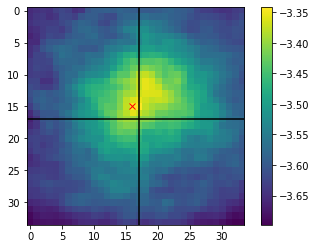

In [12]:
# Check likelihood map for models fit to all data (this should hopefully be centered at 0) -- ORIGINAL (XstimL)
x0 = 100.0
y0 = 20.0
Erad = 30.0# in pixels
rs = np.sqrt(np.add(np.square(ex-x0), np.square(ey-y0)))
valE = np.where(rs < Erad)[0]
valtot = np.intersect1d(valdata, valE)
#print(len(valE), len(valtot))

mod2 = base_mod.copy_model()
mod2.set_poisson_norm(Robs[valtot,:])

crop_edge=3
Rcc = conv_expand( Robs[valtot,:], num_space )
preds = cell_shift_mod.generate_prediction(input_data=[Xstim[valtot,:], Xsac1[valtot,:], Xsac2[valtot,:]])
Nspks = np.maximum(np.sum(Rcc,axis=0), 1)
LLs = np.divide( np.sum(np.add(np.multiply(Rcc, np.log(np.maximum(preds,1e-12))), -preds), axis=0), Nspks)
LLsp = np.mean( np.reshape(LLs,[NX,NX,NC]), axis=2)
tmp = LLsp[crop_edge:-crop_edge,:]
LLcrop = tmp[:,crop_edge:-crop_edge]

plt.imshow(LLcrop)
plt.colorbar()

min1 = np.argmax(np.max(LLcrop,axis=0))
min2 = np.argmax(np.max(LLcrop,axis=1))
print(min1-NX//2+crop_edge,min2-NX//2+crop_edge, np.max(LLcrop))
plt.imshow(LLcrop)
plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
plt.plot(min1,min2,'rx')

plt.show()

In [13]:
locs = list(range(-240,260,20))
Npos = len(locs)
print(Npos, locs)

25 [-240, -220, -200, -180, -160, -140, -120, -100, -80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]


-240 -240 (3): 	(-2, 12)


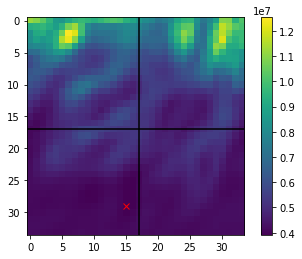

-240 -200 (73): 	( 0, 16)


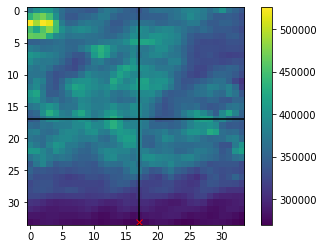

-240 -180 (227): 	( 8,  6)


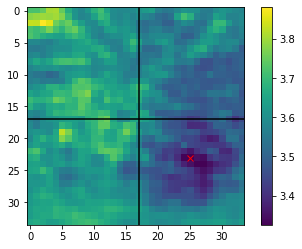

-240 -160 (303): 	( 9,  8)


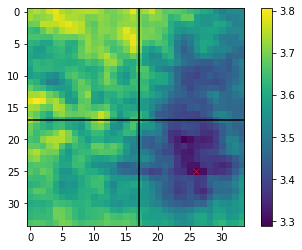

-240 -140 (296): 	( 7,  3)


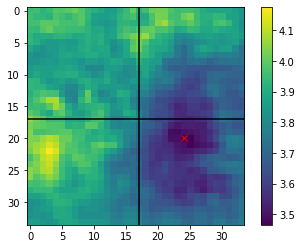

-240 -120 (265): 	( 9,  4)


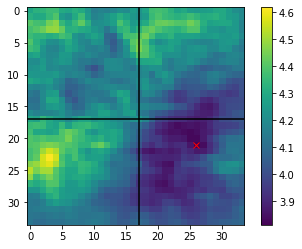

-240 -100 (319): 	( 4,  7)


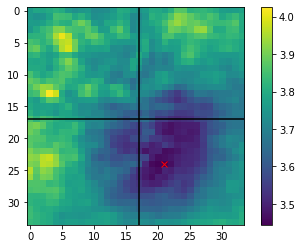

-240 -80 (246): 	( 4,  6)


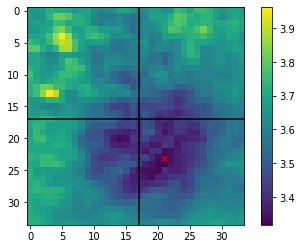

-240 -60 (228): 	( 4,  6)


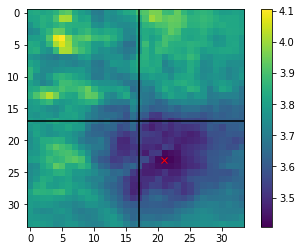

-240 -40 (142): 	(-9, -11)


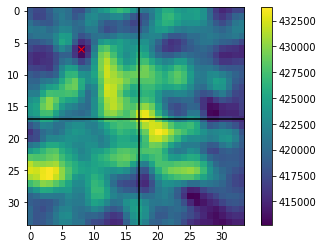

-240 -20 (155): 	( 2, 12)


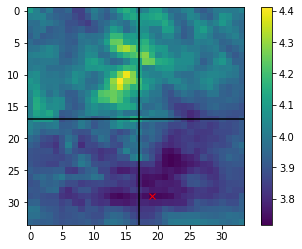

-240   0 (407): 	( 2, 10)


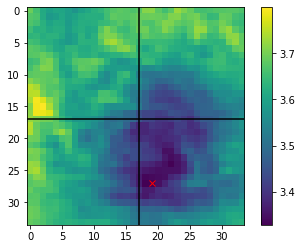

-240  20 (443): 	( 6,  7)


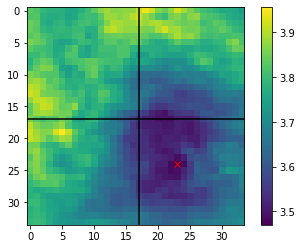

-240  40 (203): 	( 4,  2)


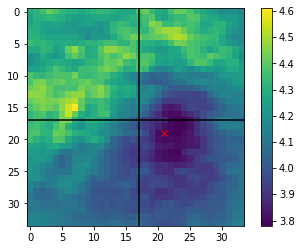

-240  60 (232): 	( 1,  5)


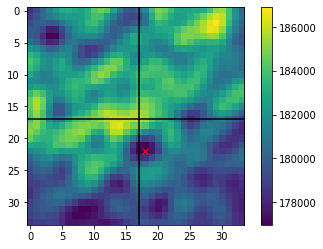

-240  80 (314): 	( 2,  2)


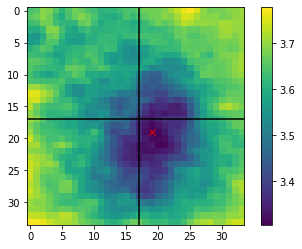

-240 100 (414): 	( 3,  4)


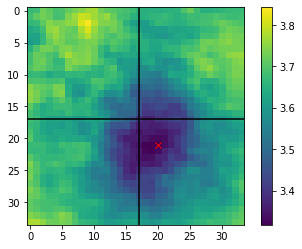

-240 120 (296): 	( 1,  4)


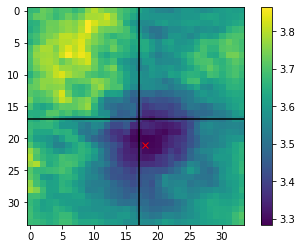

-240 140 (240): 	( 0,  3)


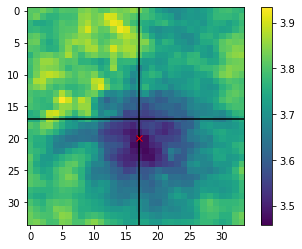

-240 160 (338): 	( 1,  4)


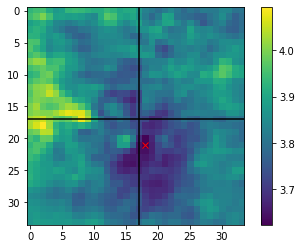

-240 180 (306): 	( 2,  1)


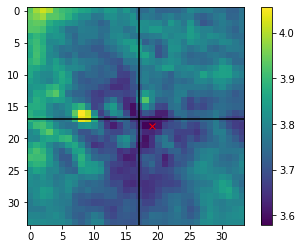

-240 200 (202): 	(-4,  1)


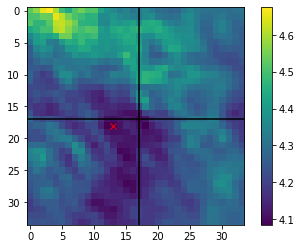

-240 220 (241): 	( 1,  1)


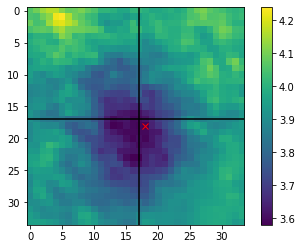

-240 240 (256): 	( 0,  1)


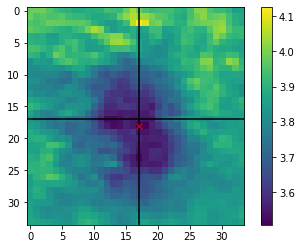

-220 -240 (77): 	(13, 16)


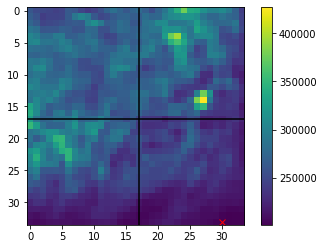

-220 -220 (84): 	(14, 16)


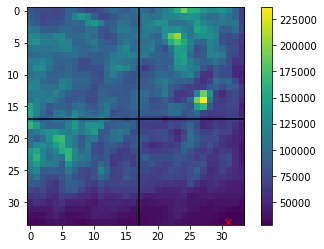

-220 -200 (158): 	(15, 16)


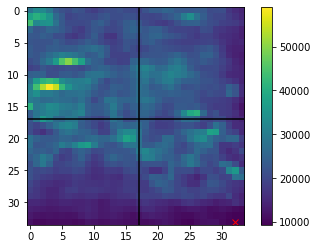

-220 -180 (305): 	( 8,  8)


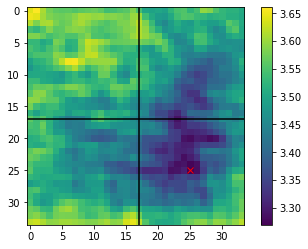

-220 -160 (264): 	( 8,  8)


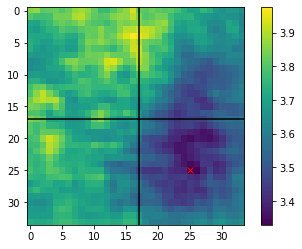

-220 -140 (346): 	( 8,  3)


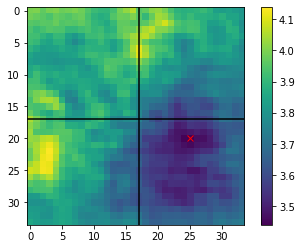

-220 -120 (415): 	( 4,  7)


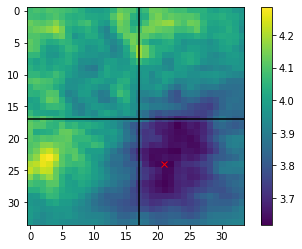

-220 -100 (420): 	( 4,  7)


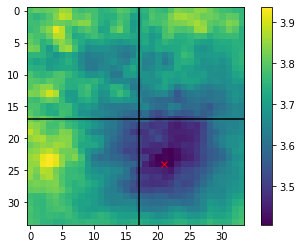

-220 -80 (489): 	( 3,  6)


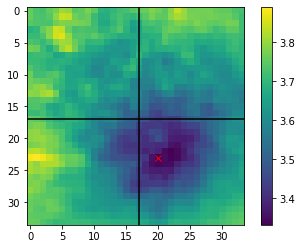

-220 -60 (385): 	( 3,  6)


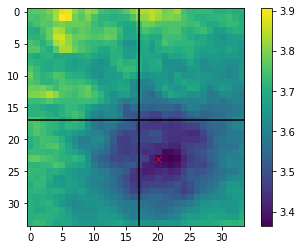

-220 -40 (295): 	( 5,  7)


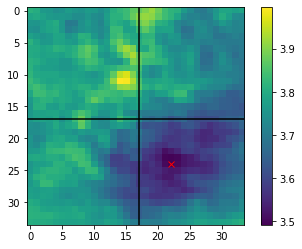

-220 -20 (358): 	( 4,  6)


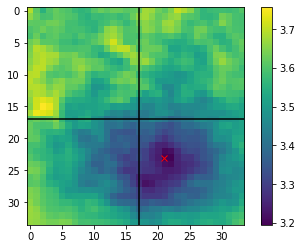

-220   0 (586): 	( 5,  5)


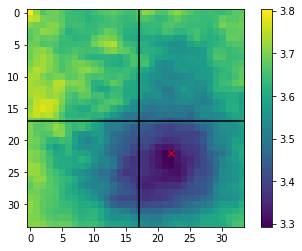

-220  20 (871): 	( 5,  5)


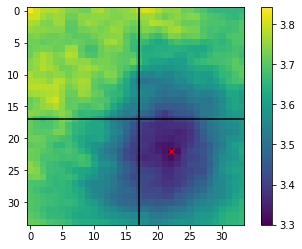

-220  40 (782): 	( 5,  5)


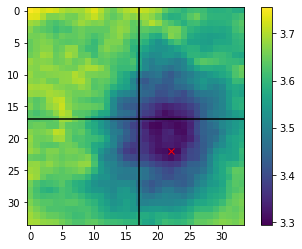

-220  60 (496): 	( 3,  3)


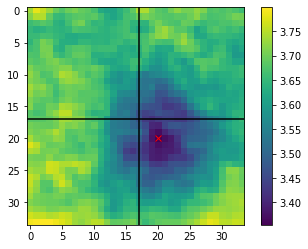

-220  80 (539): 	( 3,  3)


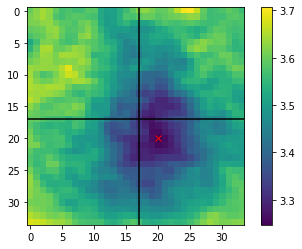

-220 100 (790): 	( 2,  2)


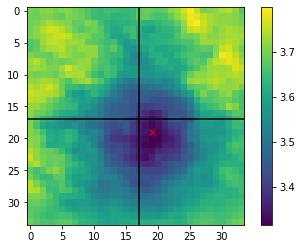

-220 120 (703): 	( 2,  3)


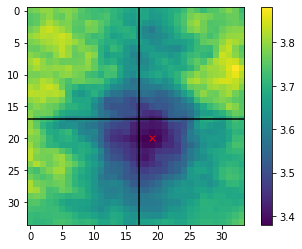

-220 140 (498): 	( 2,  2)


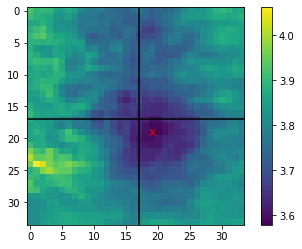

-220 160 (425): 	( 1,  3)


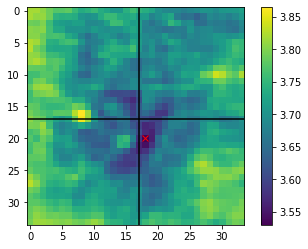

-220 180 (562): 	(-1, -3)


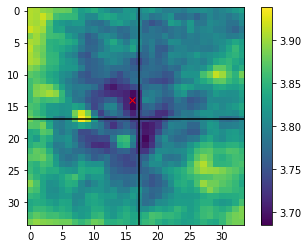

-220 200 (335): 	(16, 16)


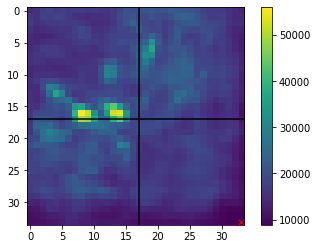

-220 220 (187): 	(-4,  1)


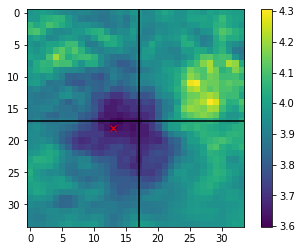

-220 240 (304): 	(-4,  1)


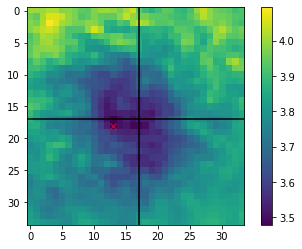

-200 -240 (165): 	(-6,  2)


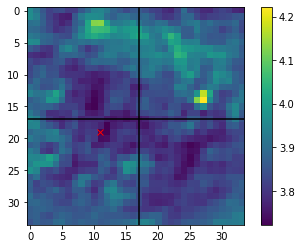

-200 -220 (216): 	(10,  4)


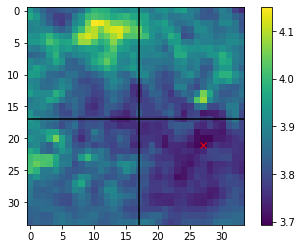

-200 -200 (202): 	(16, 16)


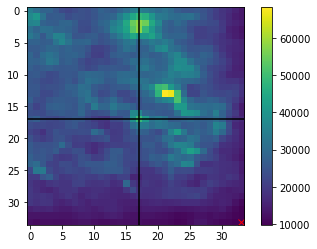

-200 -180 (369): 	( 7,  6)


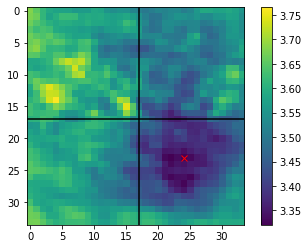

-200 -160 (496): 	( 8,  3)


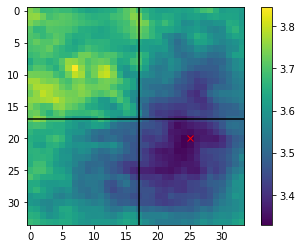

-200 -140 (632): 	( 3,  5)


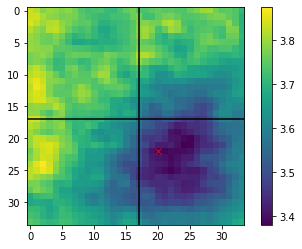

-200 -120 (559): 	( 5,  5)


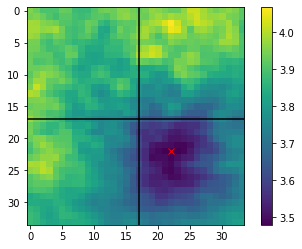

-200 -100 (444): 	( 2,  6)


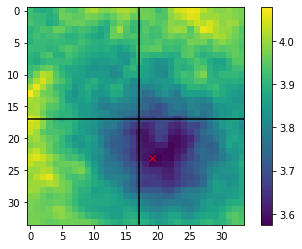

-200 -80 (611): 	( 3,  6)


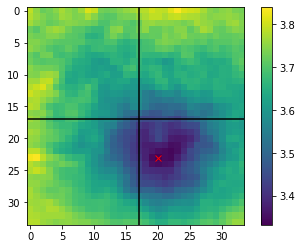

-200 -60 (646): 	( 5,  6)


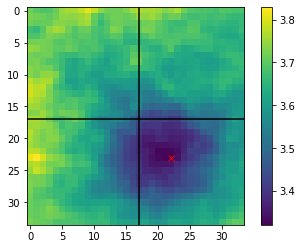

-200 -40 (475): 	( 3,  4)


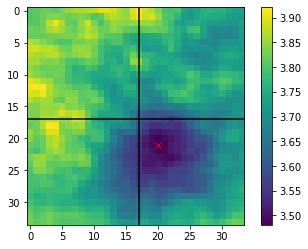

-200 -20 (455): 	( 4,  5)


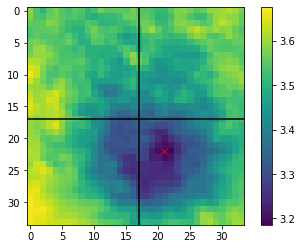

-200   0 (738): 	( 4,  5)


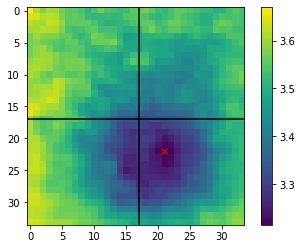

-200  20 (1068): 	( 5,  5)


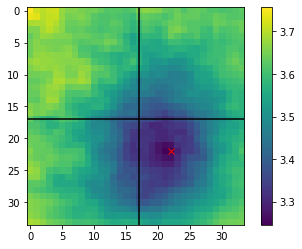

-200  40 (1440): 	( 3,  4)


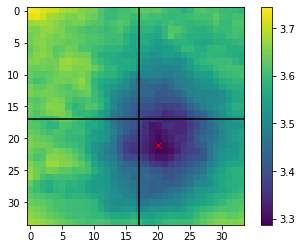

-200  60 (1004): 	( 3,  4)


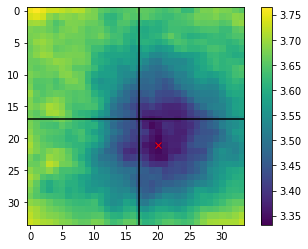

-200  80 (730): 	( 3,  3)


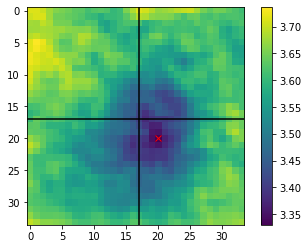

-200 100 (873): 	( 2,  3)


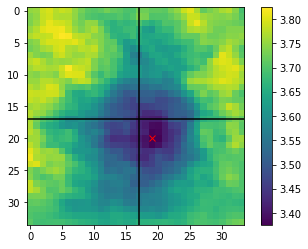

-200 120 (985): 	( 2,  2)


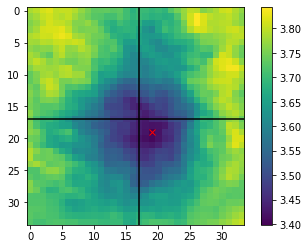

-200 140 (599): 	( 2,  2)


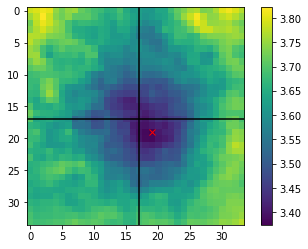

-200 160 (687): 	(-1, -2)


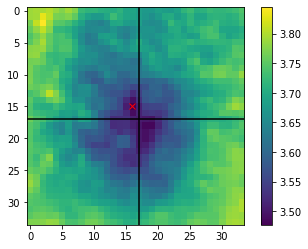

-200 180 (787): 	( 0,  1)


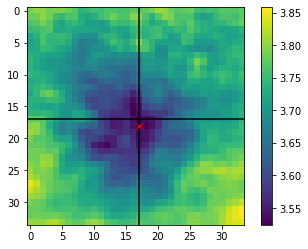

-200 200 (605): 	( 0,  0)


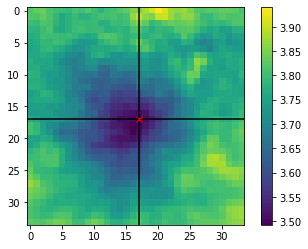

-200 220 (338): 	( 1, -1)


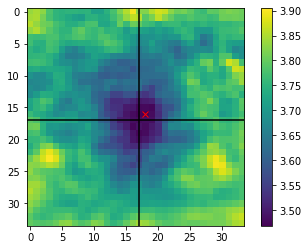

-200 240 (327): 	( 1,  1)


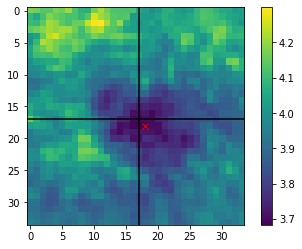

-180 -240 (370): 	( 8,  6)


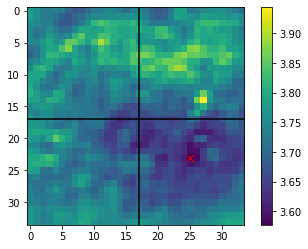

-180 -220 (337): 	(10,  1)


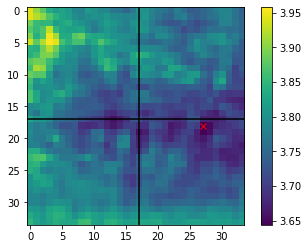

-180 -200 (488): 	( 6,  6)


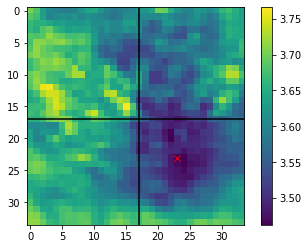

-180 -180 (586): 	( 5,  6)


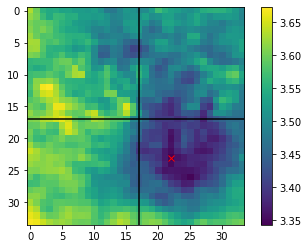

-180 -160 (611): 	( 5,  6)


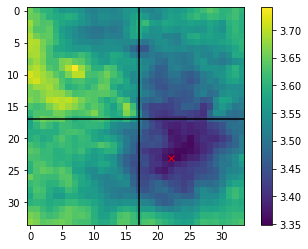

-180 -140 (577): 	( 5,  6)


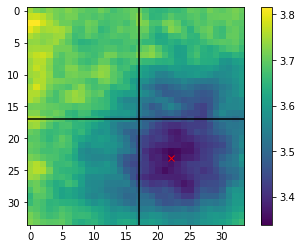

-180 -120 (680): 	( 5,  5)


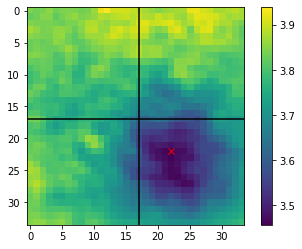

-180 -100 (590): 	( 5,  5)


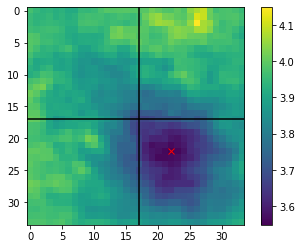

-180 -80 (773): 	( 4,  5)


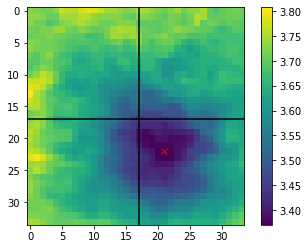

-180 -60 (1038): 	( 2,  3)


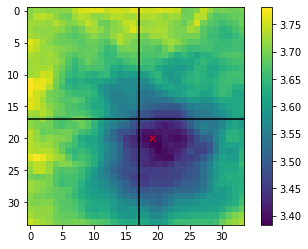

-180 -40 (982): 	( 3,  2)


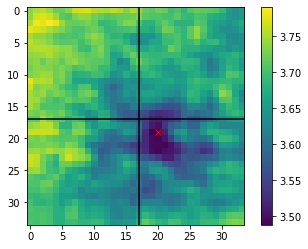

-180 -20 (1261): 	(16,  5)


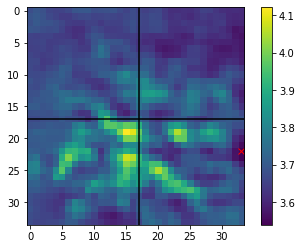

-180   0 (1242): 	( 3, -11)


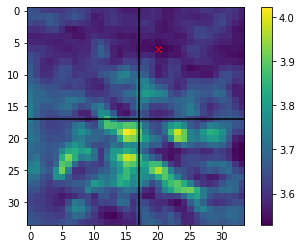

-180  20 (1476): 	( 3,  5)


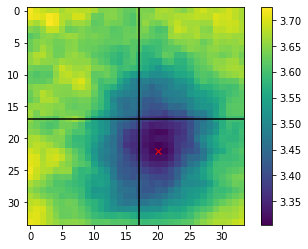

-180  40 (1563): 	( 3,  4)


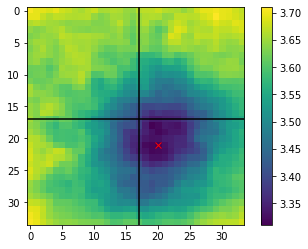

-180  60 (1500): 	( 3,  3)


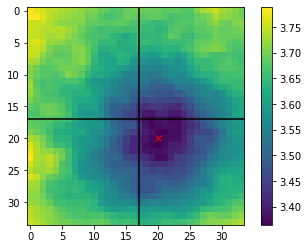

-180  80 (1042): 	( 3,  3)


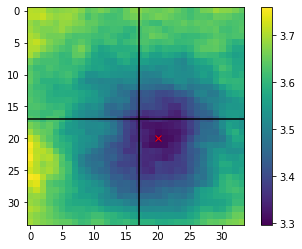

-180 100 (1204): 	( 1,  1)


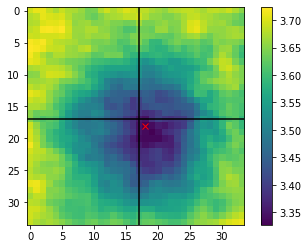

-180 120 (1298): 	( 2,  2)


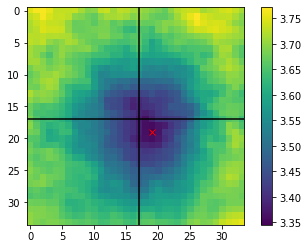

-180 140 (1023): 	( 1,  0)


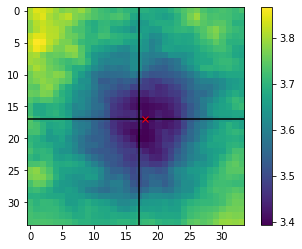

-180 160 (927): 	( 1,  1)


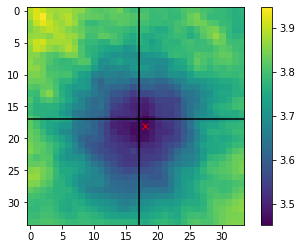

-180 180 (626): 	( 0,  1)


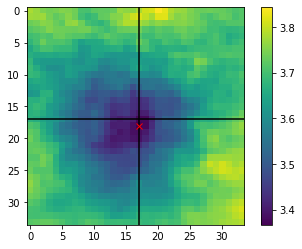

-180 200 (385): 	(-1,  1)


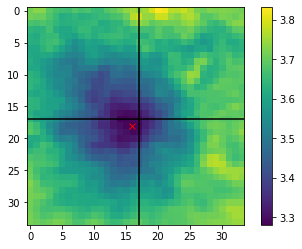

-180 220 (458): 	(-2,  1)


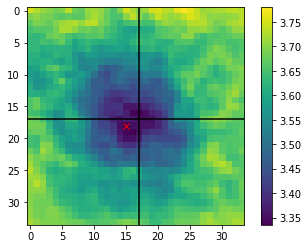

-180 240 (544): 	(-1, -1)


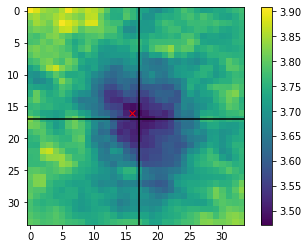

-160 -240 (561): 	( 8,  4)


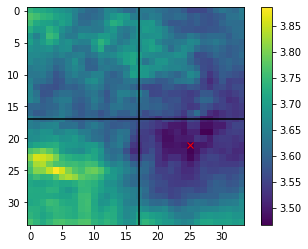

-160 -220 (604): 	( 9,  3)


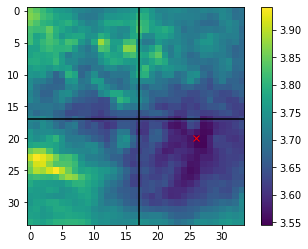

-160 -200 (726): 	(10,  7)


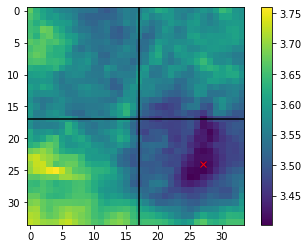

-160 -180 (765): 	(11,  2)


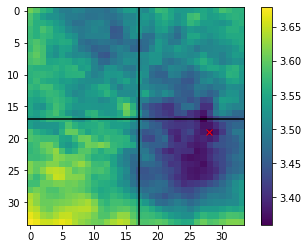

-160 -160 (805): 	( 5,  3)


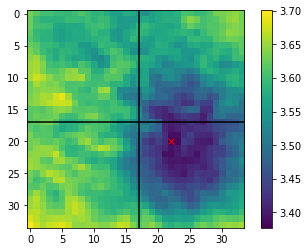

-160 -140 (709): 	( 6,  8)


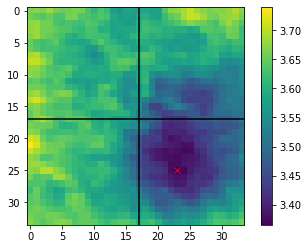

-160 -120 (882): 	( 4,  5)


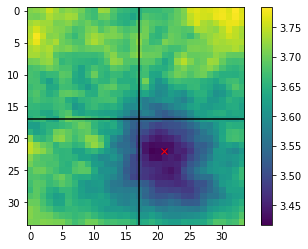

-160 -100 (896): 	( 3,  5)


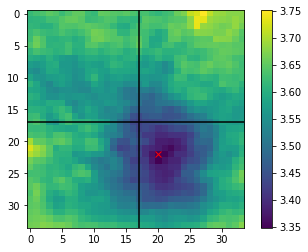

-160 -80 (1186): 	( 3,  3)


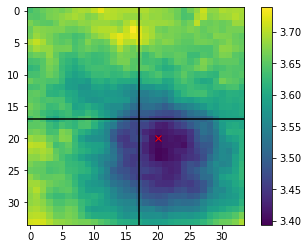

-160 -60 (1651): 	( 3,  3)


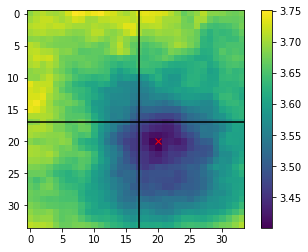

-160 -40 (2203): 	( 4, -1)


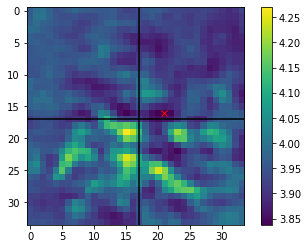

-160 -20 (2401): 	(-2, -1)


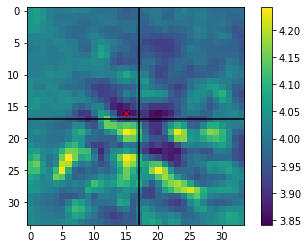

-160   0 (2525): 	(-2, -1)


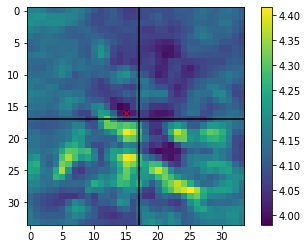

-160  20 (3010): 	( 3,  4)


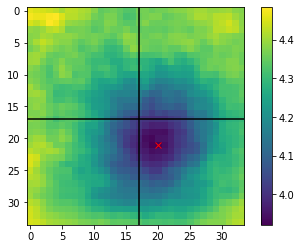

-160  40 (3282): 	( 3,  4)


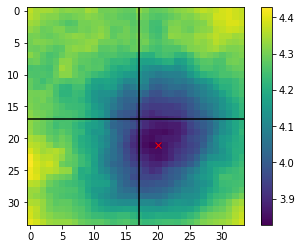

-160  60 (2937): 	( 2,  0)


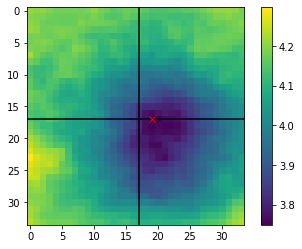

-160  80 (2062): 	( 2,  1)


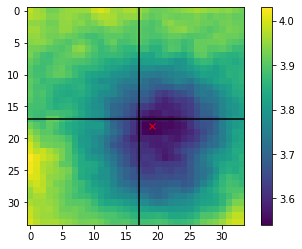

-160 100 (1548): 	( 1,  1)


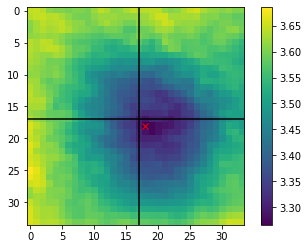

-160 120 (1693): 	( 2,  2)


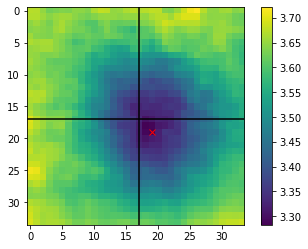

-160 140 (1318): 	( 1,  0)


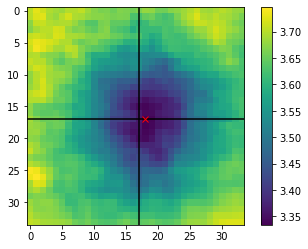

-160 160 (1199): 	( 1,  2)


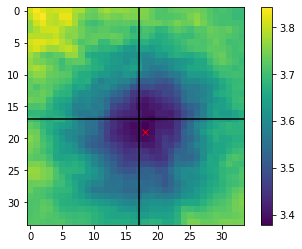

-160 180 (1031): 	( 0,  1)


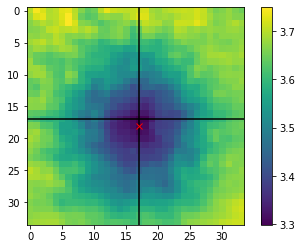

-160 200 (807): 	( 1, -1)


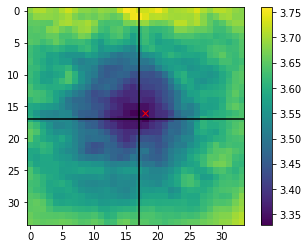

-160 220 (575): 	(-1, -1)


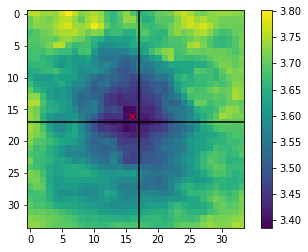

-160 240 (818): 	(-1, -1)


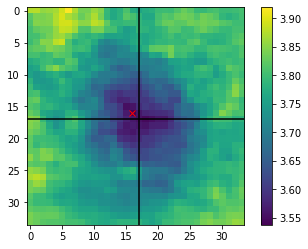

-140 -240 (642): 	(11,  2)


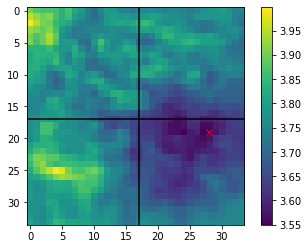

-140 -220 (754): 	(10,  4)


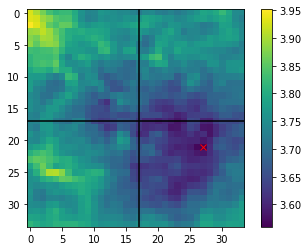

-140 -200 (902): 	( 9,  5)


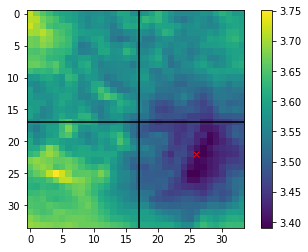

-140 -180 (1016): 	(11,  2)


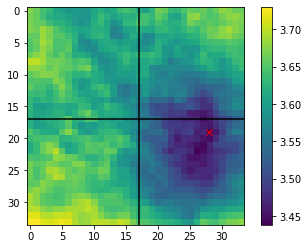

-140 -160 (814): 	( 6,  3)


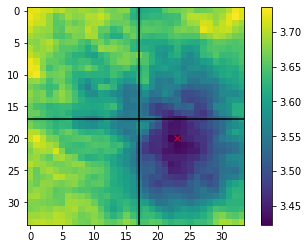

-140 -140 (940): 	( 5,  3)


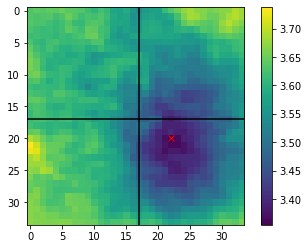

-140 -120 (882): 	( 4,  5)


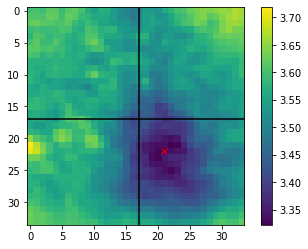

-140 -100 (1169): 	( 4,  5)


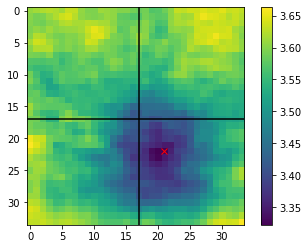

-140 -80 (1515): 	( 3,  2)


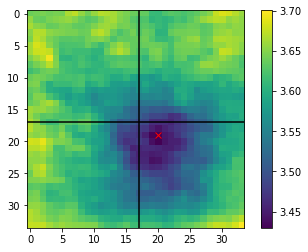

-140 -60 (1902): 	( 2,  3)


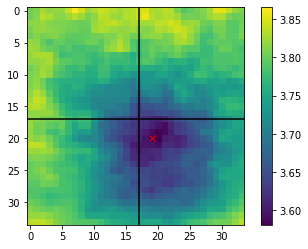

-140 -40 (2634): 	( 2,  3)


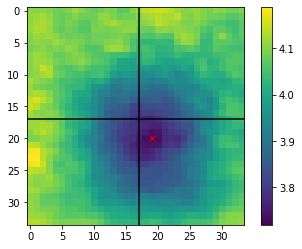

-140 -20 (3164): 	(-2, -1)


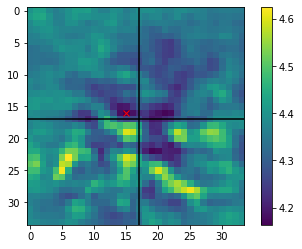

-140   0 (3722): 	( 3,  4)


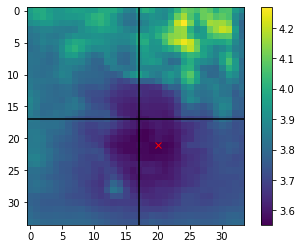

-140  20 (3784): 	( 1,  2)


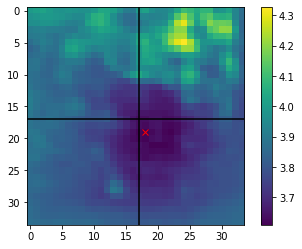

-140  40 (4426): 	( 2,  4)


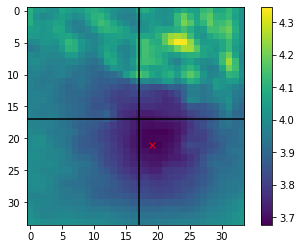

-140  60 (4566): 	( 4,  2)


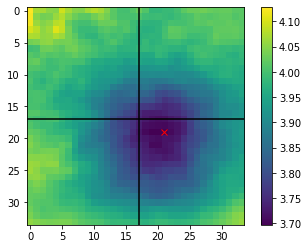

-140  80 (3593): 	( 2,  2)


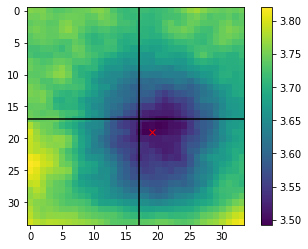

-140 100 (2952): 	( 2,  2)


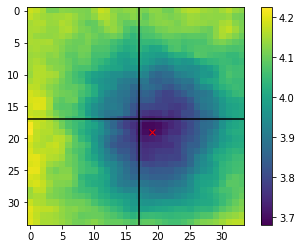

-140 120 (2194): 	( 2,  2)


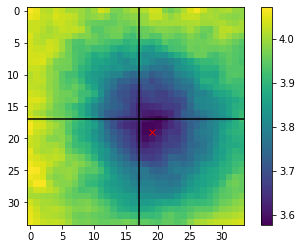

-140 140 (2054): 	( 1,  1)


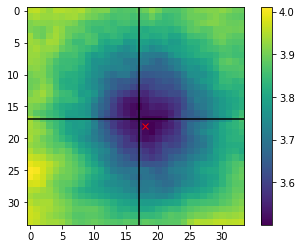

-140 160 (1628): 	( 0,  1)


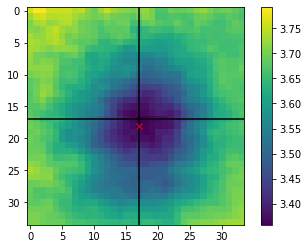

-140 180 (1146): 	(-2, -1)


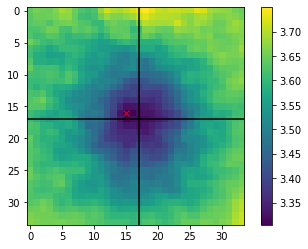

-140 200 (790): 	( 1,  0)


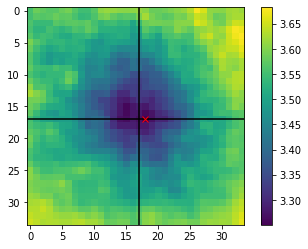

-140 220 (1040): 	(-2, -2)


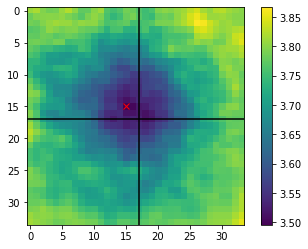

-140 240 (1042): 	(-1, -2)


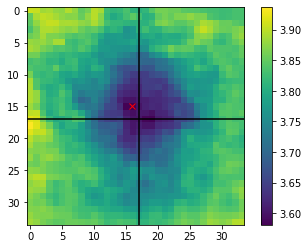

-120 -240 (664): 	( 7,  0)


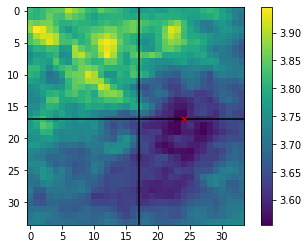

-120 -220 (775): 	(10,  5)


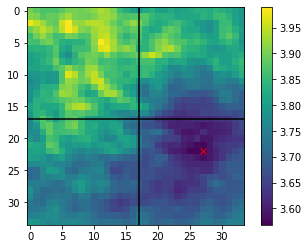

-120 -200 (987): 	(10,  4)


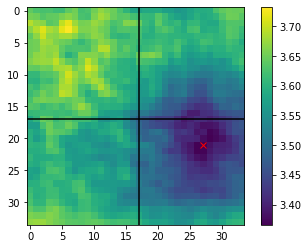

-120 -180 (1030): 	(11,  3)


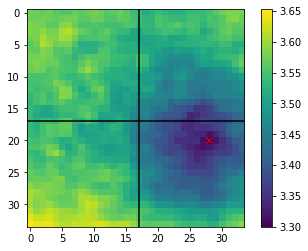

-120 -160 (1020): 	( 6,  3)


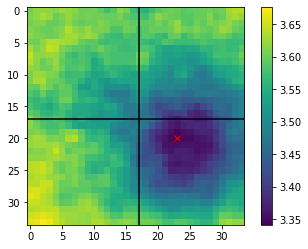

-120 -140 (924): 	( 5,  7)


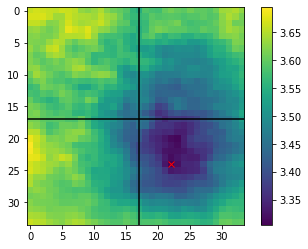

-120 -120 (1291): 	( 4,  5)


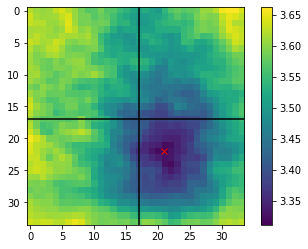

-120 -100 (1530): 	( 4,  7)


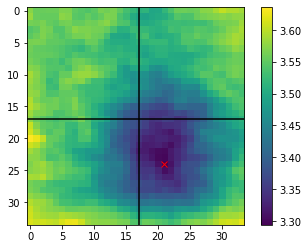

-120 -80 (1969): 	( 1,  3)


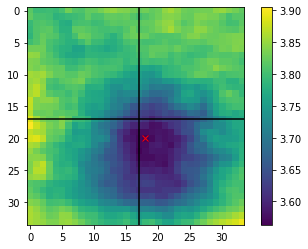

-120 -60 (2369): 	( 2,  2)


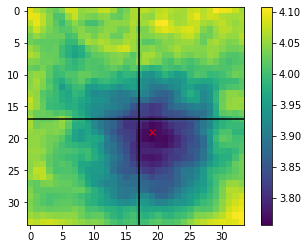

-120 -40 (2642): 	( 2,  3)


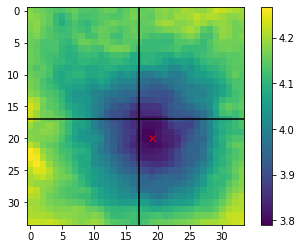

-120 -20 (2761): 	( 1,  3)


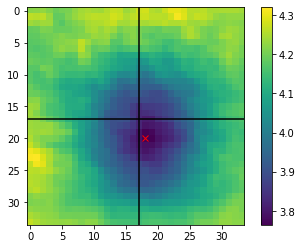

-120   0 (2838): 	( 2,  2)


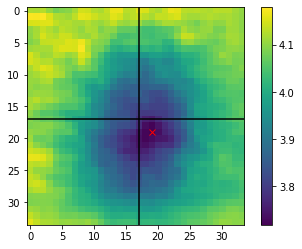

-120  20 (3466): 	( 2,  2)


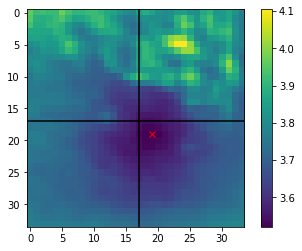

-120  40 (4516): 	( 2,  2)


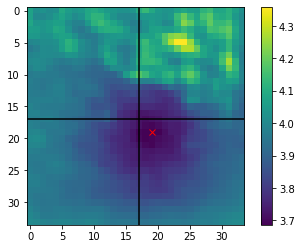

-120  60 (4999): 	( 2,  2)


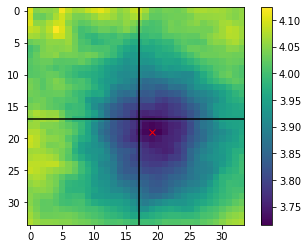

-120  80 (4471): 	( 3,  0)


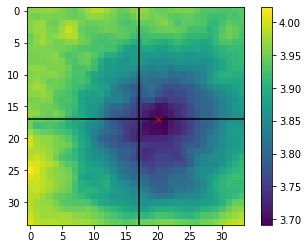

-120 100 (4514): 	( 4,  1)


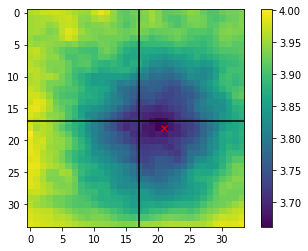

-120 120 (3851): 	( 3,  0)


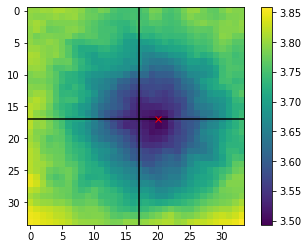

-120 140 (2183): 	( 3,  0)


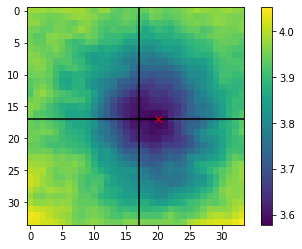

-120 160 (1662): 	( 3,  0)


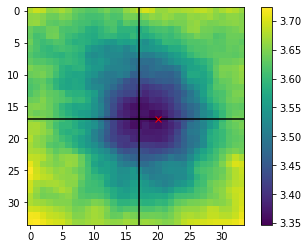

-120 180 (1205): 	( 0, -2)


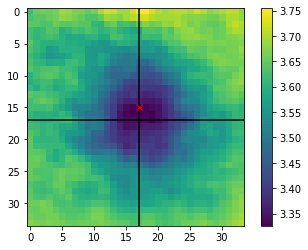

-120 200 (1110): 	(-1, -2)


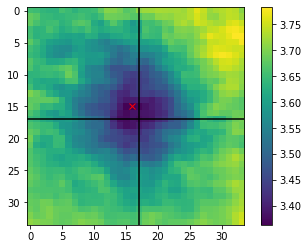

-120 220 (930): 	(-1, -2)


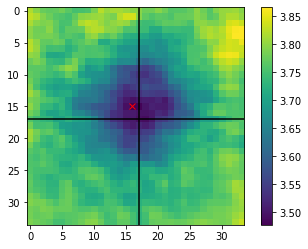

-120 240 (1175): 	(-1, -2)


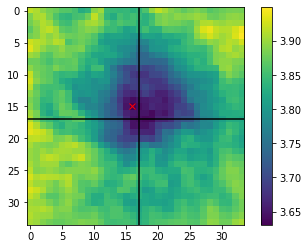

-100 -240 (768): 	( 9,  1)


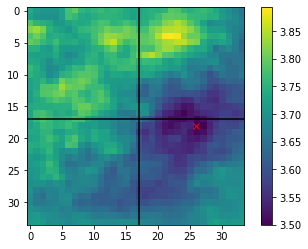

-100 -220 (853): 	( 9,  3)


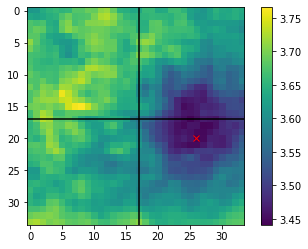

-100 -200 (1056): 	( 9,  2)


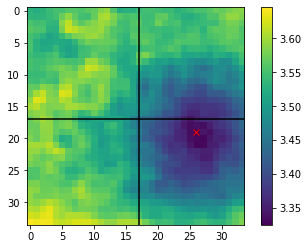

-100 -180 (1431): 	( 8,  2)


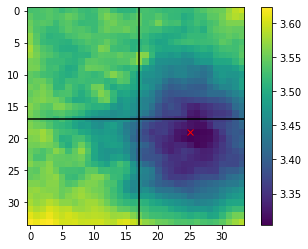

-100 -160 (1402): 	( 6,  3)


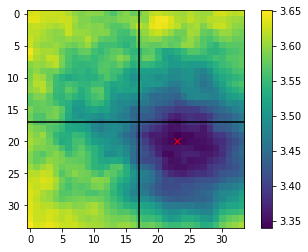

-100 -140 (1781): 	( 6,  2)


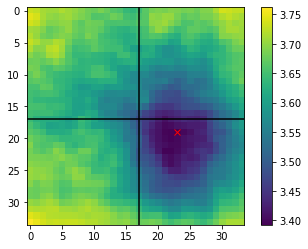

-100 -120 (1926): 	( 5,  3)


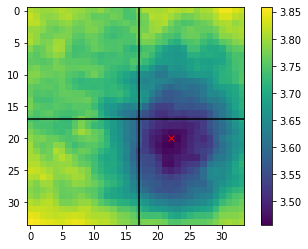

-100 -100 (1914): 	( 4,  7)


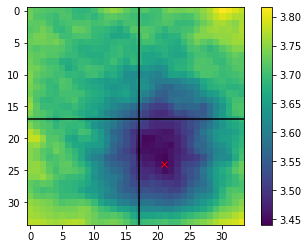

-100 -80 (2279): 	( 1,  3)


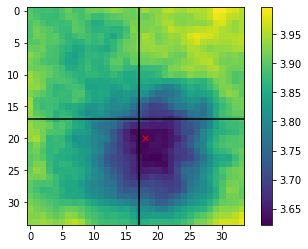

-100 -60 (2633): 	( 1,  2)


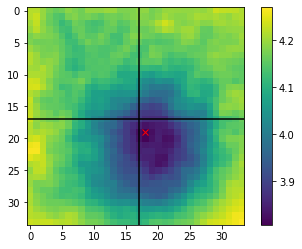

-100 -40 (2663): 	( 1,  2)


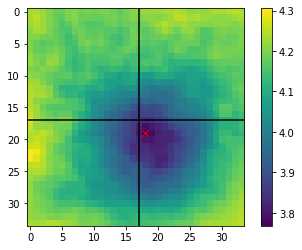

-100 -20 (2305): 	( 1,  2)


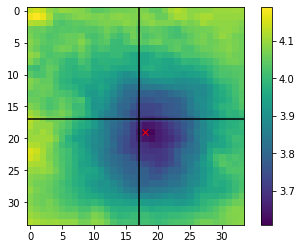

-100   0 (2319): 	( 2,  2)


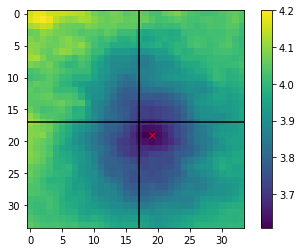

-100  20 (3171): 	( 2,  2)


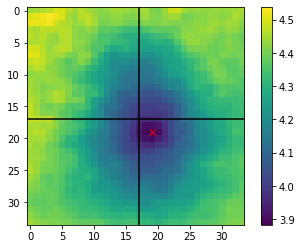

-100  40 (3876): 	( 2,  2)


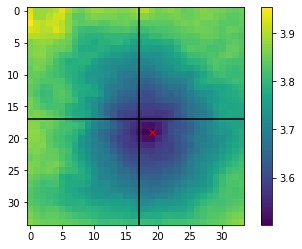

-100  60 (4028): 	( 2,  2)


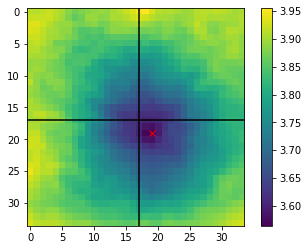

-100  80 (4899): 	( 2,  2)


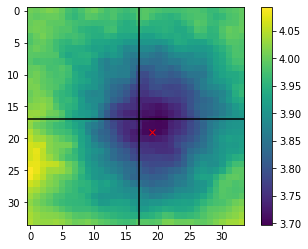

-100 100 (4829): 	( 3,  0)


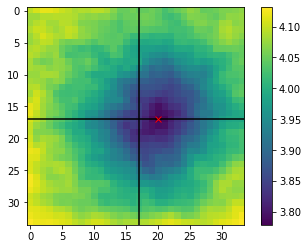

-100 120 (4421): 	( 3, -1)


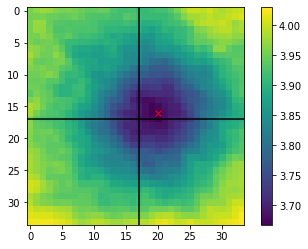

-100 140 (2881): 	( 2, -2)


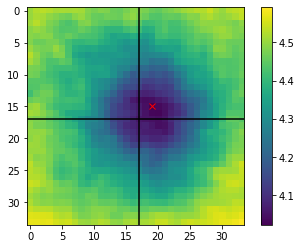

-100 160 (2297): 	( 2, -1)


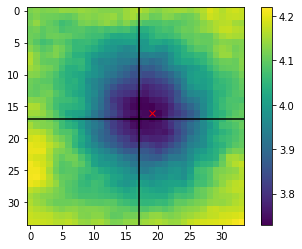

-100 180 (1423): 	( 0, -2)


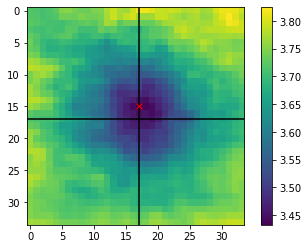

-100 200 (778): 	(-1, -2)


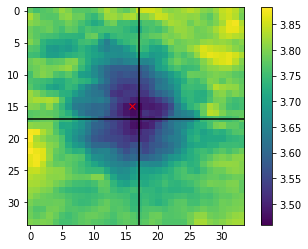

-100 220 (716): 	( 0,  0)


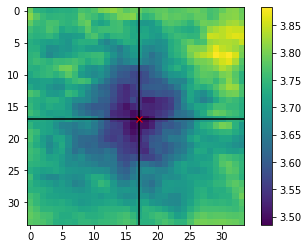

-100 240 (1017): 	( 1,  0)


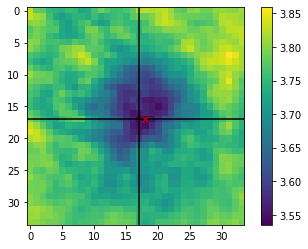

-80 -240 (755): 	( 7, -1)


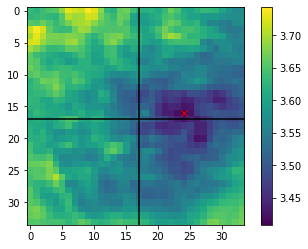

-80 -220 (679): 	( 9,  3)


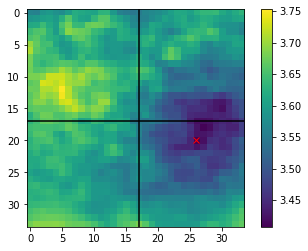

-80 -200 (892): 	( 9,  3)


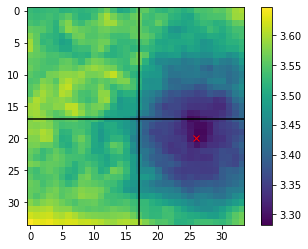

-80 -180 (1355): 	( 9,  2)


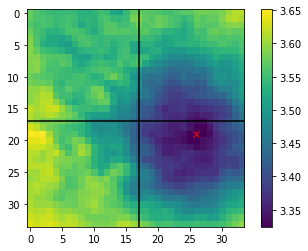

-80 -160 (1801): 	( 6,  2)


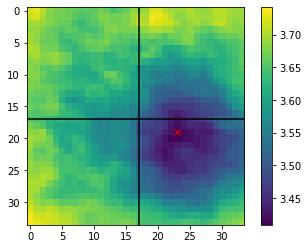

-80 -140 (2105): 	( 6,  2)


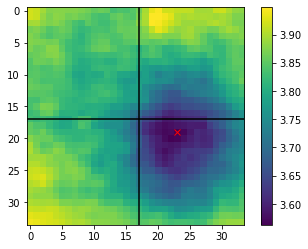

-80 -120 (2237): 	( 4,  2)


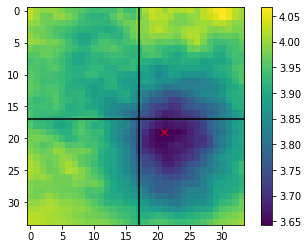

-80 -100 (2220): 	( 3,  2)


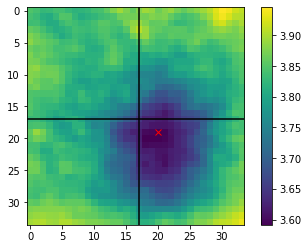

-80 -80 (2533): 	( 1,  2)


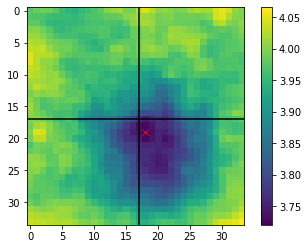

-80 -60 (2762): 	( 1,  1)


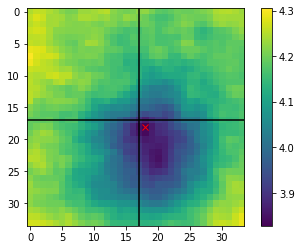

-80 -40 (2464): 	( 1,  2)


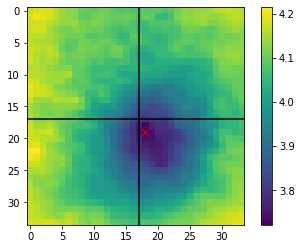

-80 -20 (2288): 	( 1,  2)


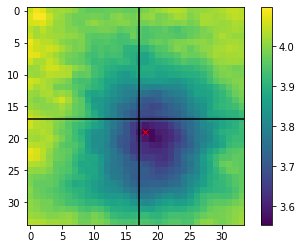

-80   0 (2955): 	( 1,  2)


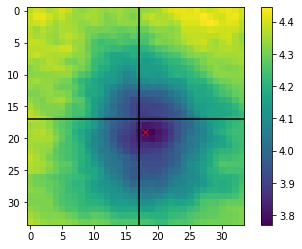

-80  20 (3205): 	( 2,  2)


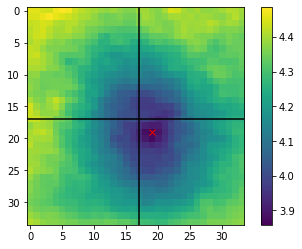

-80  40 (3831): 	( 2,  2)


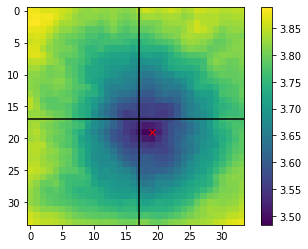

-80  60 (3548): 	( 2,  2)


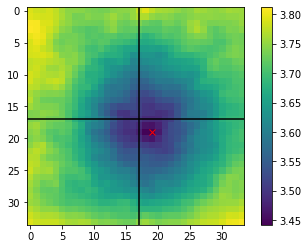

-80  80 (3658): 	( 2,  2)


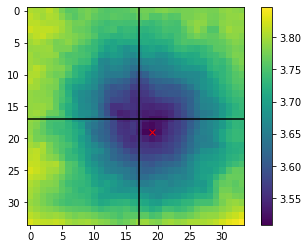

-80 100 (4291): 	( 3,  0)


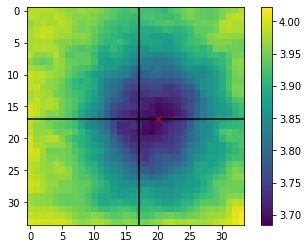

-80 120 (4006): 	( 2, -3)


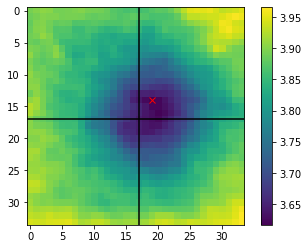

-80 140 (3061): 	( 2, -2)


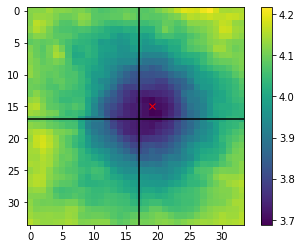

-80 160 (2408): 	( 2, -2)


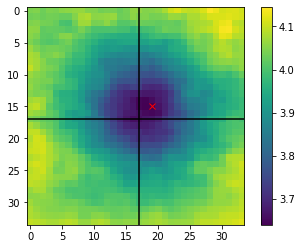

-80 180 (1527): 	( 1, -2)


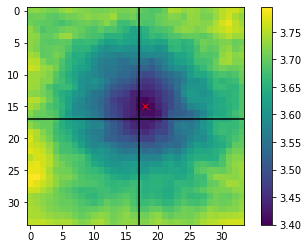

-80 200 (836): 	( 0, -3)


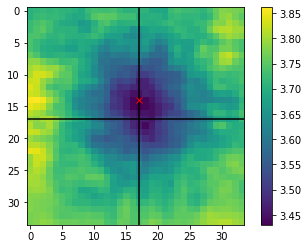

-80 220 (548): 	( 1,  1)


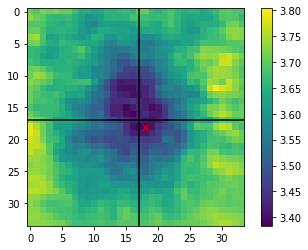

-80 240 (778): 	( 0,  1)


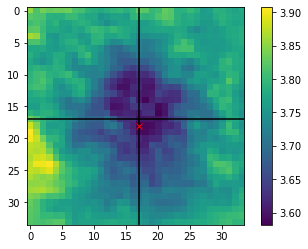

-60 -240 (593): 	(10,  3)


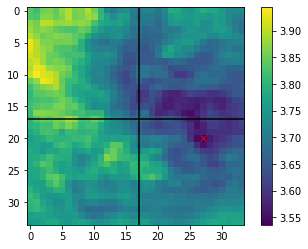

-60 -220 (540): 	(13, -3)


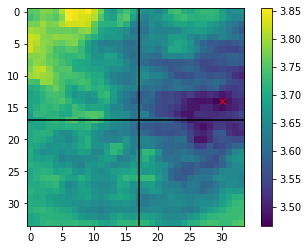

-60 -200 (638): 	( 9,  1)


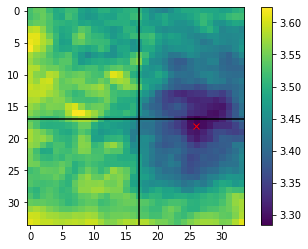

-60 -180 (1017): 	( 7,  0)


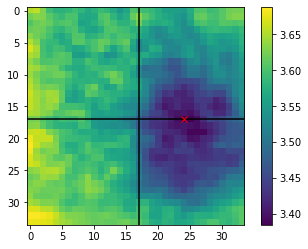

-60 -160 (1568): 	( 8,  0)


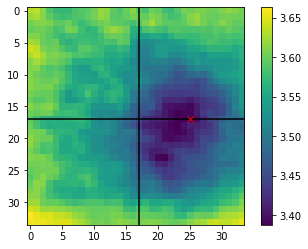

-60 -140 (1998): 	( 5,  3)


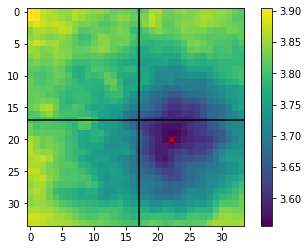

-60 -120 (1943): 	( 3,  2)


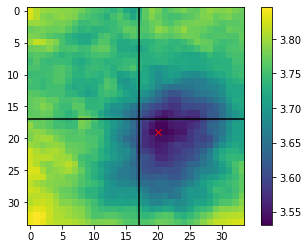

-60 -100 (2053): 	( 2,  2)


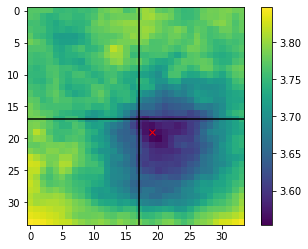

-60 -80 (2579): 	( 1,  1)


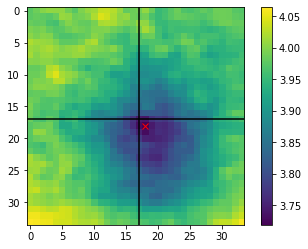

-60 -60 (2858): 	( 1,  1)


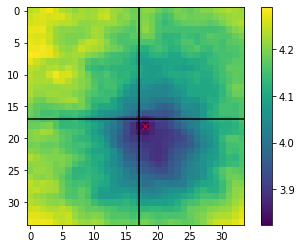

-60 -40 (2437): 	( 1,  1)


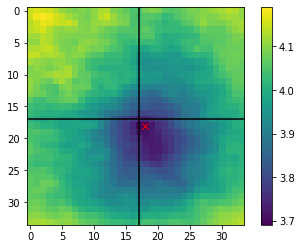

-60 -20 (2593): 	( 1,  2)


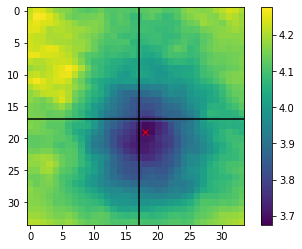

-60   0 (3216): 	( 2,  2)


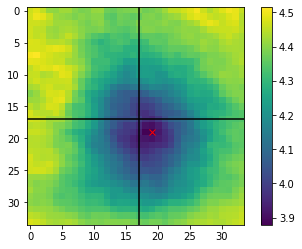

-60  20 (3684): 	( 1,  2)


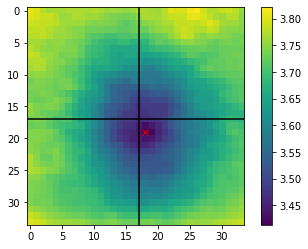

-60  40 (3686): 	( 1,  2)


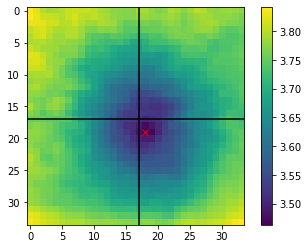

-60  60 (3451): 	( 1,  2)


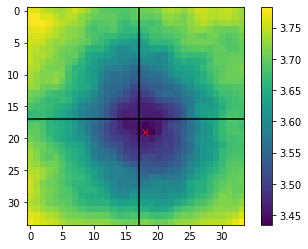

-60  80 (3325): 	( 2,  2)


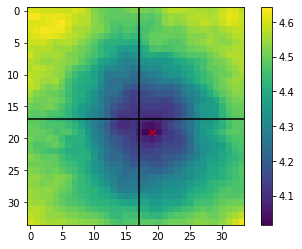

-60 100 (3739): 	( 2,  2)


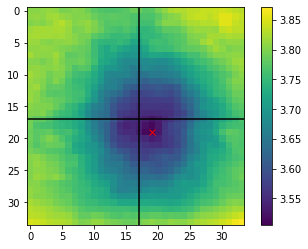

-60 120 (4058): 	( 2,  1)


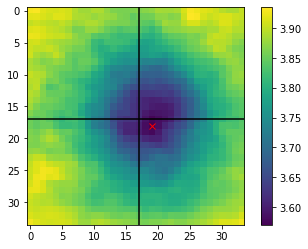

-60 140 (3846): 	( 2, -3)


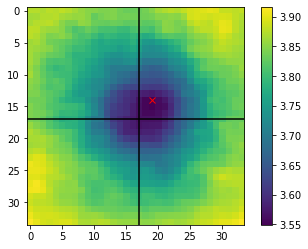

-60 160 (2730): 	( 1, -2)


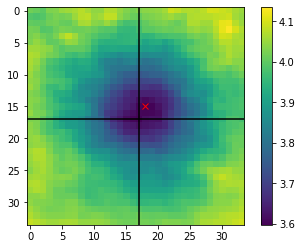

-60 180 (1578): 	( 0, -3)


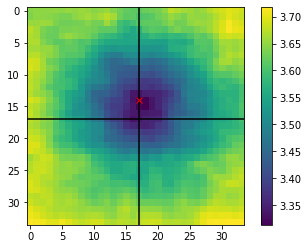

-60 200 (1187): 	( 2,  0)


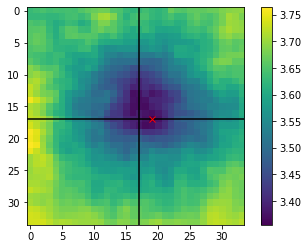

-60 220 (1023): 	( 2, -5)


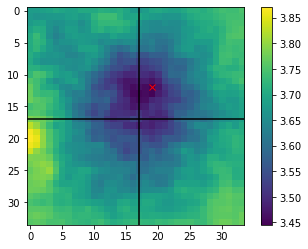

-60 240 (969): 	( 0, -1)


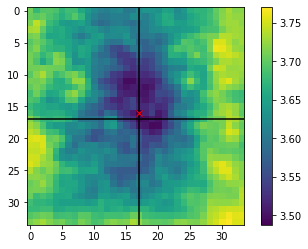

-40 -240 (502): 	(10,  3)


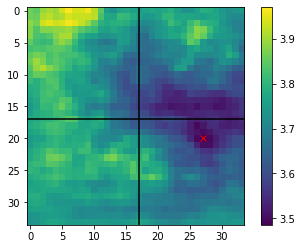

-40 -220 (574): 	( 9,  1)


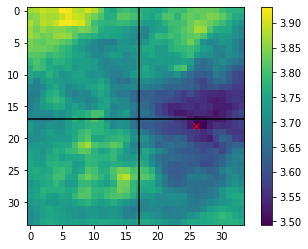

-40 -200 (814): 	( 7, -2)


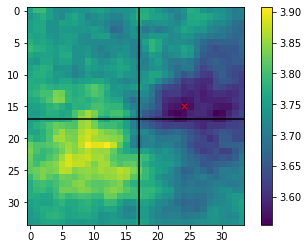

-40 -180 (938): 	( 7, -3)


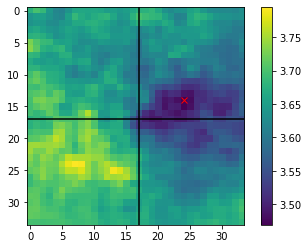

-40 -160 (1582): 	( 7,  0)


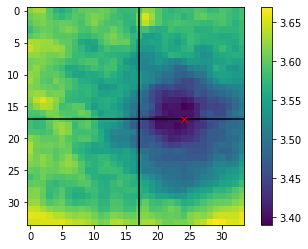

-40 -140 (1777): 	( 6,  2)


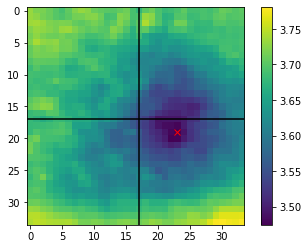

-40 -120 (1716): 	( 3,  0)


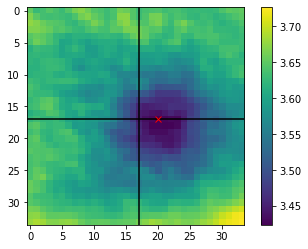

-40 -100 (1889): 	( 1,  0)


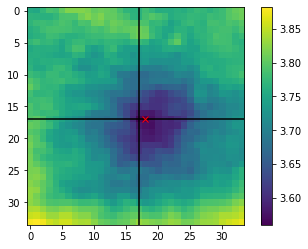

-40 -80 (2550): 	( 1,  1)


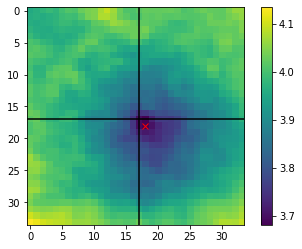

-40 -60 (2353): 	( 1,  1)


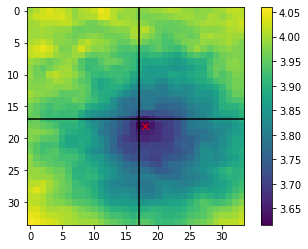

-40 -40 (2321): 	( 1,  1)


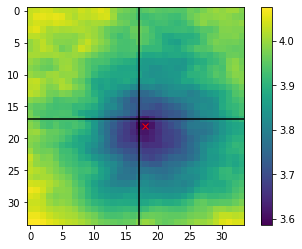

-40 -20 (3166): 	( 1,  1)


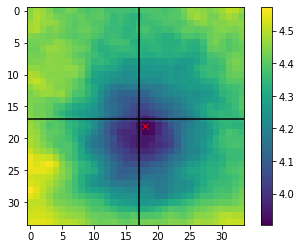

-40   0 (3415): 	( 1,  2)


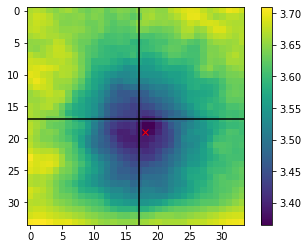

-40  20 (3939): 	( 1,  2)


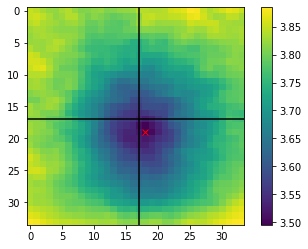

-40  40 (3932): 	( 1,  1)


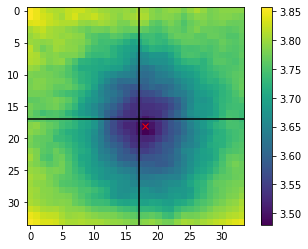

-40  60 (3566): 	( 1,  1)


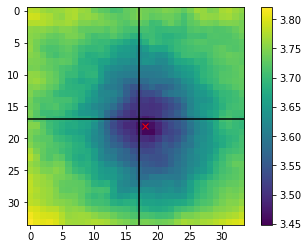

-40  80 (3496): 	( 1,  1)


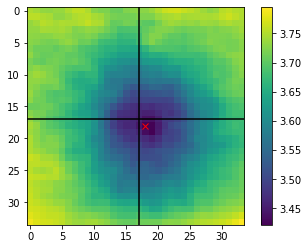

-40 100 (3730): 	( 2,  2)


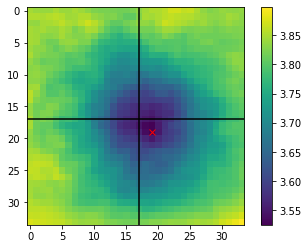

-40 120 (4047): 	( 2,  1)


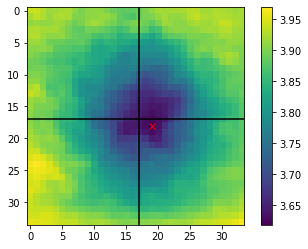

-40 140 (4411): 	( 1, -1)


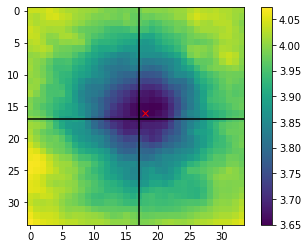

-40 160 (3679): 	( 2, -2)


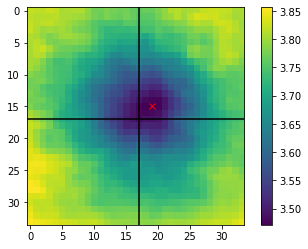

-40 180 (1941): 	( 1, -3)


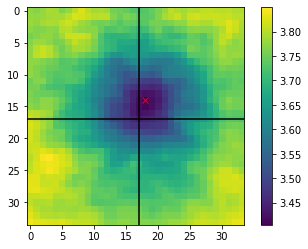

-40 200 (1300): 	( 2, -4)


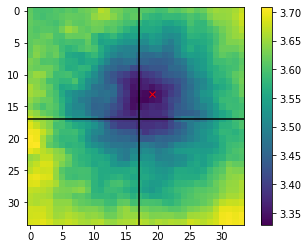

-40 220 (1473): 	( 0, -4)


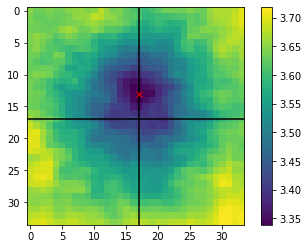

-40 240 (1240): 	( 1, -3)


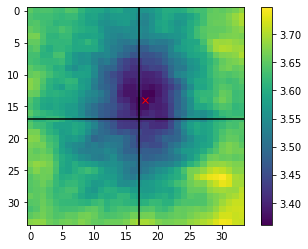

-20 -240 (404): 	( 6, -1)


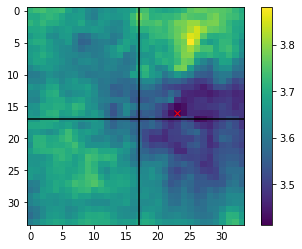

-20 -220 (646): 	( 8, -4)


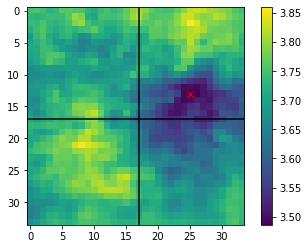

-20 -200 (880): 	( 7, -3)


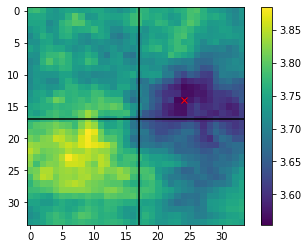

-20 -180 (983): 	( 5, -2)


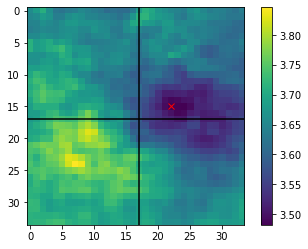

-20 -160 (1478): 	( 4,  0)


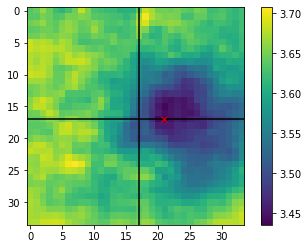

-20 -140 (1493): 	( 4,  0)


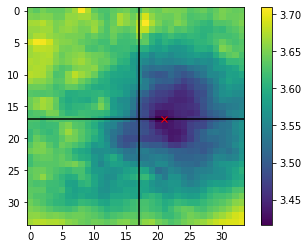

-20 -120 (1770): 	( 2,  0)


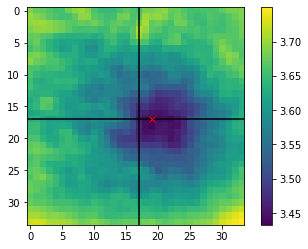

-20 -100 (2063): 	( 1,  0)


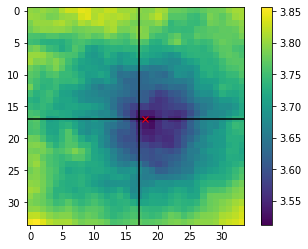

-20 -80 (2436): 	( 1,  0)


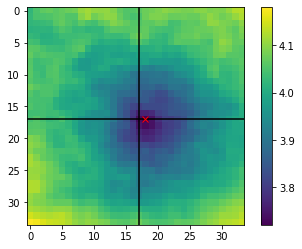

-20 -60 (2208): 	( 1,  0)


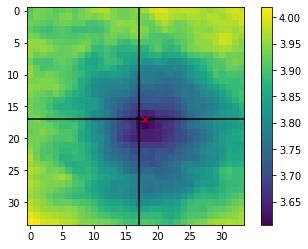

-20 -40 (2457): 	( 1,  1)


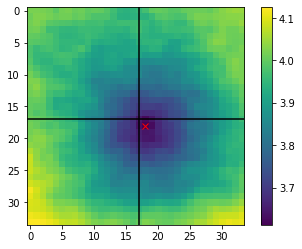

-20 -20 (2961): 	( 1,  1)


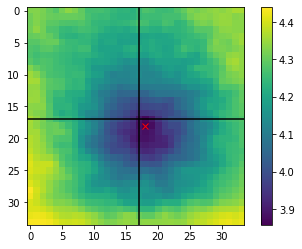

-20   0 (3064): 	( 1,  1)


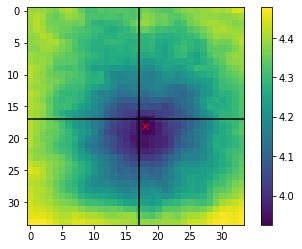

-20  20 (3474): 	( 1,  1)


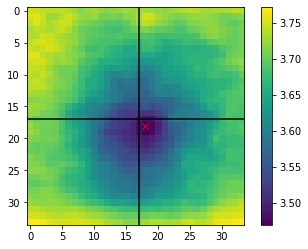

-20  40 (3364): 	( 1,  1)


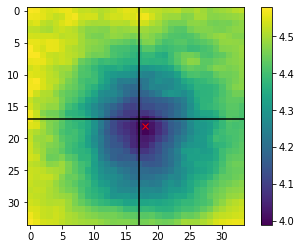

-20  60 (3271): 	( 1,  1)


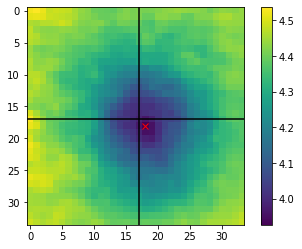

-20  80 (2972): 	( 1,  1)


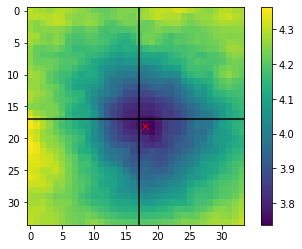

-20 100 (3329): 	( 2,  1)


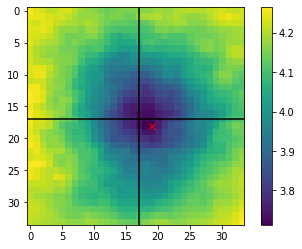

-20 120 (3904): 	( 2,  0)


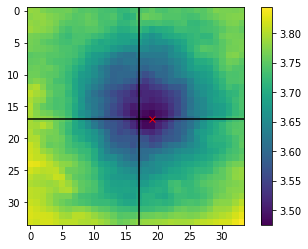

-20 140 (4690): 	( 2, -2)


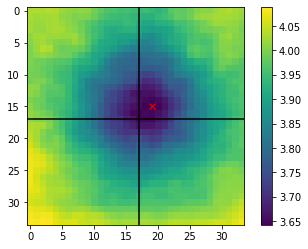

-20 160 (3823): 	( 3, -3)


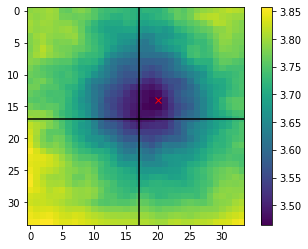

-20 180 (2120): 	( 1, -3)


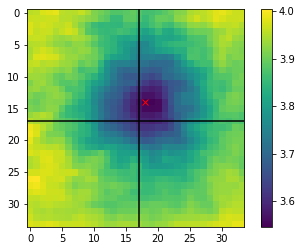

-20 200 (1103): 	( 2, -4)


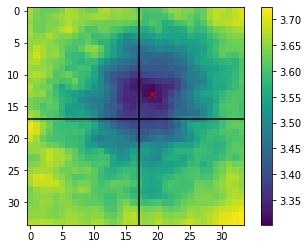

-20 220 (1229): 	( 2, -4)


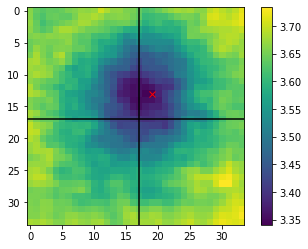

-20 240 (835): 	( 2, -3)


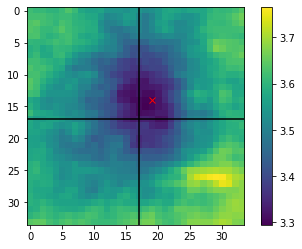

  0 -240 (295): 	(15, -4)


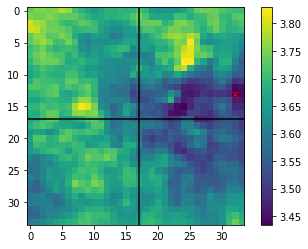

  0 -220 (589): 	( 8, -4)


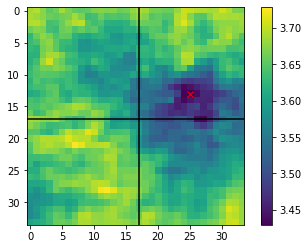

  0 -200 (792): 	( 9, -4)


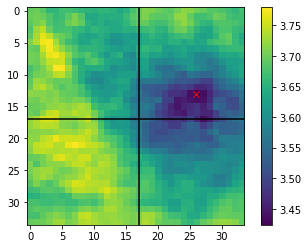

  0 -180 (976): 	( 5, -2)


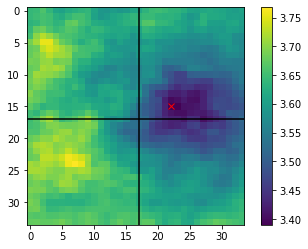

  0 -160 (1348): 	( 8, -3)


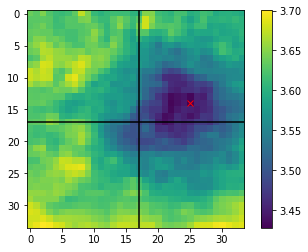

  0 -140 (1811): 	( 5, -3)


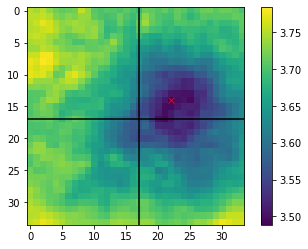

  0 -120 (1624): 	( 5, -1)


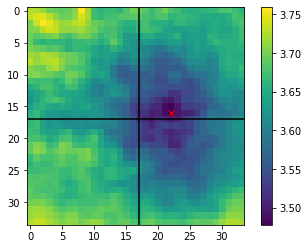

  0 -100 (1800): 	( 2,  1)


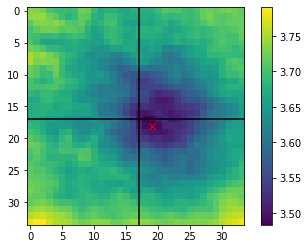

  0 -80 (1886): 	( 0, -1)


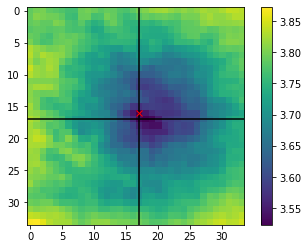

  0 -60 (1676): 	( 1,  0)


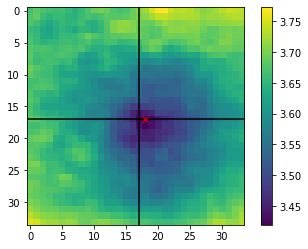

  0 -40 (1991): 	( 1,  0)


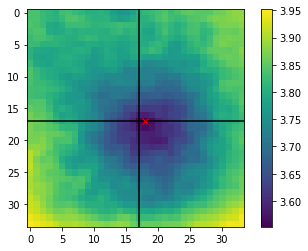

  0 -20 (2529): 	( 1,  0)


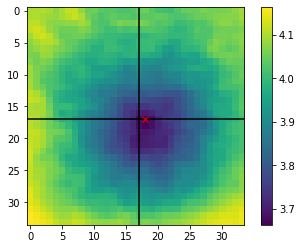

  0   0 (2403): 	( 1,  0)


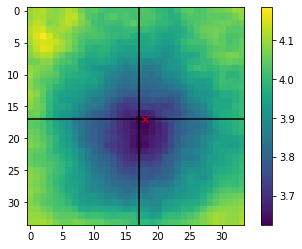

  0  20 (2581): 	( 1,  0)


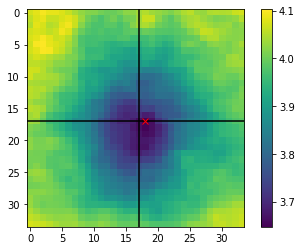

  0  40 (2930): 	(-1,  1)


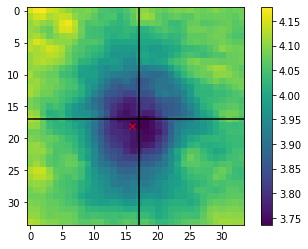

  0  60 (2780): 	( 0,  1)


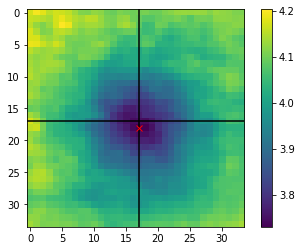

  0  80 (3225): 	( 1,  1)


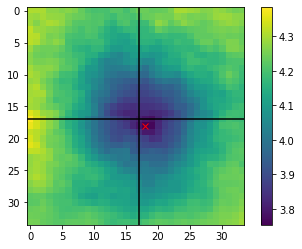

  0 100 (3251): 	( 1,  1)


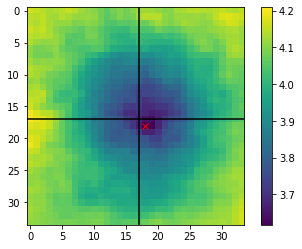

  0 120 (3429): 	( 1,  0)


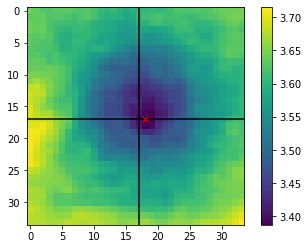

  0 140 (3731): 	( 2, -2)


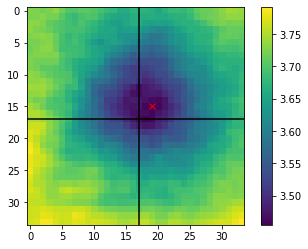

  0 160 (3405): 	( 2, -3)


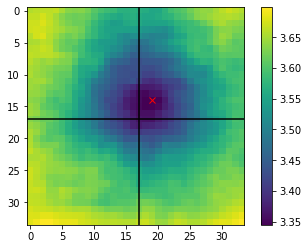

  0 180 (1889): 	( 2, -3)


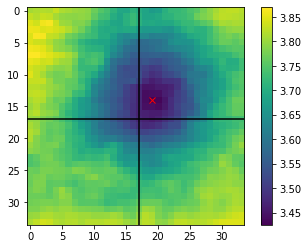

  0 200 (846): 	( 1, -4)


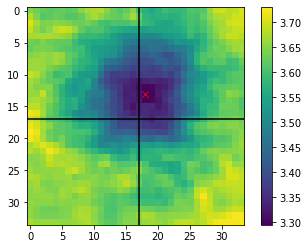

  0 220 (832): 	(-2, -4)


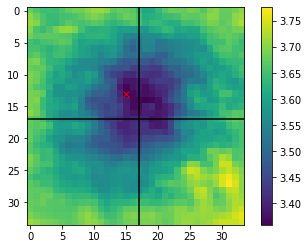

  0 240 (660): 	( 1, -3)


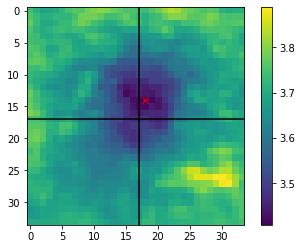

 20 -240 (299): 	( 8, -4)


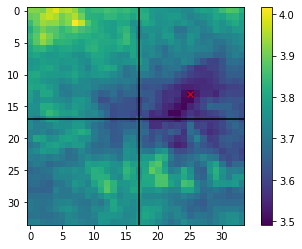

 20 -220 (486): 	( 8, -3)


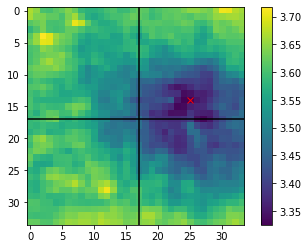

 20 -200 (747): 	( 5, -2)


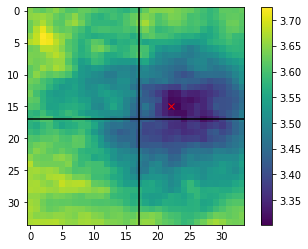

 20 -180 (867): 	( 5, -2)


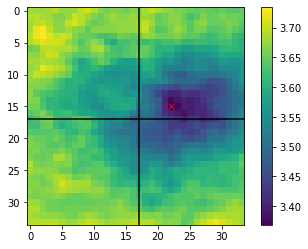

 20 -160 (1389): 	( 5, -3)


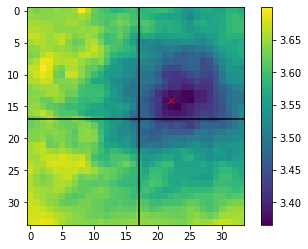

 20 -140 (1490): 	( 5, -3)


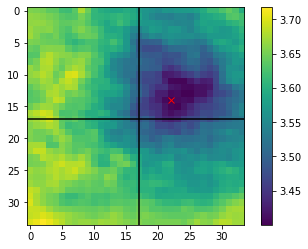

 20 -120 (1701): 	( 4, -3)


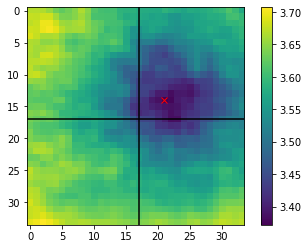

 20 -100 (1602): 	( 4, -3)


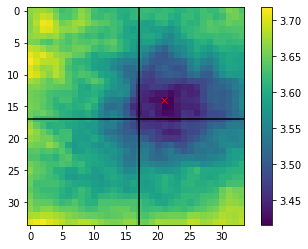

 20 -80 (1430): 	( 4, -1)


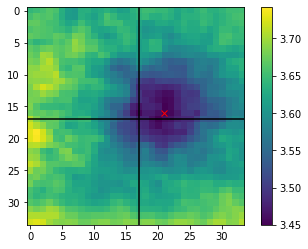

 20 -60 (1463): 	( 0, -1)


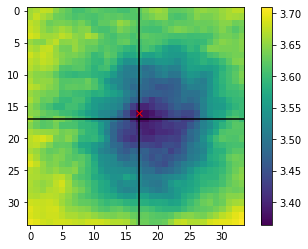

 20 -40 (1571): 	( 0, -1)


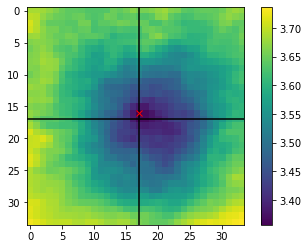

 20 -20 (1522): 	( 1,  0)


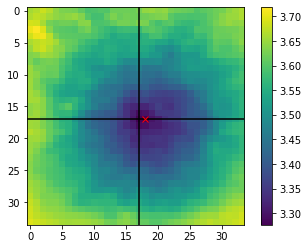

 20   0 (1793): 	( 0,  0)


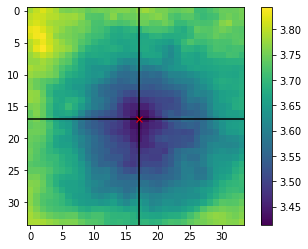

 20  20 (1832): 	( 1,  0)


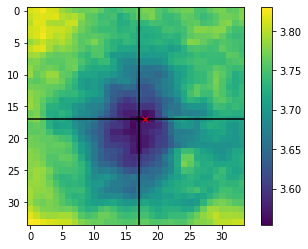

 20  40 (2248): 	( 1,  0)


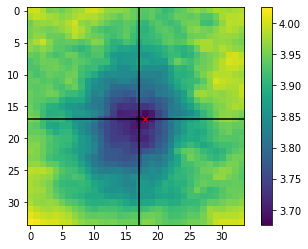

 20  60 (2466): 	( 0,  0)


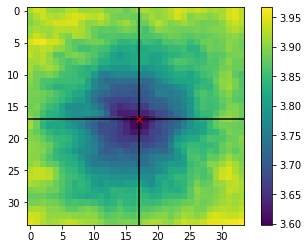

 20  80 (2526): 	( 0,  1)


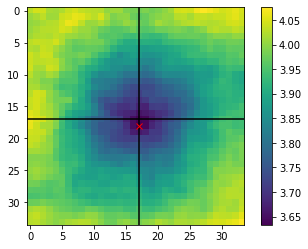

 20 100 (2520): 	( 1,  1)


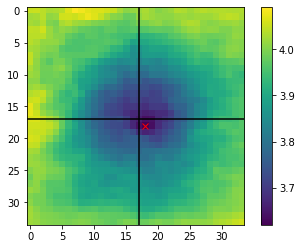

 20 120 (2973): 	( 1,  1)


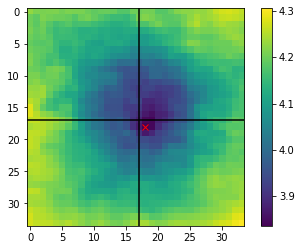

 20 140 (3382): 	( 2,  0)


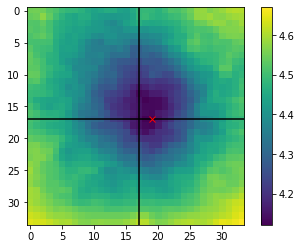

 20 160 (2666): 	( 1, -2)


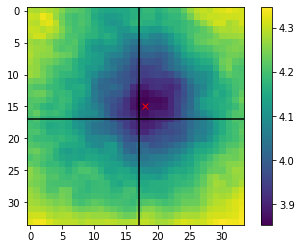

 20 180 (1359): 	( 3, -3)


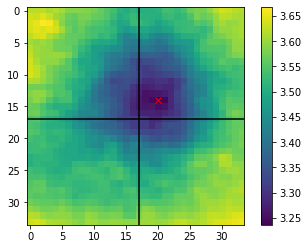

 20 200 (721): 	( 3, -1)


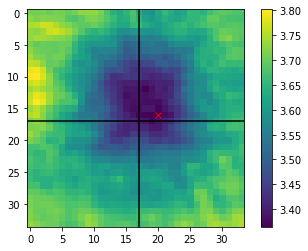

 20 220 (845): 	( 1, -5)


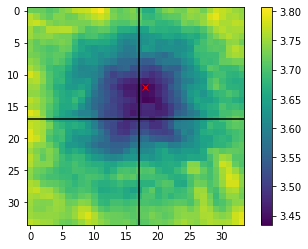

 20 240 (615): 	( 1, -3)


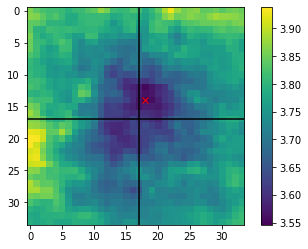

 40 -240 (234): 	( 7, -3)


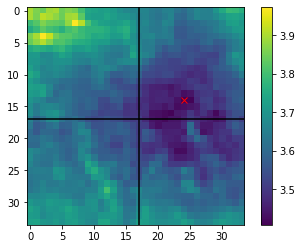

 40 -220 (332): 	( 5, -5)


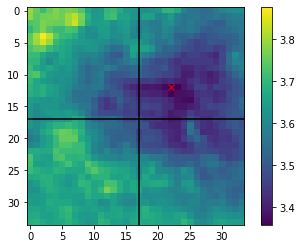

 40 -200 (605): 	( 5, -4)


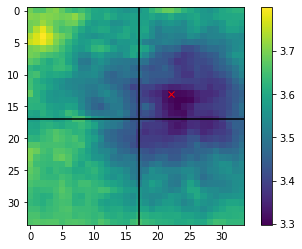

 40 -180 (762): 	( 5, -4)


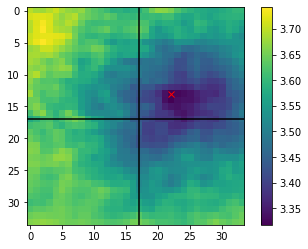

 40 -160 (1203): 	( 7, -4)


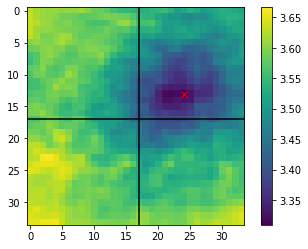

 40 -140 (1531): 	( 4, -3)


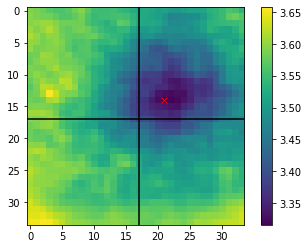

 40 -120 (1457): 	( 4, -3)


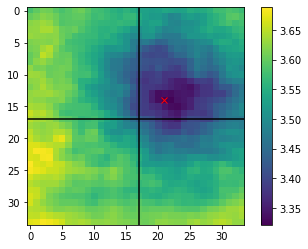

 40 -100 (1314): 	( 4, -3)


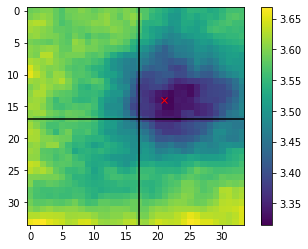

 40 -80 (1422): 	( 3, -1)


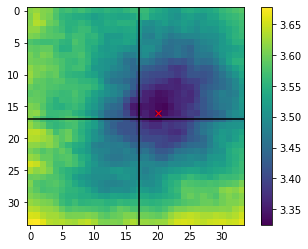

 40 -60 (1511): 	( 0, -1)


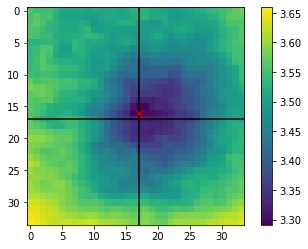

 40 -40 (1438): 	( 0, -1)


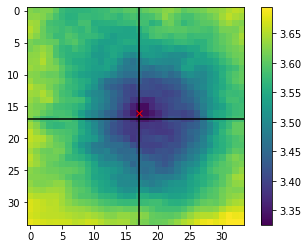

 40 -20 (1736): 	( 0, -1)


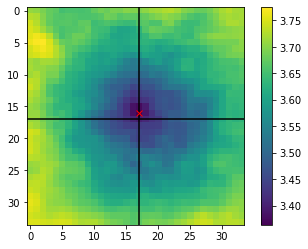

 40   0 (1531): 	( 0, -1)


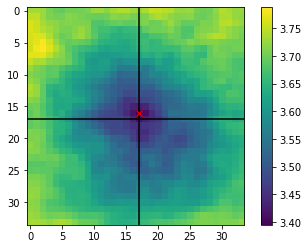

 40  20 (1548): 	( 0, -1)


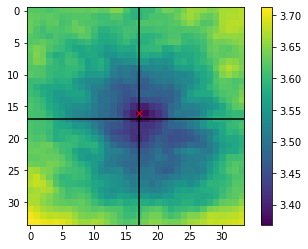

 40  40 (1869): 	( 1, -1)


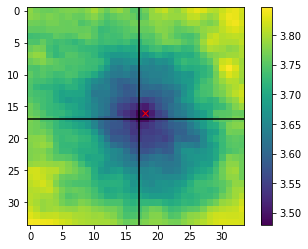

 40  60 (1822): 	( 0,  0)


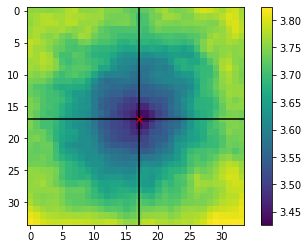

 40  80 (1866): 	( 0,  0)


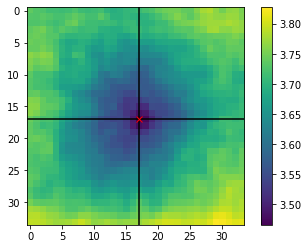

 40 100 (2157): 	( 0,  1)


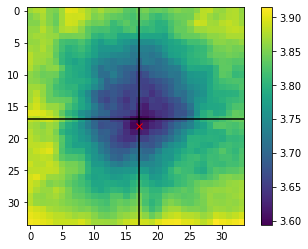

 40 120 (3215): 	( 2,  1)


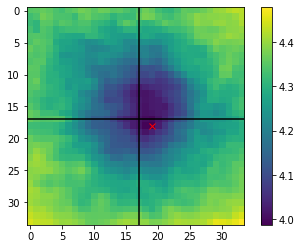

 40 140 (3509): 	( 1, -2)


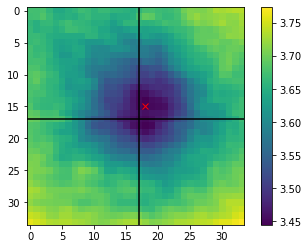

 40 160 (2732): 	( 0, -2)


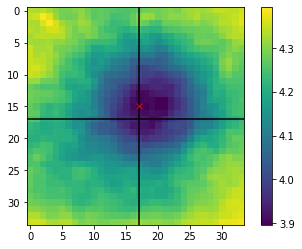

 40 180 (1339): 	( 3, -3)


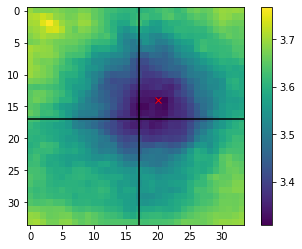

 40 200 (738): 	( 3, -1)


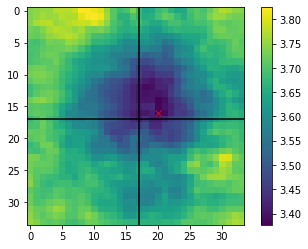

 40 220 (551): 	( 3, -3)


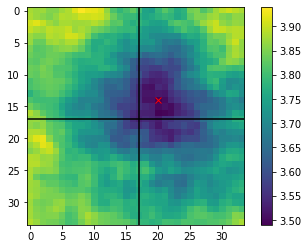

 40 240 (509): 	( 2, -4)


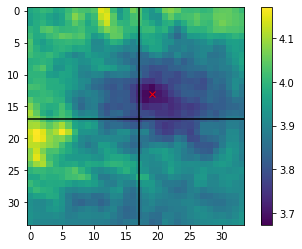

 60 -240 (204): 	( 3, -5)


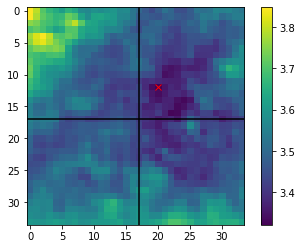

 60 -220 (339): 	( 5, -1)


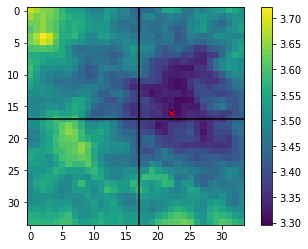

 60 -200 (416): 	( 6, -5)


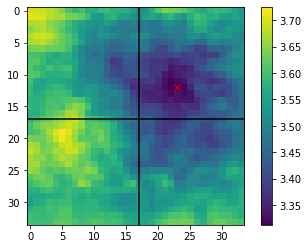

 60 -180 (505): 	( 7, -4)


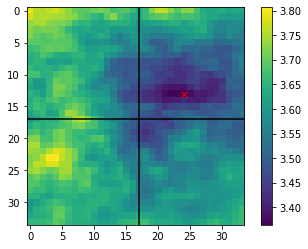

 60 -160 (925): 	( 6, -6)


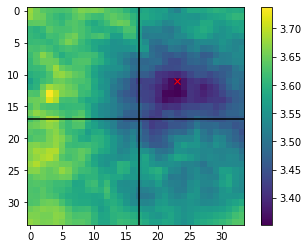

 60 -140 (1593): 	( 4, -3)


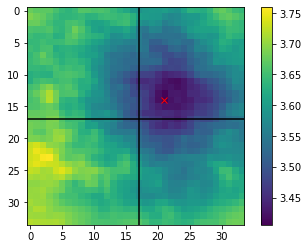

 60 -120 (1814): 	( 4, -3)


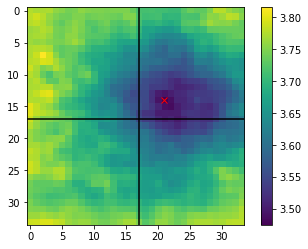

 60 -100 (1646): 	( 5, -2)


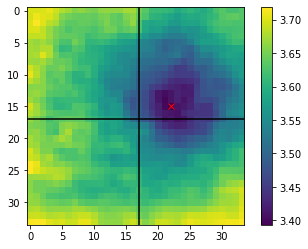

 60 -80 (1365): 	( 4, -1)


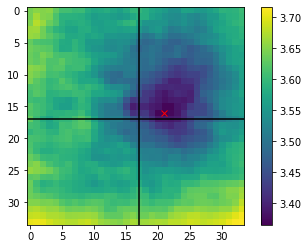

 60 -60 (1493): 	(-1, -2)


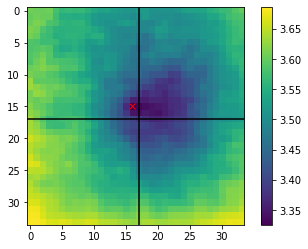

 60 -40 (1715): 	( 0, -2)


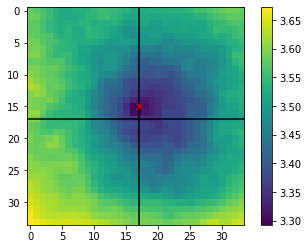

 60 -20 (1408): 	( 0, -2)


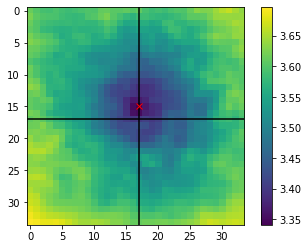

 60   0 (1612): 	( 0, -1)


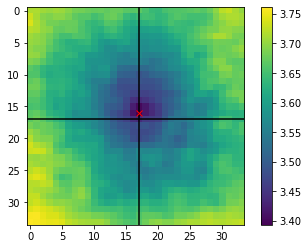

 60  20 (1703): 	( 0, -1)


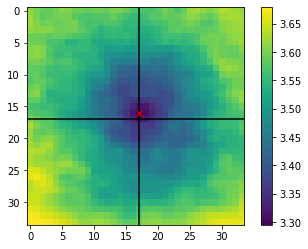

 60  40 (2062): 	( 0, -1)


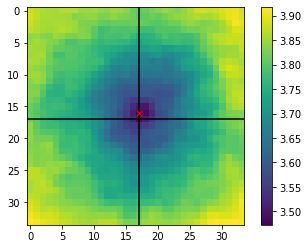

 60  60 (1868): 	( 0, -1)


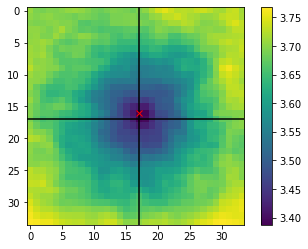

 60  80 (1702): 	( 0,  0)


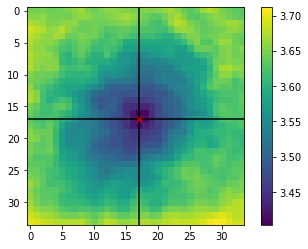

 60 100 (1694): 	( 0,  0)


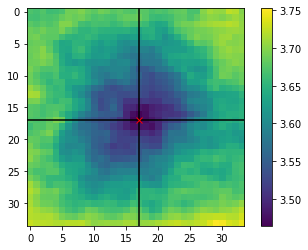

 60 120 (2798): 	( 1,  1)


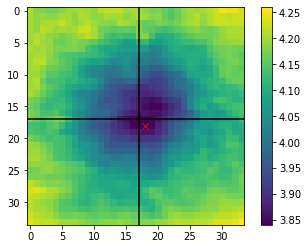

 60 140 (2871): 	( 3, -2)


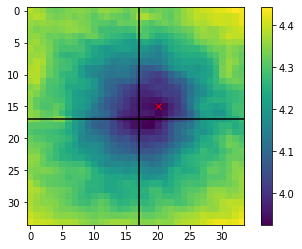

 60 160 (2438): 	( 4, -2)


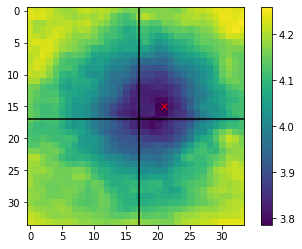

 60 180 (817): 	( 4, -3)


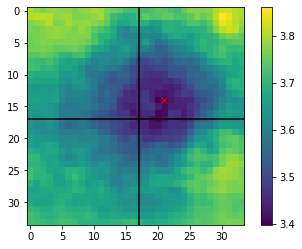

 60 200 (673): 	( 3, -1)


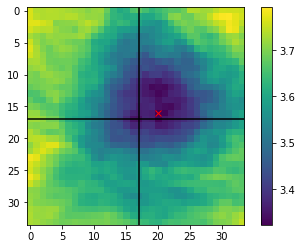

 60 220 (482): 	( 5, -2)


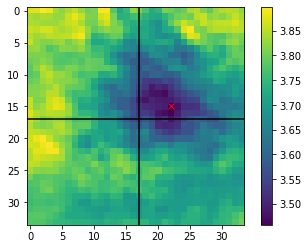

 60 240 (457): 	( 5, -2)


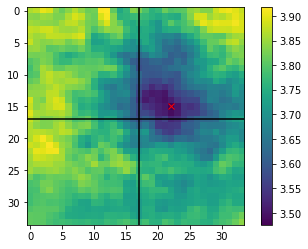

 80 -240 (167): 	( 5, -7)


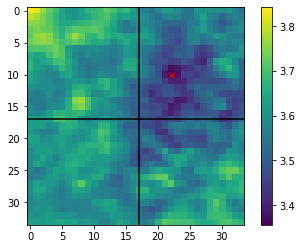

 80 -220 (193): 	( 5, -2)


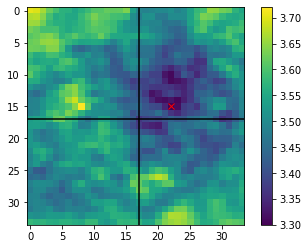

 80 -200 (250): 	( 5, -6)


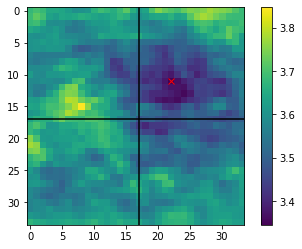

 80 -180 (340): 	( 5, -4)


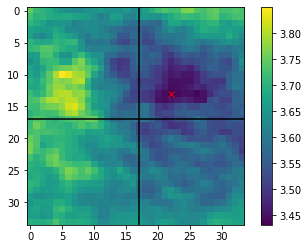

 80 -160 (823): 	( 6, -5)


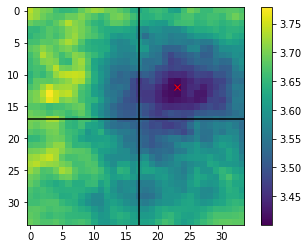

 80 -140 (1515): 	( 4, -3)


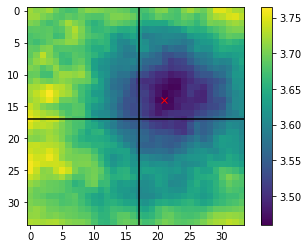

 80 -120 (1644): 	( 7,  0)


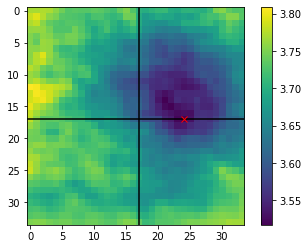

 80 -100 (1652): 	( 4, -2)


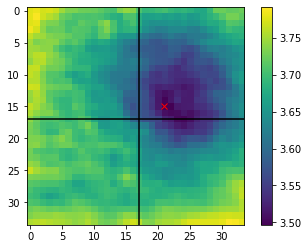

 80 -80 (1352): 	( 7, -3)


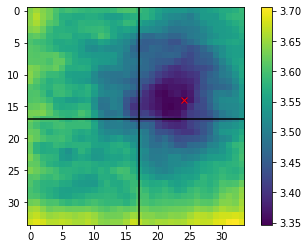

 80 -60 (1325): 	( 6, -3)


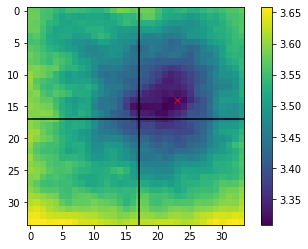

 80 -40 (1344): 	( 0, -2)


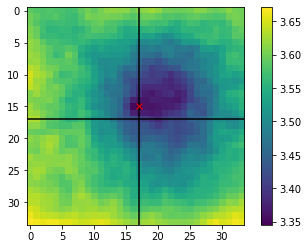

 80 -20 (1482): 	(-1, -2)


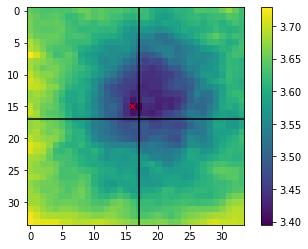

 80   0 (1384): 	( 0, -2)


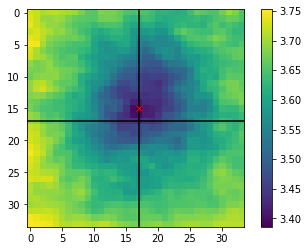

 80  20 (1465): 	( 0, -1)


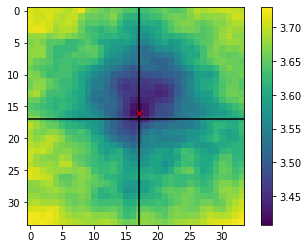

 80  40 (1767): 	( 0, -1)


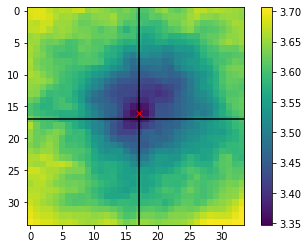

 80  60 (1768): 	( 0, -1)


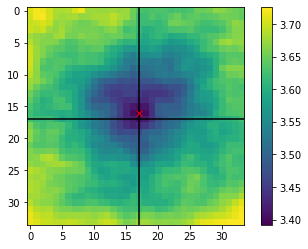

 80  80 (1509): 	( 1, -1)


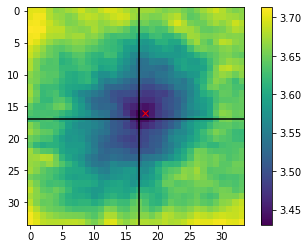

 80 100 (1682): 	( 1,  0)


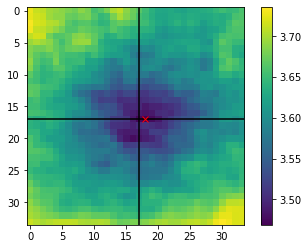

 80 120 (2339): 	( 1,  0)


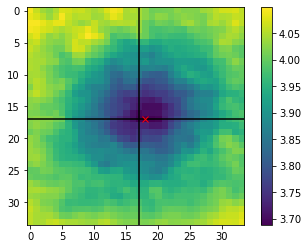

 80 140 (2316): 	( 3,  0)


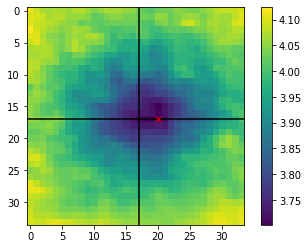

 80 160 (1284): 	( 3, -1)


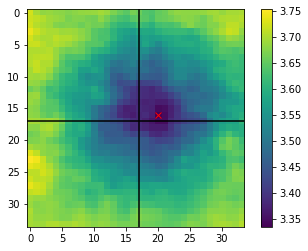

 80 180 (840): 	( 3,  0)


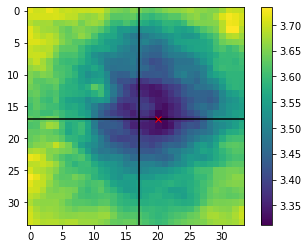

 80 200 (388): 	( 5, -1)


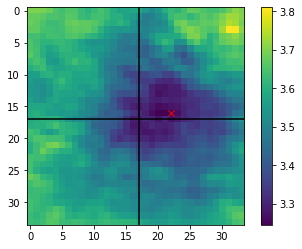

 80 220 (599): 	( 5, -1)


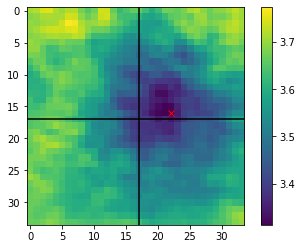

 80 240 (490): 	( 5, -2)


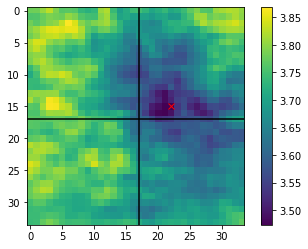

100 -240 (187): 	( 2, -4)


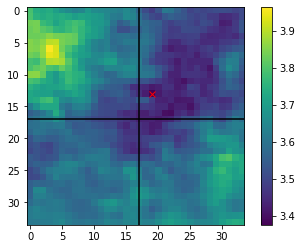

100 -220 (277): 	( 6, -3)


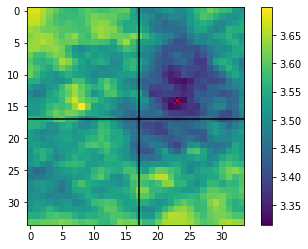

100 -200 (223): 	( 8, -5)


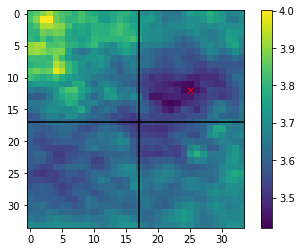

100 -180 (260): 	( 5, -4)


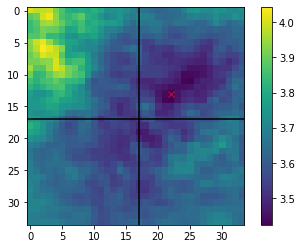

100 -160 (493): 	( 7, -6)


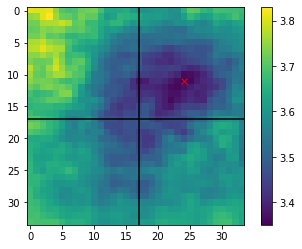

100 -140 (917): 	( 6, -5)


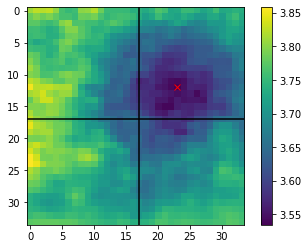

100 -120 (1243): 	( 6, -5)


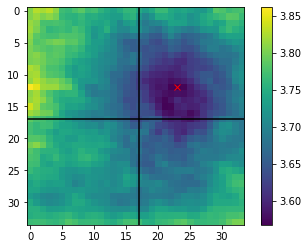

100 -100 (1388): 	( 4, -4)


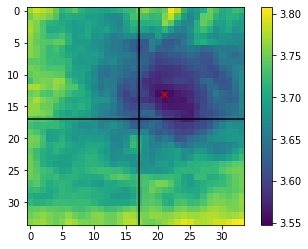

100 -80 (1328): 	( 4, -5)


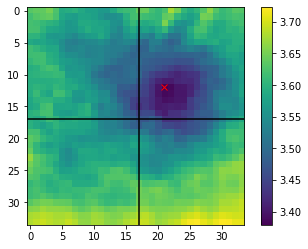

100 -60 (1407): 	( 4, -5)


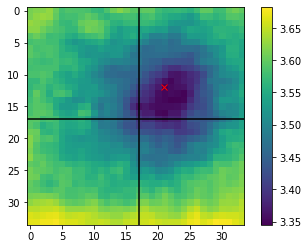

100 -40 (1334): 	( 6, -3)


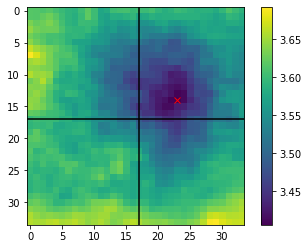

100 -20 (1364): 	( 6, -3)


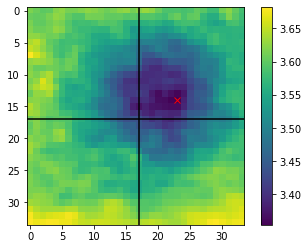

100   0 (1282): 	( 0, -2)


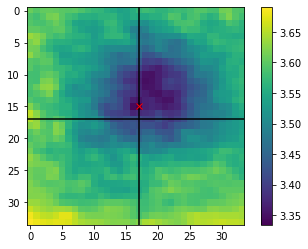

100  20 (1390): 	(-1, -2)


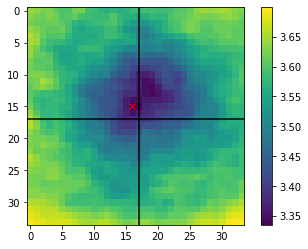

100  40 (1437): 	( 2, -5)


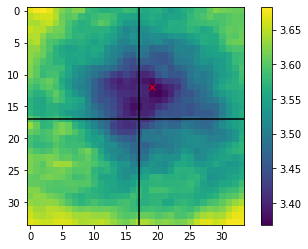

100  60 (1439): 	( 2, -4)


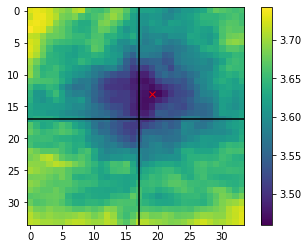

100  80 (1370): 	( 1, -4)


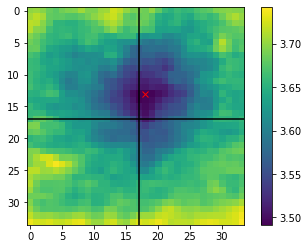

100 100 (1980): 	( 1, -4)


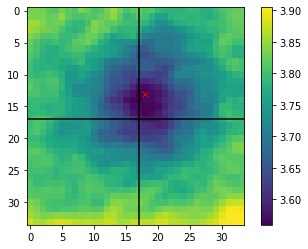

100 120 (2130): 	( 0, -3)


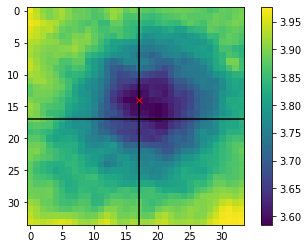

100 140 (1872): 	( 3, -2)


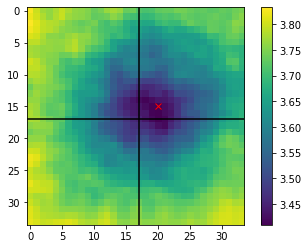

100 160 (966): 	( 4,  0)


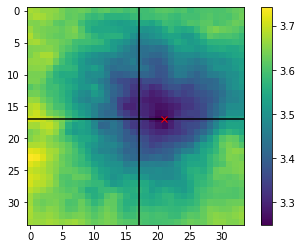

100 180 (707): 	( 3, -2)


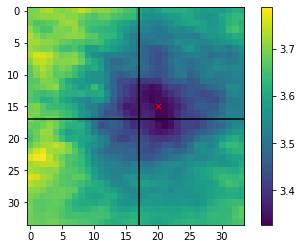

100 200 (429): 	( 3, -1)


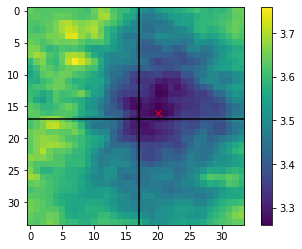

100 220 (407): 	( 3, -1)


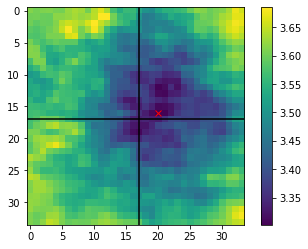

100 240 (392): 	( 0, -7)


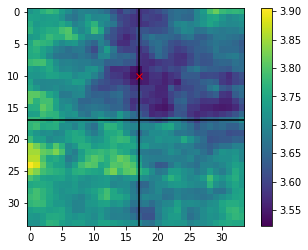

120 -240 (220): 	( 5, -2)


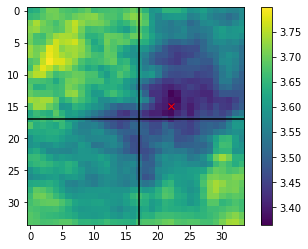

120 -220 (262): 	( 5, -3)


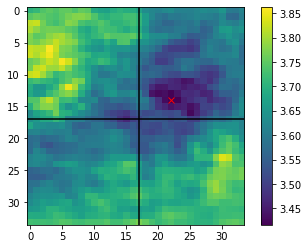

120 -200 (229): 	( 5, -3)


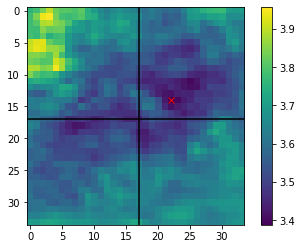

120 -180 (129): 	( 7, -7)


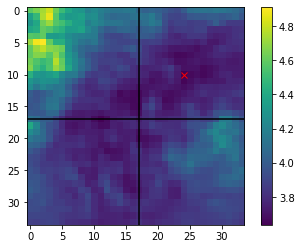

120 -160 (238): 	( 7, -7)


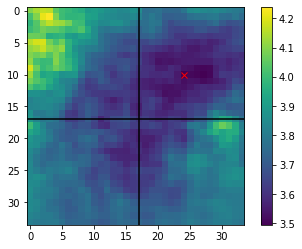

120 -140 (335): 	( 6, -4)


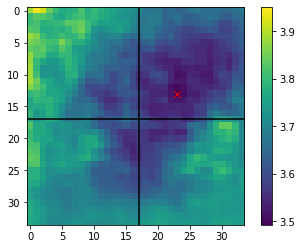

120 -120 (575): 	( 5, -2)


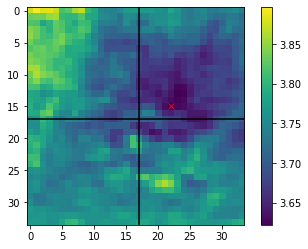

120 -100 (874): 	( 3, -5)


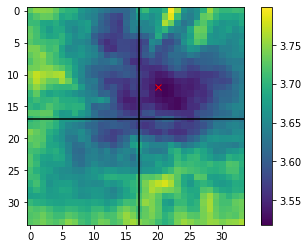

120 -80 (1292): 	( 4, -5)


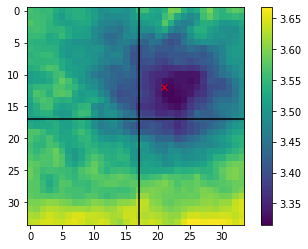

120 -60 (1526): 	( 5, -6)


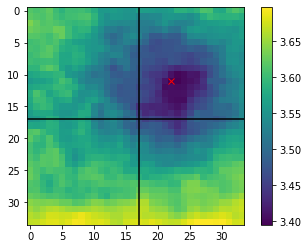

120 -40 (1556): 	( 4, -1)


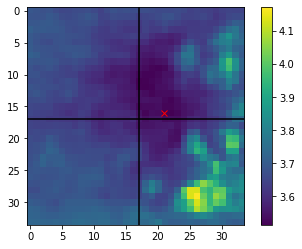

120 -20 (1703): 	( 2, -7)


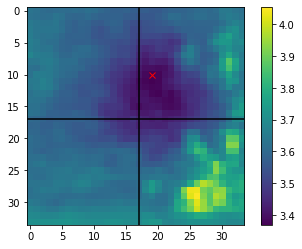

120   0 (1412): 	( 2, -6)


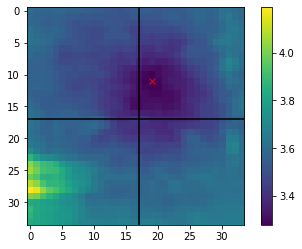

120  20 (1539): 	( 2, -5)


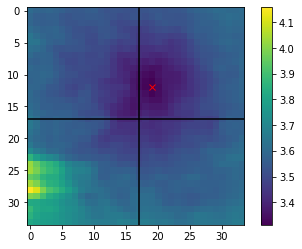

120  40 (1703): 	( 2, -6)


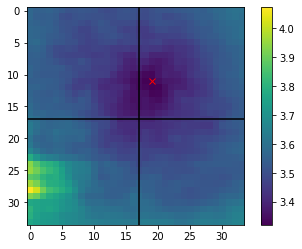

120  60 (1652): 	( 1, -6)


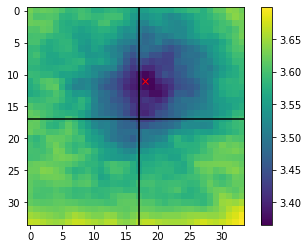

120  80 (1599): 	( 2, -4)


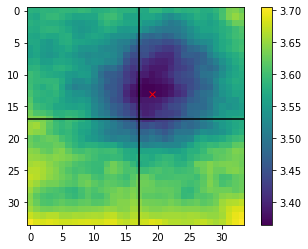

120 100 (1643): 	( 2, -4)


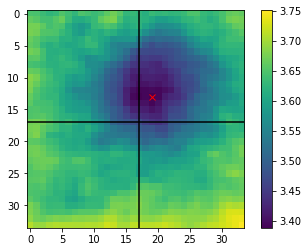

120 120 (1763): 	( 0, -4)


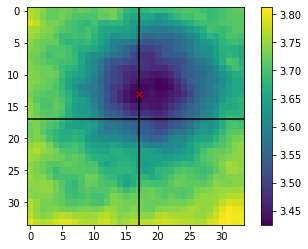

120 140 (872): 	( 0, -3)


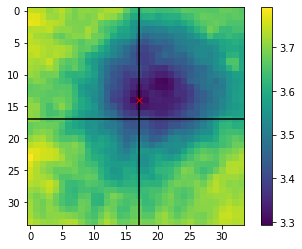

120 160 (637): 	( 4, -2)


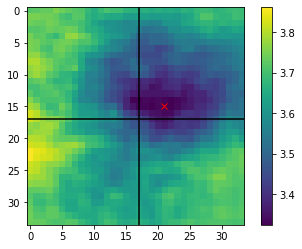

120 180 (399): 	( 7, -3)


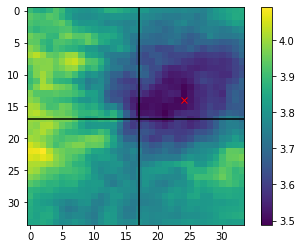

120 200 (254): 	( 3, -3)


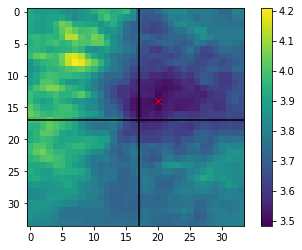

120 220 (185): 	(10, -2)


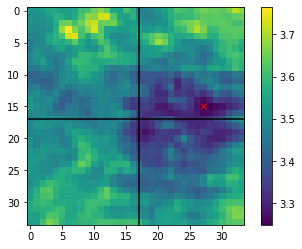

120 240 (426): 	( 0, -8)


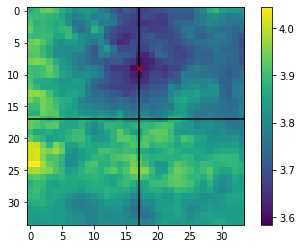

140 -240 (191): 	( 5, -2)


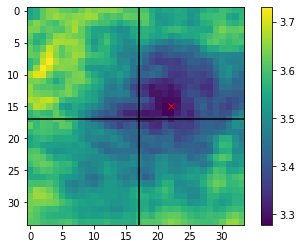

140 -220 (231): 	( 3, -4)


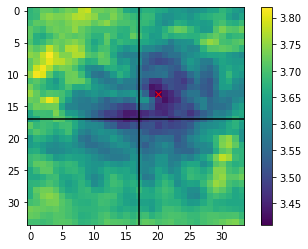

140 -200 (141): 	(-2, -1)


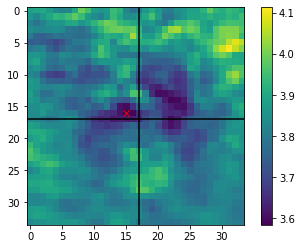

140 -180 (95): 	( 5, -4)


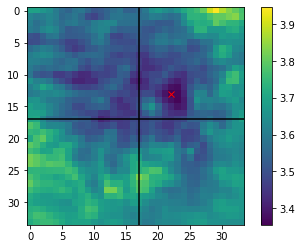

140 -160 (154): 	( 5, -5)


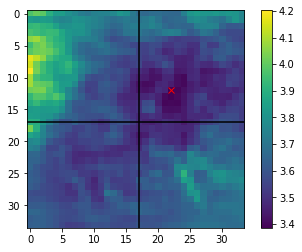

140 -140 (229): 	( 6, -5)


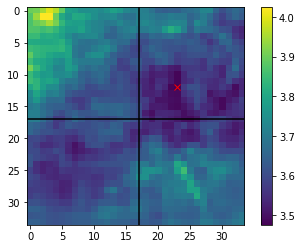

140 -120 (403): 	( 6, -3)


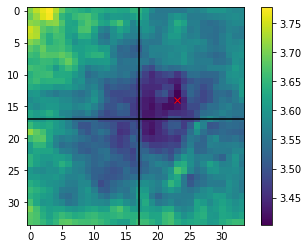

140 -100 (654): 	( 5, -2)


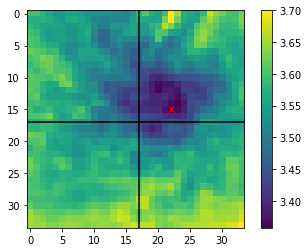

140 -80 (1083): 	( 6, -3)


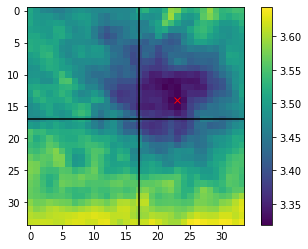

140 -60 (1011): 	( 6, -6)


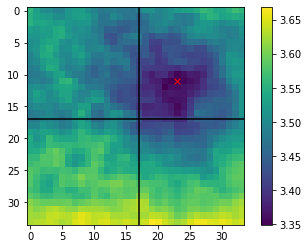

140 -40 (1420): 	( 2, -5)


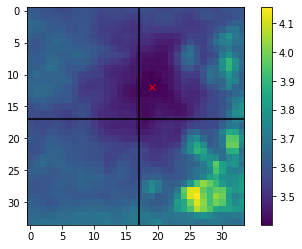

140 -20 (1667): 	( 3, -5)


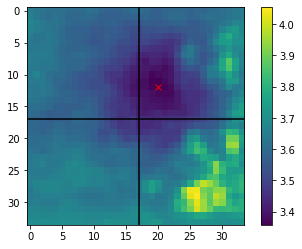

140   0 (1806): 	( 3, -5)


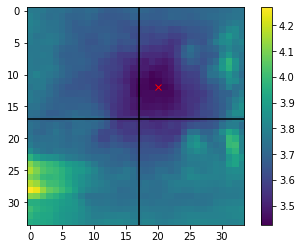

140  20 (1784): 	( 2, -5)


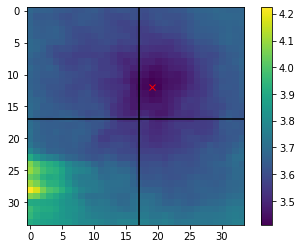

140  40 (2111): 	( 2, -6)


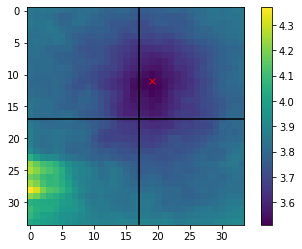

140  60 (1680): 	( 2, -6)


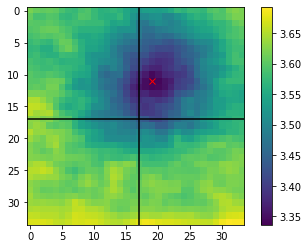

140  80 (1590): 	( 2, -6)


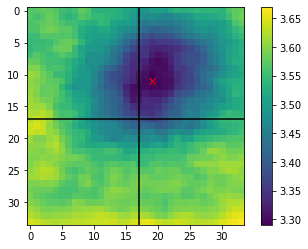

140 100 (1156): 	( 2, -9)


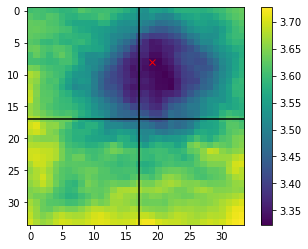

140 120 (799): 	( 2, -10)


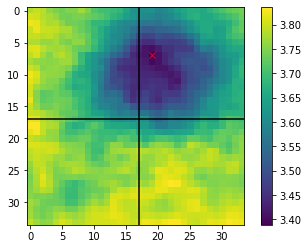

140 140 (582): 	( 5, -6)


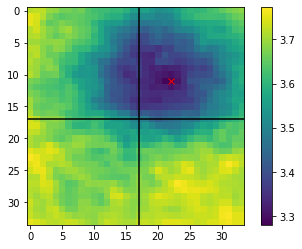

140 160 (370): 	( 5, -6)


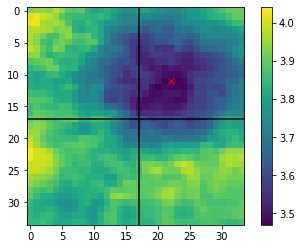

140 180 (401): 	( 7, -5)


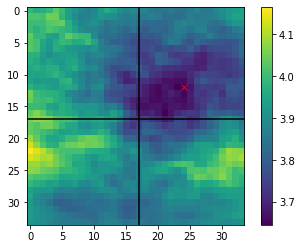

140 200 (193): 	( 0, -1)


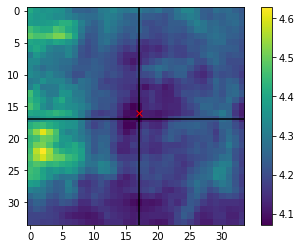

140 220 (122): 	(-8, -12)


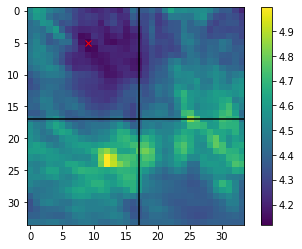

140 240 (163): 	(-6, -9)


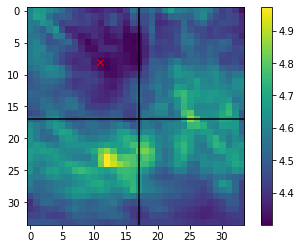

160 -240 (152): 	( 4, -2)


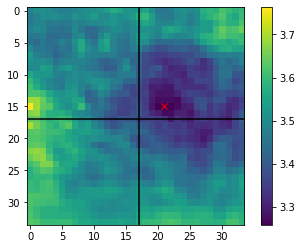

160 -220 (135): 	(15, -6)


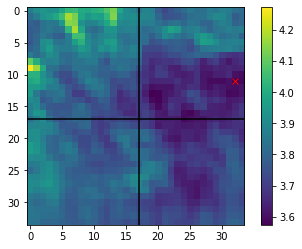

160 -200 (131): 	( 2, -3)


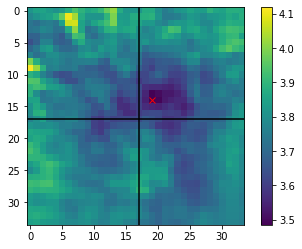

160 -180 (97): 	( 5, -4)


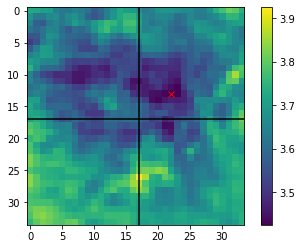

160 -160 (131): 	(-15, 15)


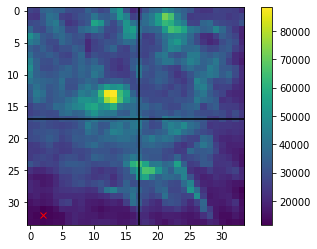

160 -140 (129): 	( 6, -5)


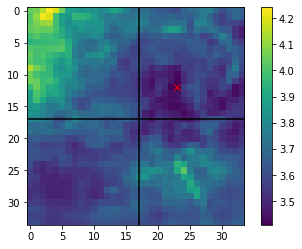

160 -120 (249): 	( 2,  1)


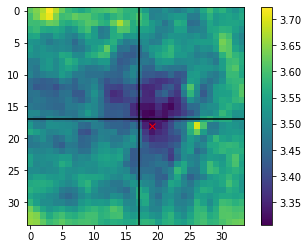

160 -100 (285): 	( 5, -6)


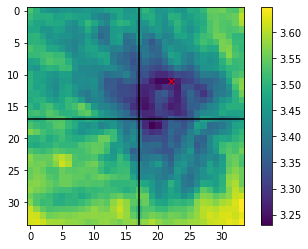

160 -80 (428): 	( 3, -6)


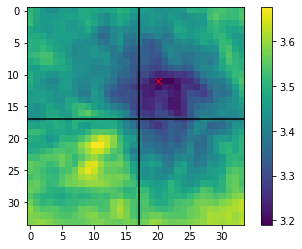

160 -60 (713): 	( 3, -6)


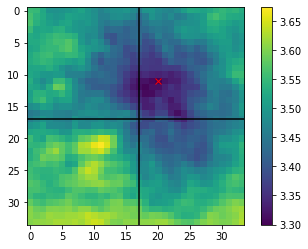

160 -40 (912): 	( 2, -4)


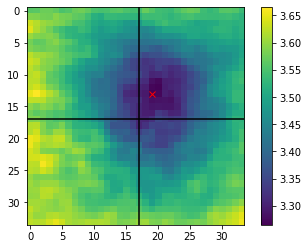

160 -20 (1513): 	( 3, -5)


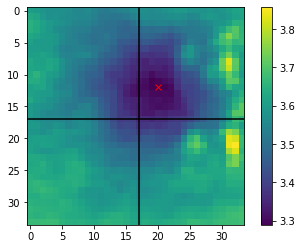

160   0 (1803): 	( 3, -5)


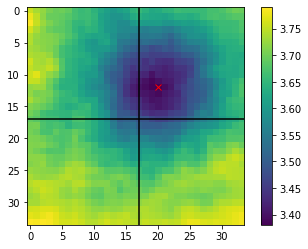

160  20 (1518): 	( 2, -6)


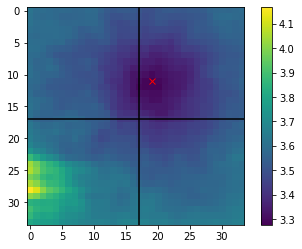

160  40 (1524): 	( 2, -5)


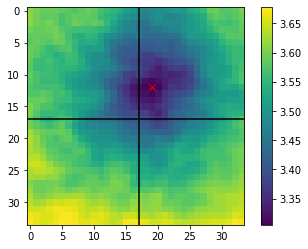

160  60 (1291): 	( 2, -6)


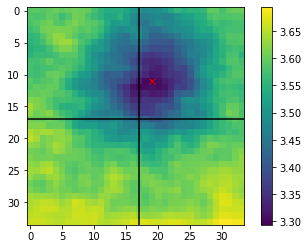

160  80 (907): 	( 2, -8)


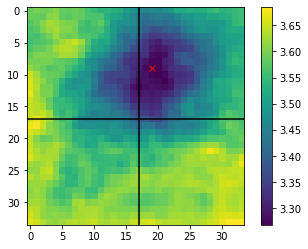

160 100 (689): 	( 2, -9)


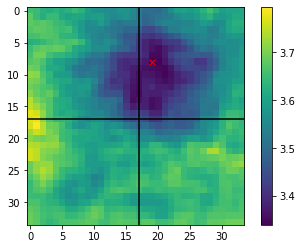

160 120 (467): 	( 2, -9)


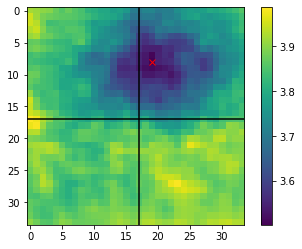

160 140 (314): 	( 3, -8)


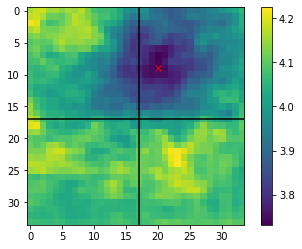

160 160 (224): 	( 9, -9)


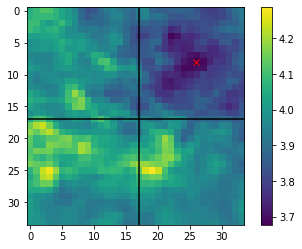

160 180 (169): 	(11, 16)


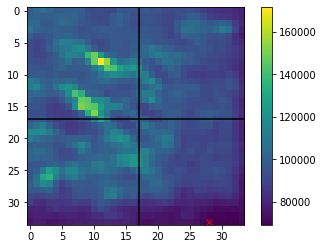

160 200 (201): 	( 0, -5)


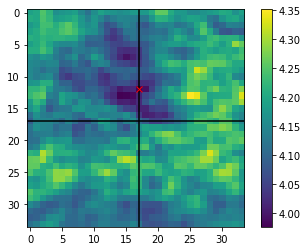

160 220 (200): 	(-5, -7)


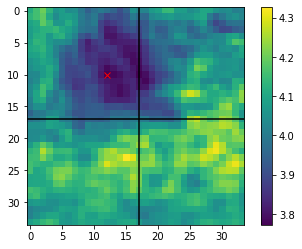

160 240 (264): 	(-4, -13)


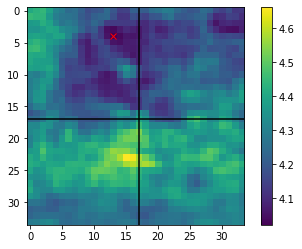

180 -240 (199): 	( 5,  1)


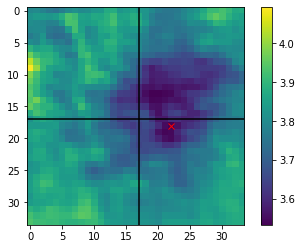

180 -220 (218): 	( 7, -5)


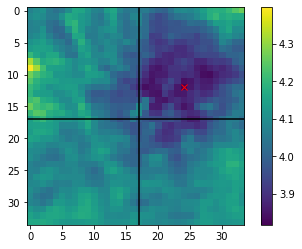

180 -200 (131): 	( 2, -4)


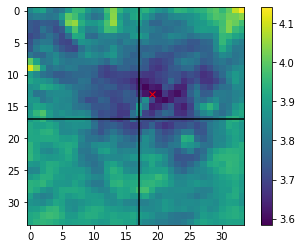

180 -180 (96): 	( 2, -3)


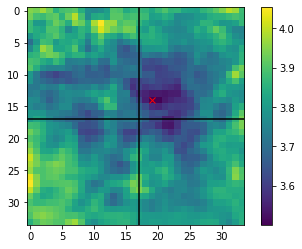

180 -160 (148): 	( 8,  0)


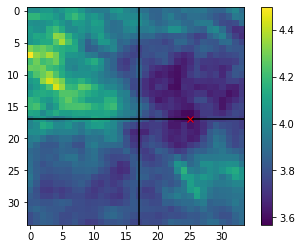

180 -140 (181): 	(-3, 12)


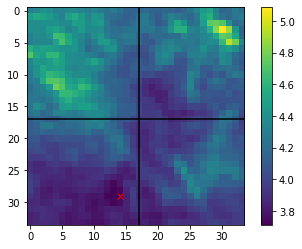

180 -120 (166): 	( 3, -3)


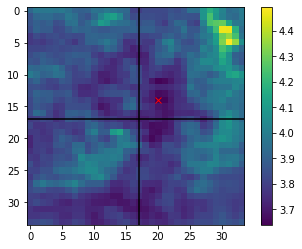

180 -100 (231): 	( 3, -6)


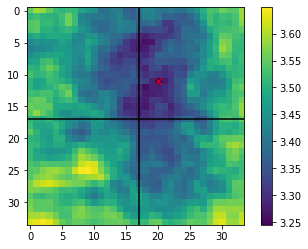

180 -80 (415): 	( 3, -6)


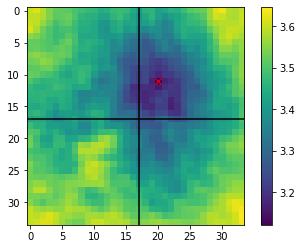

180 -60 (392): 	( 3, -6)


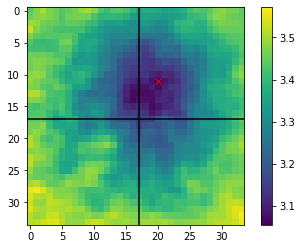

180 -40 (416): 	( 3, -6)


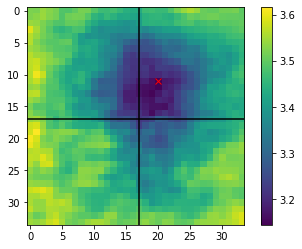

180 -20 (773): 	( 2, -6)


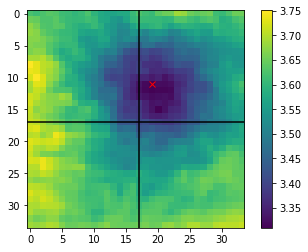

180   0 (910): 	( 2, -6)


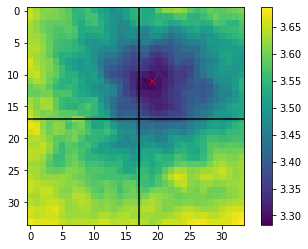

180  20 (684): 	( 2, -4)


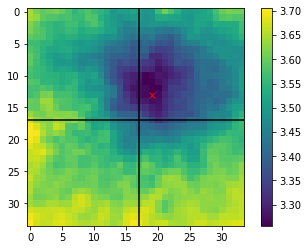

180  40 (613): 	( 3, -5)


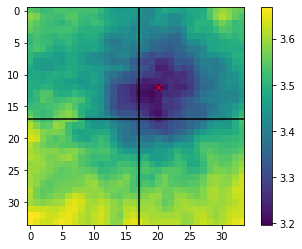

180  60 (831): 	( 2, -4)


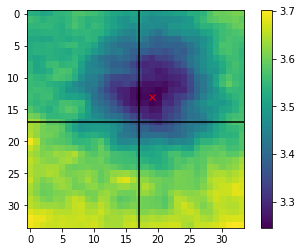

180  80 (735): 	( 1, -8)


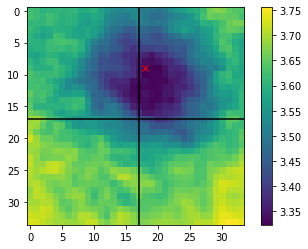

180 100 (506): 	( 2, -8)


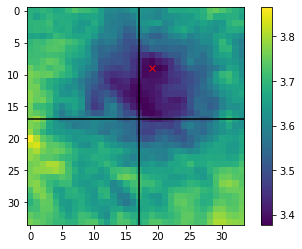

180 120 (270): 	( 3, -8)


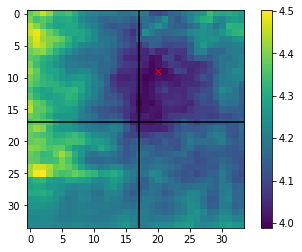

180 140 (196): 	( 2, -8)


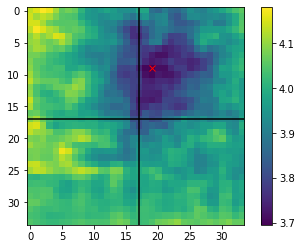

180 160 (66): 	(14, 15)


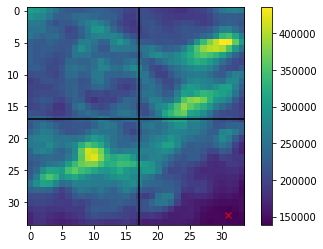

180 180 (232): 	( 6, -3)


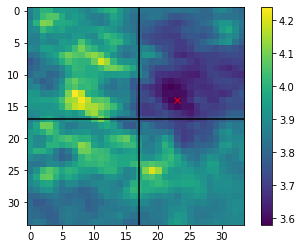

180 200 (241): 	( 4, -2)


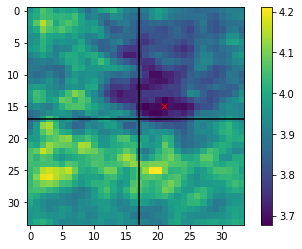

180 220 (99): 	(-7, 16)


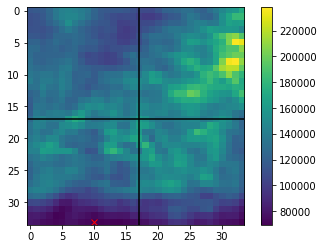

180 240 (190): 	(12, -15)


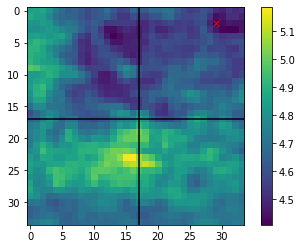

200 -240 (182): 	( 5,  1)


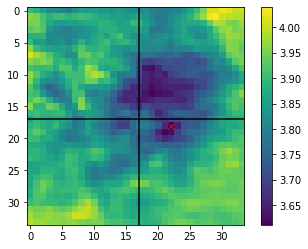

200 -220 (262): 	( 2, -4)


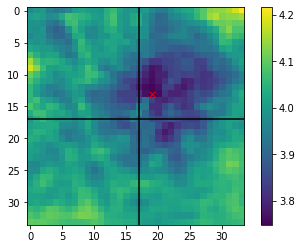

200 -200 (135): 	(-15, -10)


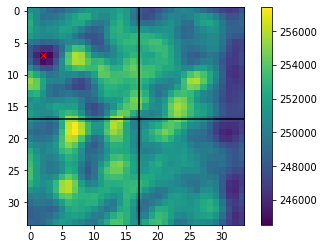

200 -180 (158): 	( 1, -5)


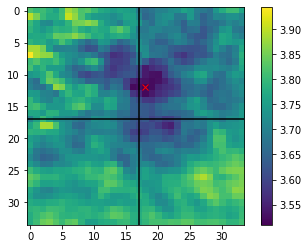

200 -160 (237): 	( 3, -6)


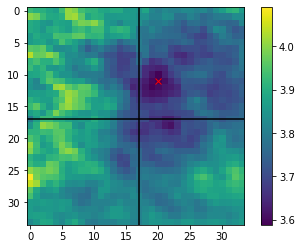

200 -140 (215): 	( 1,  2)


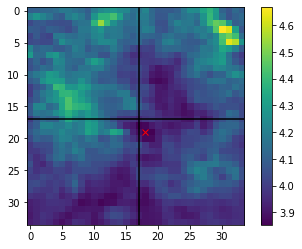

200 -120 (201): 	(-5, 13)


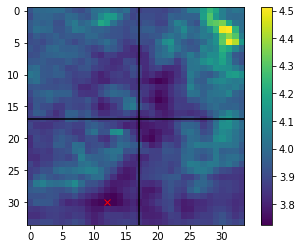

200 -100 (221): 	( 3, -6)


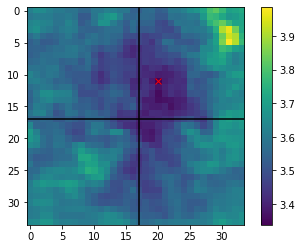

200 -80 (289): 	( 3, -6)


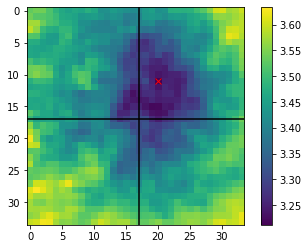

200 -60 (309): 	(-1, -4)


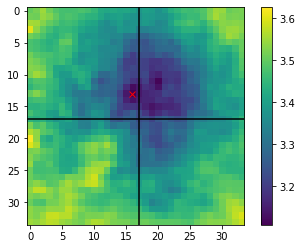

200 -40 (198): 	(-1, -4)


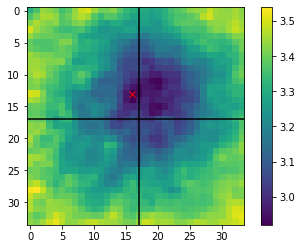

200 -20 (295): 	( 2, -5)


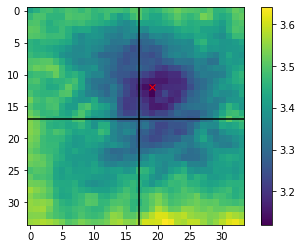

200   0 (401): 	( 4, -7)


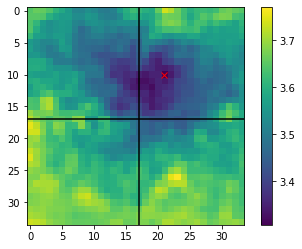

200  20 (487): 	( 3, -5)


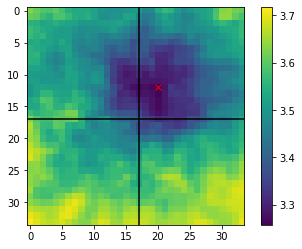

200  40 (408): 	( 4, -5)


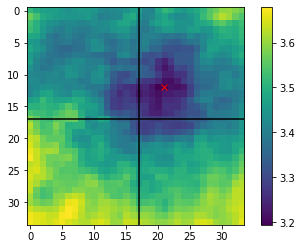

200  60 (648): 	( 3, -4)


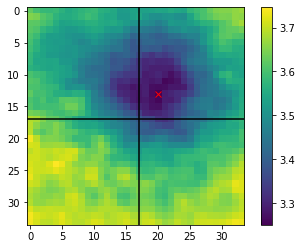

200  80 (671): 	( 3, -4)


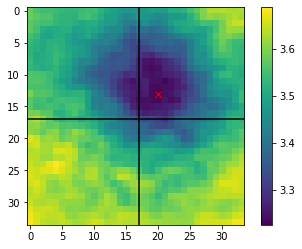

200 100 (523): 	( 2, -8)


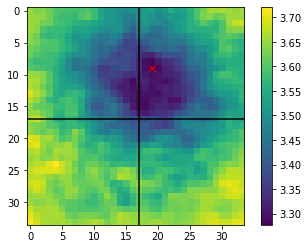

200 120 (270): 	( 7, -4)


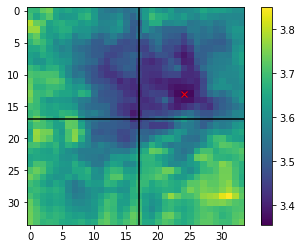

200 140 (165): 	( 7, -4)


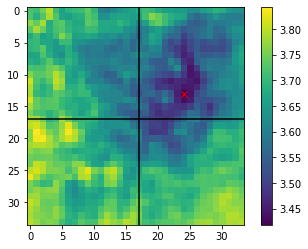

200 160 (128): 	( 6, -4)


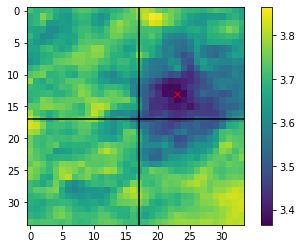

200 180 (162): 	( 6, -3)


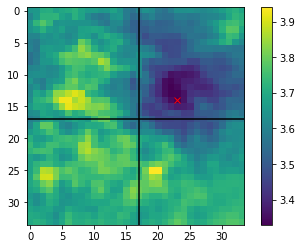

200 200 (163): 	( 6, -4)


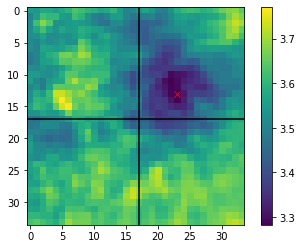

200 220 (153): 	( 1, -6)


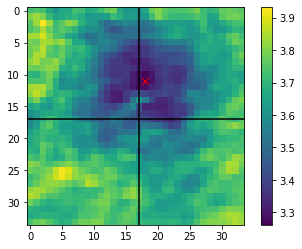

200 240 (165): 	( 8, -5)


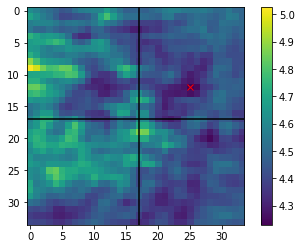

220 -240 (111): 	(-17, -9)


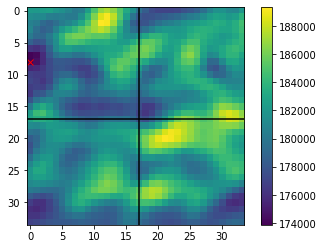

220 -220 (202): 	( 1, -5)


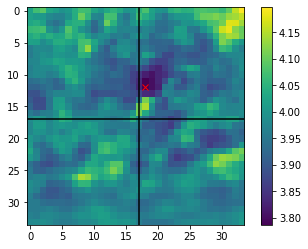

220 -200 (210): 	( 1, -5)


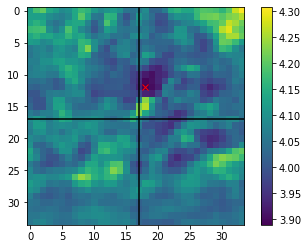

220 -180 (165): 	( 3,  0)


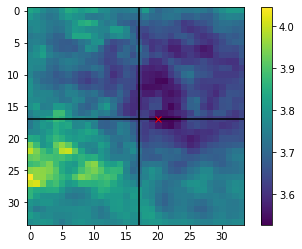

220 -160 (285): 	( 5, -4)


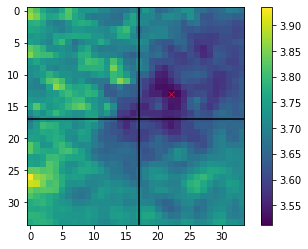

220 -140 (323): 	( 5, -4)


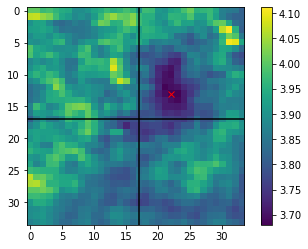

220 -120 (229): 	( 1,  2)


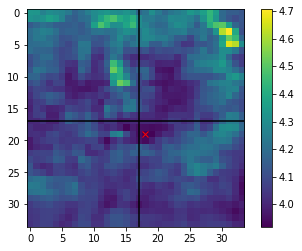

220 -100 (239): 	( 7, -6)


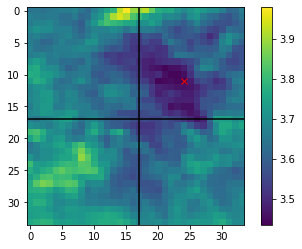

220 -80 (174): 	( 8, -2)


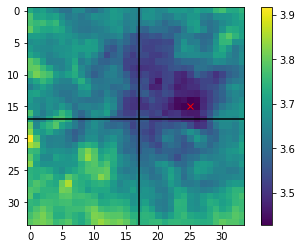

220 -60 (317): 	( 3, -6)


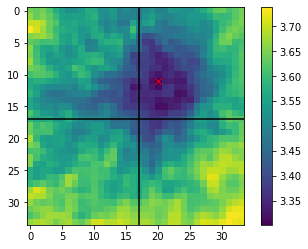

220 -40 (303): 	( 6, -5)


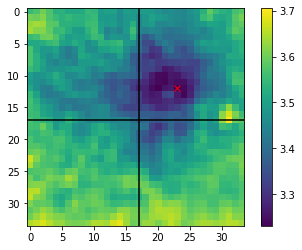

220 -20 (185): 	( 2, -5)


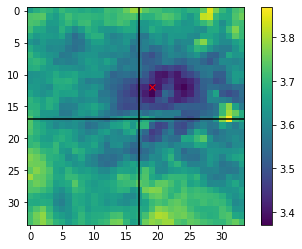

220   0 (346): 	( 2, -5)


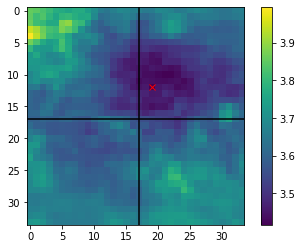

220  20 (244): 	( 5, -2)


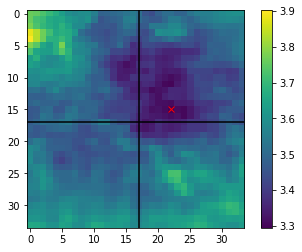

220  40 (167): 	( 5, -6)


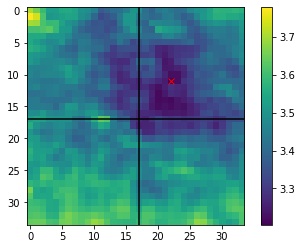

220  60 (358): 	( 3, -4)


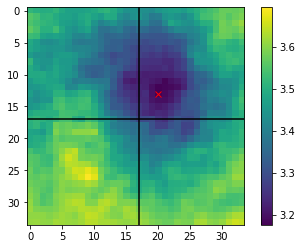

220  80 (505): 	( 4, -6)


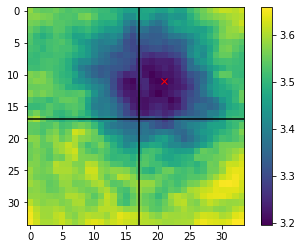

220 100 (345): 	( 3, -6)


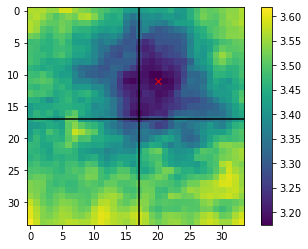

220 120 (290): 	( 8, -3)


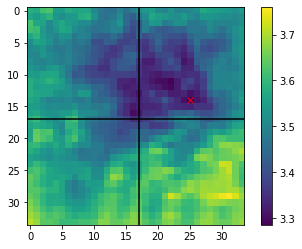

220 140 (138): 	( 7, -4)


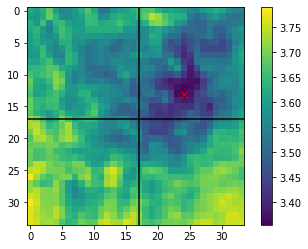

220 160 (136): 	( 6, -4)


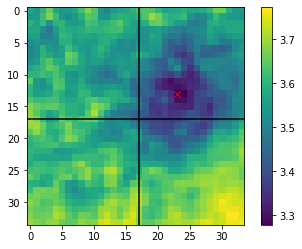

220 180 (145): 	( 6, -4)


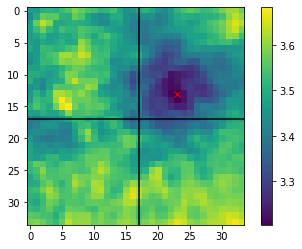

220 200 (153): 	( 6, -4)


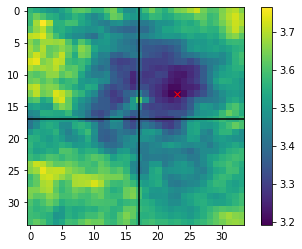

220 220 (97): 	( 7, -6)


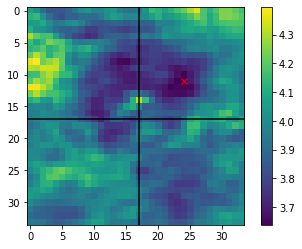

220 240 (67): 	( 9, 16)


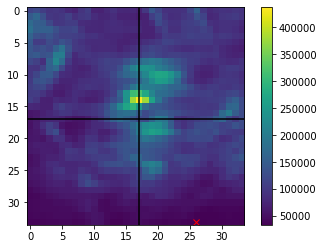

240 -240 (164): 	( 4, -7)


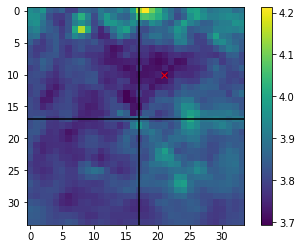

240 -220 (186): 	( 4, -7)


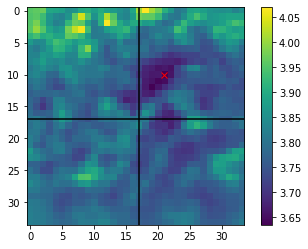

240 -200 (94): 	( 0, 16)


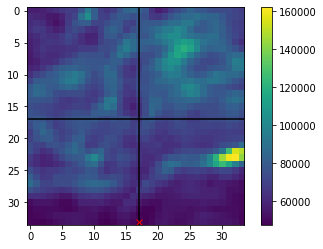

240 -180 (144): 	( 6,  0)


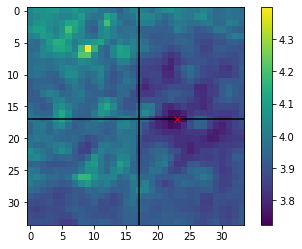

240 -160 (192): 	( 5, -4)


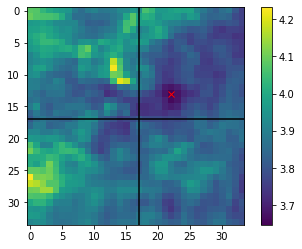

240 -140 (186): 	( 5, -4)


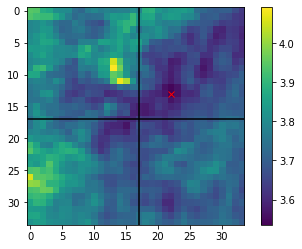

240 -120 (231): 	(15, 16)


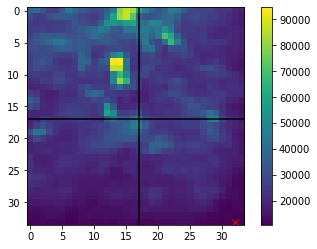

240 -100 (171): 	(15, 16)


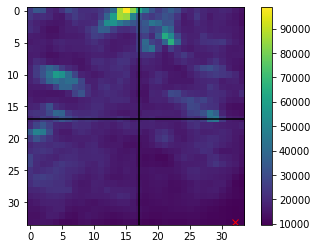

240 -80 (193): 	( 4, -6)


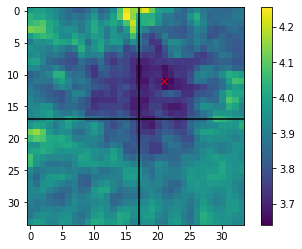

240 -60 (216): 	( 5, -8)


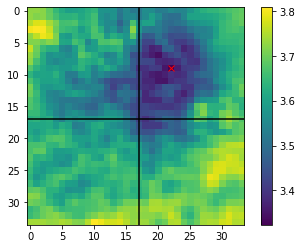

240 -40 (250): 	( 5, -8)


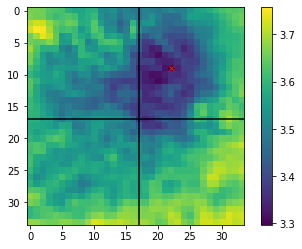

240 -20 (295): 	( 6, -7)


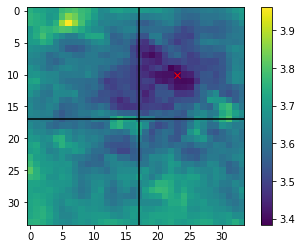

240   0 (250): 	( 5, -7)


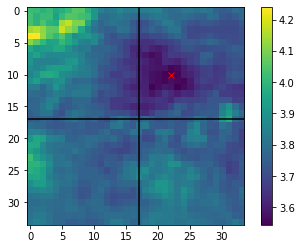

240  20 (148): 	( 4, -6)


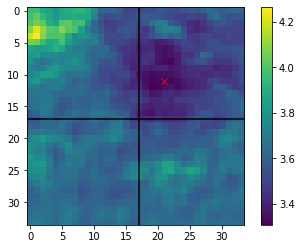

240  40 (24): 	(-6, 13)


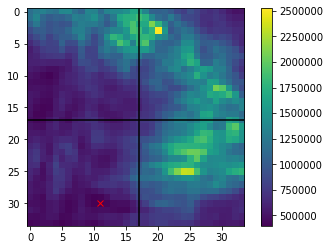

240  60 (152): 	( 4, -6)


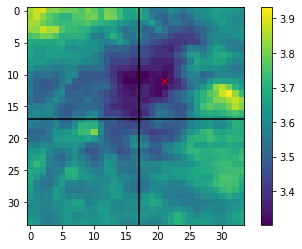

240  80 (289): 	( 4, -6)


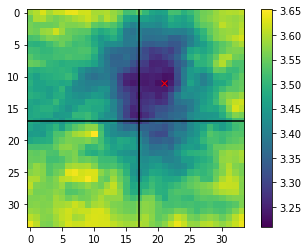

240 100 (236): 	(-2, -6)


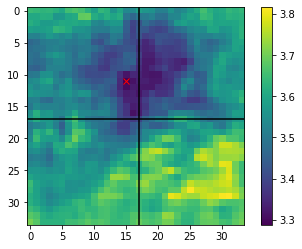

240 120 (148): 	(11, -5)


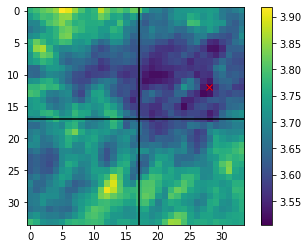

240 140 (241): 	( 7, -4)


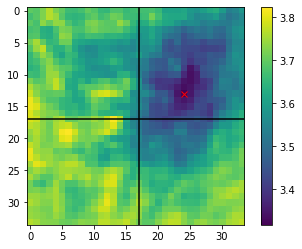

240 160 (75): 	(10, 12)


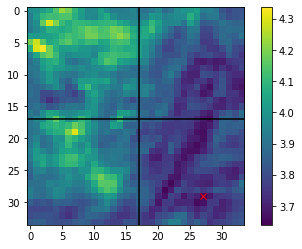

240 180 (69): 	( 3, -10)


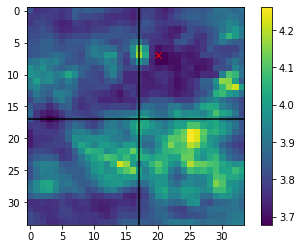

240 200 (88): 	( 6, -8)


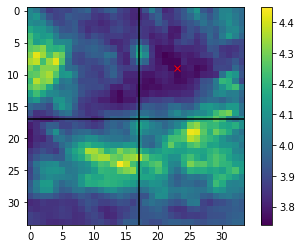

240 220 (70): 	( 7, -6)


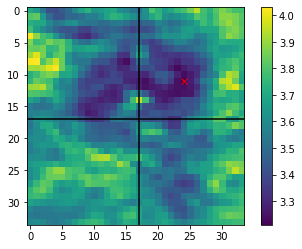

240 240 (56): 	( 9, 16)


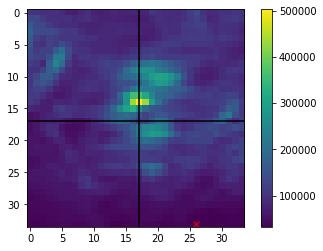

In [14]:
# Calculate LL-surface at each position
Erad = pixPerDeg*0.75 # in pixels
crop_edge = 3

LLspace1 = np.zeros([Npos,Npos,NX-2*crop_edge,NX-2*crop_edge])
centers1 = np.zeros([Npos,Npos,2])

for xx in range(Npos):
    for yy in range(Npos):
        rs = np.sqrt(np.add(np.square(ex-locs[xx]), np.square(ey-locs[yy])))
        valE = np.where(rs < Erad)[0]
        valtot = np.intersect1d(valdata, valE)
        if len(valtot) > 0:
            Rcc = conv_expand( Robs[valtot,:], num_space )
            cell_shift_mod.set_poisson_norm(Rcc)
            LLcc = np.reshape(
                cell_shift_mod.eval_models(
                    input_data=[Xstim[valtot,:], Xsac1[valtot,:], Xsac2[valtot,:]], 
                    output_data=Rcc, nulladjusted=False),
                [NX,NX,NC])
            LLpos = np.mean(LLcc,axis=2)
            if crop_edge == 0:
                LLspace1[xx,yy,:,:] = deepcopy(LLpos)
            else:
                LLspace1[xx,yy,:,:] = deepcopy(LLpos)[crop_edge:-crop_edge,:][:,crop_edge:-crop_edge]
                
            min1 = np.argmin(np.min(LLspace1[xx,yy,:,:],axis=0))
            min2 = np.argmin(np.min(LLspace1[xx,yy,:,:],axis=1))
            centers1[xx,yy,:] = [min1-NX//2+crop_edge, min2-NX//2+crop_edge]
            print("%3.0f %3.0f (%d): \t(%2d, %2d)"%(locs[xx], locs[yy], 
                                                    len(valtot), min1-NX//2+crop_edge,min2-NX//2+crop_edge))
            plt.imshow(LLspace1[xx,yy,:,:])
            plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
            plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
            plt.plot(min1,min2,'rx')
            plt.colorbar()
            plt.show()

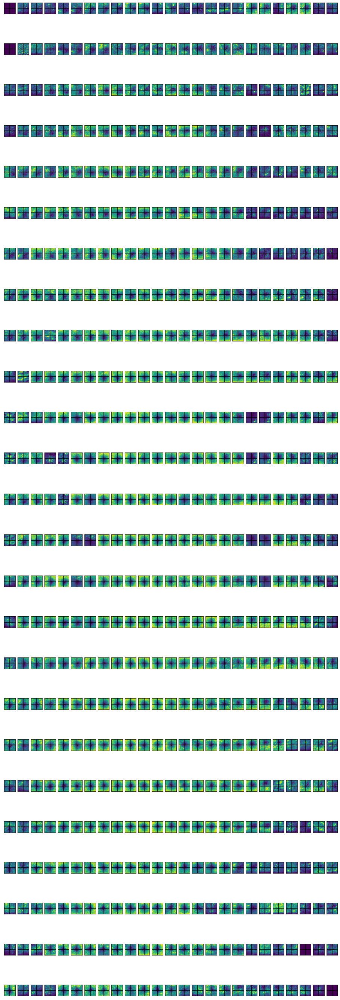

In [48]:
DU.subplot_setup(Npos,Npos)
for xx in range(Npos):
    for yy in range(Npos):
        if LLspace1[xx][yy] is not None:
            ax = plt.subplot(Npos,Npos,yy*Npos+xx+1)
            plt.imshow(LLspace1[xx,yy,:,:])
            plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
            plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
            ax.set_xticks([])
            ax.set_yticks([])
            #plt.title("%0.1f, %0.1f"%((xx-13)*20, (yy-13)*20))
plt.show()

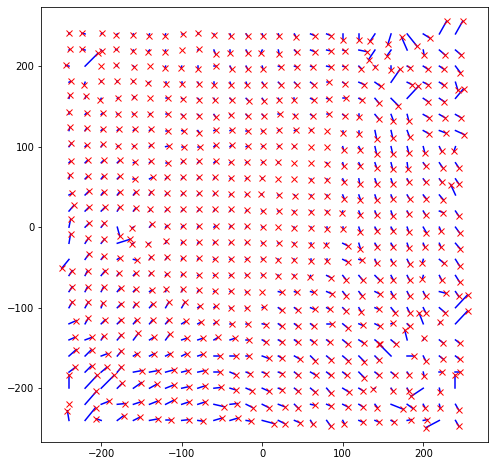

In [15]:
plt.figure(figsize=(8,8))
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers1[xx,yy,0]+locs[xx]], [locs[yy], centers1[xx,yy,1]+locs[yy]],'b')
        plt.plot(centers1[xx,yy,0]+locs[xx], centers1[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')
plt.show()

In [31]:
sio.savemat(dirname+'Data1231eyecorr_v1.mat', {'centers_raw':centers1, 'centers_sm':centers3,
                                              'LLspace':LLspace1, 'locs':locs})

In [16]:
def LLsmoother(LLsurface):
    newLL = np.zeros(LLsurface.shape)
    newLL += np.multiply(LLsurface, 0.2) 
    newLL += np.multiply(NDNutils.shift_mat_zpad(LLsurface,-1,dim=0), 0.2)
    newLL += np.multiply(NDNutils.shift_mat_zpad(LLsurface,-1,dim=1), 0.2)
    newLL += np.multiply(NDNutils.shift_mat_zpad(LLsurface,1,dim=0), 0.2)
    newLL += np.multiply(NDNutils.shift_mat_zpad(LLsurface,1,dim=1), 0.2)
    newLL[:,0] += np.multiply(0.2, LLsurface[:,0])
    newLL[:,-1] += np.multiply(0.2, LLsurface[:,-1])
    newLL[0,:] += np.multiply(0.2, LLsurface[0,:])
    newLL[-1,:] += np.multiply(0.2, LLsurface[-1,:])
    return newLL    

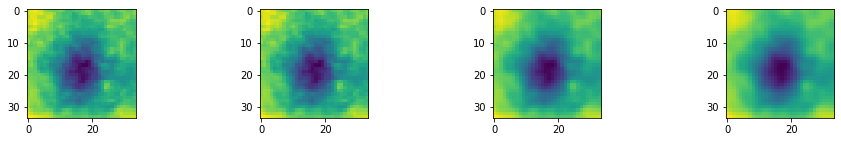

In [17]:
LLspace2 = deepcopy(LLspace1)
xx, yy = 13,13
LLsm = LLsmoother(LLspace2[xx,yy,:,:])
DU.subplot_setup(1,4)
plt.subplot(1,4,1)
plt.imshow(LLspace1[xx,yy,:,:])
plt.subplot(1,4,2)
plt.imshow(LLspace2[xx,yy,:,:])
plt.subplot(1,4,3)
plt.imshow(LLsm)
LLsm = LLsmoother(LLsm)
plt.subplot(1,4,4)
plt.imshow(LLsm)
plt.show()

In [18]:
centers2 = deepcopy(centers1)
centers3 = deepcopy(centers1)
for xx in range(Npos):
    for yy in range(Npos):
            LLsm = LLsmoother(LLspace2[xx,yy,:,:])
            min1 = np.argmin(np.min(LLsm,axis=0))
            min2 = np.argmin(np.min(LLsm,axis=1))
            centers2[xx,yy,:] = [min1-NX//2+crop_edge, min2-NX//2+crop_edge]
            #print("%3.0f %3.0f: \t(%2d, %2d)"%(locs[xx], locs[yy], min1-NX//2+crop_edge,min2-NX//2+crop_edge))
            LLsm = LLsmoother(LLsm)
            min1 = np.argmin(np.min(LLsm,axis=0))
            min2 = np.argmin(np.min(LLsm,axis=1))
            centers3[xx,yy,:] = [min1-NX//2+crop_edge, min2-NX//2+crop_edge]
            #print("%3.0f %3.0f: \t(%2d, %2d)"%(locs[xx], locs[yy], min1-NX//2+crop_edge,min2-NX//2+crop_edge))

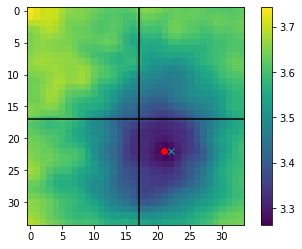

In [18]:
xx, yy = 2,13
LLsm = LLsmoother(LLspace2[xx,yy,:,:])
plt.imshow(LLsm)
plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
plt.plot(centers2[xx,yy,0]+NX//2-crop_edge, centers2[xx,yy,1]+NX//2-crop_edge, 'r.')
plt.plot(centers3[xx,yy,0]+NX//2-crop_edge, centers3[xx,yy,1]+NX//2-crop_edge, 'ro')
plt.plot(centers1[xx,yy,0]+NX//2-crop_edge, centers1[xx,yy,1]+NX//2-crop_edge, 'cx')
plt.colorbar()
plt.show()

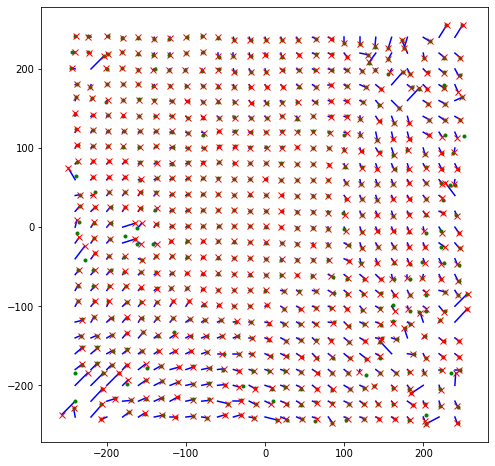

In [19]:
plt.figure(figsize=(8,8))
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers3[xx,yy,0]+locs[xx]], [locs[yy], centers3[xx,yy,1]+locs[yy]],'b')
        plt.plot(centers1[xx,yy,0]+locs[xx], centers1[xx,yy,1]+locs[yy],'g.')
        plt.plot(centers3[xx,yy,0]+locs[xx], centers3[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')
plt.show()

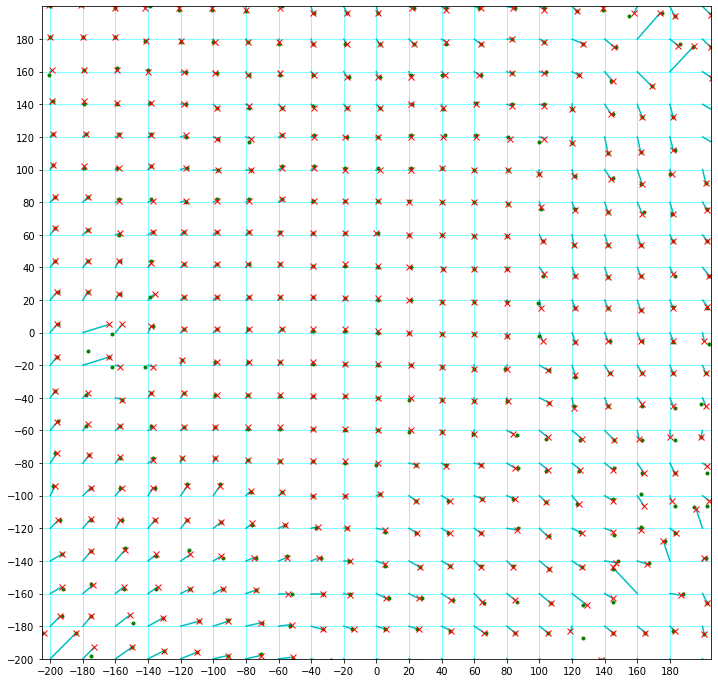

In [29]:
fig = plt.figure(figsize=(12,12))
ax = fig.gca()
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers3[xx,yy,0]+locs[xx]], [locs[yy], centers3[xx,yy,1]+locs[yy]],'c')
        plt.plot(centers1[xx,yy,0]+locs[xx], centers1[xx,yy,1]+locs[yy],'g.')
        plt.plot(centers3[xx,yy,0]+locs[xx], centers3[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')

plt.xlim([-200,200])
plt.ylim([-200,200])
ax.set_xticks(np.arange(-200, 200, 20))
ax.set_yticks(np.arange(-200, 200, 20))
ax.grid()
ax.grid(linestyle='-', linewidth='0.5', color='cyan')

plt.show()

112.51429851182999


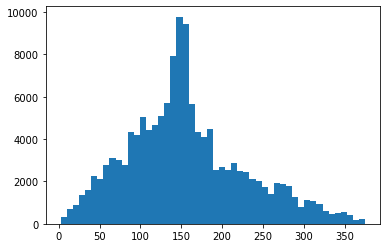

In [27]:
print(pixPerDeg*3)
ers = np.sqrt(np.add(np.square(ex), np.square(ey)))
plt.hist(ers[valdata],bins=50)
plt.show()

In [26]:
ers.shape

(174338,)

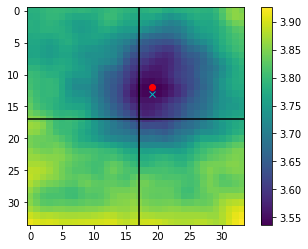

[ 2. -5.]


In [102]:
xx, yy = 18,16
LLsm = LLsmoother(LLspace2[xx,yy,:,:])
plt.imshow(LLsm)
plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
plt.plot(centers2[xx,yy,0]+NX//2-crop_edge, centers2[xx,yy,1]+NX//2-crop_edge, 'r.')
plt.plot(centers3[xx,yy,0]+NX//2-crop_edge, centers3[xx,yy,1]+NX//2-crop_edge, 'ro')
plt.plot(centers1[xx,yy,0]+NX//2-crop_edge, centers1[xx,yy,1]+NX//2-crop_edge, 'cx')
plt.colorbar()
plt.show()
print(centers3[xx,yy,:])

In [91]:
100/pixPerDeg

2.666327782050362

## Regularization based on weighted neighboring LL surfaces

In [19]:
LLspace2 = deepcopy(LLspace1)
wsp = 0.5 # how much to weight neighboring LL surfaces
for xx in range(Npos):
    for yy in range(Npos):
        Lsm = LLsmoother(LLspace1[xx,yy,:,:])
        if xx > 0:
            LLspace2[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx-1,yy,:,:])
        if yy > 0:
            LLspace2[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy-1,:,:])
        if xx < Npos-1:
            LLspace2[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx+1,yy,:,:])
        if yy < Npos-1:
            LLspace2[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy+1,:,:])

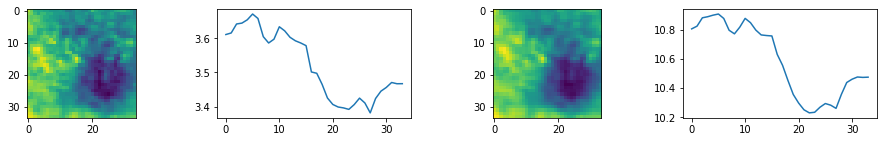

In [54]:
xx, yy = 3, 3
DU.subplot_setup(1,4)
plt.subplot(1,4,1)
plt.imshow(LLspace1[xx,yy,:,:])
plt.subplot(1,4,2)
plt.plot(LLspace1[xx,yy,17,:])
plt.subplot(1,4,3)
plt.imshow(LLspace2[xx,yy,:,:])
plt.subplot(1,4,4)
plt.plot(LLspace2[xx,yy,17,:])

plt.show()

In [20]:
centers4 = deepcopy(centers1)
for xx in range(Npos):
    for yy in range(Npos):
            
            min1 = np.argmin(np.min(LLspace2[xx,yy,:,:],axis=0))
            min2 = np.argmin(np.min(LLspace2[xx,yy,:,:],axis=1))
            centers4[xx,yy,:] = [min1-NX//2+crop_edge, min2-NX//2+crop_edge]
            print("%3.0f %3.0f: \t(%2d, %2d)"%(locs[xx], locs[yy], 
                                               min1-NX//2+crop_edge,min2-NX//2+crop_edge))


-240 -240: 	(-2, 12)
-240 -220: 	(-2, 12)
-240 -200: 	(16, 16)
-240 -180: 	(16, 16)
-240 -160: 	( 9,  8)
-240 -140: 	( 8,  3)
-240 -120: 	( 8,  3)
-240 -100: 	( 4,  7)
-240 -80: 	( 4,  6)
-240 -60: 	(12, 16)
-240 -40: 	(-9, -11)
-240 -20: 	(12, 16)
-240   0: 	( 5,  7)
-240  20: 	( 4,  5)
-240  40: 	(-9, 15)
-240  60: 	( 1,  5)
-240  80: 	(-9, 15)
-240 100: 	( 2,  4)
-240 120: 	( 1,  4)
-240 140: 	( 1,  4)
-240 160: 	( 1,  4)
-240 180: 	( 2,  1)
-240 200: 	(16, 16)
-240 220: 	(-4,  1)
-240 240: 	( 0,  1)
-220 -240: 	(-2, 13)
-220 -220: 	(14, 16)
-220 -200: 	(16, 16)
-220 -180: 	(16, 16)
-220 -160: 	( 8,  3)
-220 -140: 	( 8,  3)
-220 -120: 	( 5,  5)
-220 -100: 	( 4,  6)
-220 -80: 	( 5,  6)
-220 -60: 	( 5,  6)
-220 -40: 	(12, 16)
-220 -20: 	( 5,  6)
-220   0: 	( 4,  5)
-220  20: 	( 5,  5)
-220  40: 	( 5,  5)
-220  60: 	(-9, 15)
-220  80: 	( 3,  3)
-220 100: 	( 2,  3)
-220 120: 	( 2,  3)
-220 140: 	( 1,  3)
-220 160: 	( 1,  3)
-220 180: 	(16, 16)
-220 200: 	(16, 16)
-220 220: 	(16, 16)
-22

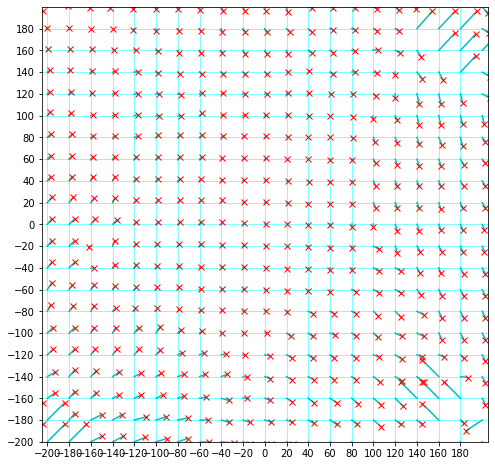

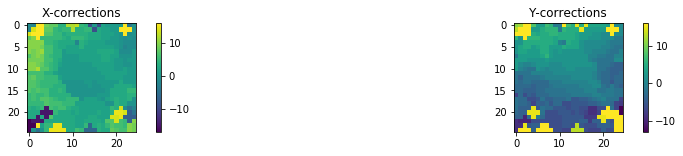

In [57]:
# 0.5 weight
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers4[xx,yy,0]+locs[xx]], [locs[yy], centers4[xx,yy,1]+locs[yy]],'c')
        plt.plot(centers4[xx,yy,0]+locs[xx], centers4[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')

plt.xlim([-200,200])
plt.ylim([-200,200])
ax.set_xticks(np.arange(-200, 200, 20))
ax.set_yticks(np.arange(-200, 200, 20))
ax.grid()
ax.grid(linestyle='-', linewidth='0.5', color='cyan')
plt.show()

DU.subplot_setup(1,2)
plt.subplot(1,2,1)
plt.imshow(centers4[:,:,0])
plt.colorbar()
plt.title('X-corrections')
plt.subplot(1,2,2)
plt.imshow(centers4[:,:,1])
plt.colorbar()
plt.title('Y-corrections')
plt.show()

### This is the one we use (0.25 weight):

In [35]:
LLspace3 = deepcopy(LLspace1)
wsp = 0.25 # how much to weight neighboring LL surfaces
for xx in range(Npos):
    for yy in range(Npos):
        Lsm = LLsmoother(LLspace1[xx,yy,:,:])
        if xx > 0:
            LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx-1,yy,:,:])
        if yy > 0:
            LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy-1,:,:])
        if xx < Npos-1:
            LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx+1,yy,:,:])
        if yy < Npos-1:
            LLspace3[xx,yy,:,:] += wsp*LLsmoother(LLspace1[xx,yy+1,:,:])

In [36]:
centers5 = deepcopy(centers1)
for xx in range(Npos):
    for yy in range(Npos):
            
            min1 = np.argmin(np.min(LLspace3[xx,yy,:,:],axis=0))
            min2 = np.argmin(np.min(LLspace3[xx,yy,:,:],axis=1))
            centers5[xx,yy,:] = [min1-NX//2+crop_edge, min2-NX//2+crop_edge]
            #print("%3.0f %3.0f: \t(%2d, %2d)"%(locs[xx], locs[yy], 
            #                                   min1-NX//2+crop_edge,min2-NX//2+crop_edge))

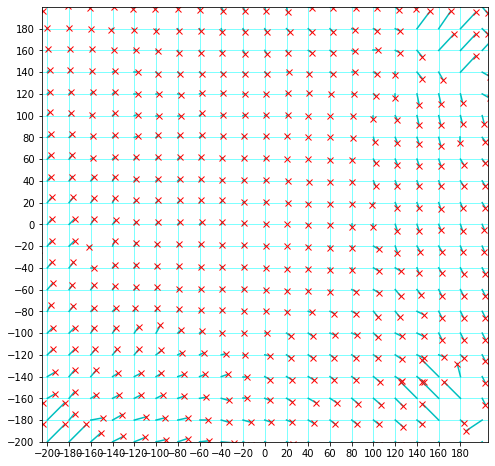

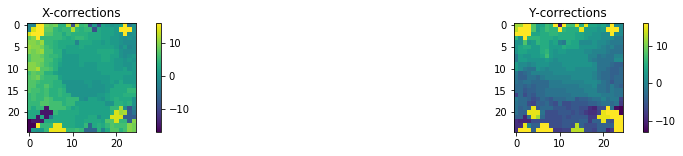

In [37]:
# 0.25 weight
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
for xx in range(Npos):
    for yy in range(Npos):
        plt.plot([locs[xx],centers5[xx,yy,0]+locs[xx]], [locs[yy], centers5[xx,yy,1]+locs[yy]],'c')
        plt.plot(centers5[xx,yy,0]+locs[xx], centers5[xx,yy,1]+locs[yy],'rx')
plt.axis('equal')

plt.xlim([-200,200])
plt.ylim([-200,200])
ax.set_xticks(np.arange(-200, 200, 20))
ax.set_yticks(np.arange(-200, 200, 20))
ax.grid()
ax.grid(linestyle='-', linewidth='0.5', color='cyan')
plt.show()

DU.subplot_setup(1,2)
plt.subplot(1,2,1)
plt.imshow(centers5[:,:,0])
plt.colorbar()
plt.title('X-corrections')
plt.subplot(1,2,2)
plt.imshow(centers5[:,:,1])
plt.colorbar()
plt.title('Y-corrections')
plt.show()

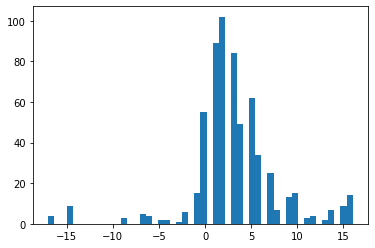

In [38]:
# First: bound corrections 
plt.hist(corrlist[:,2],50)
#plt.xlim([-10,8.5])
plt.show()

In [43]:
corrgrid = deepcopy(centers5)
a = np.where(corrgrid > 8.0)
corrgrid[a] = 8.0
b = np.where(corrgrid < -8)
corrgrid[b] = -8

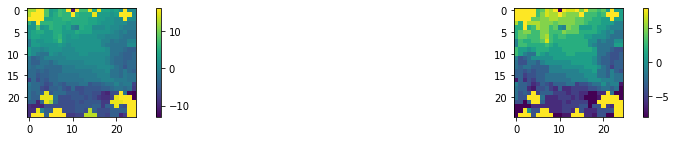

In [44]:
DU.subplot_setup(1,2)
plt.subplot(1,2,1)
plt.imshow(centers5[:,:,1])
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(corrgrid[:,:,1])
plt.colorbar()
plt.show()

In [25]:
coords = np.zeros([25*25,4])
nn = 0
for xx in range(Npos):
    for yy in range(Npos):
        coords[nn,:] = [locs[xx], locs[yy], corrgrid[xx,yy,0], corrgrid[xx,yy,1]]
        nn += 1

In [45]:
sio.savemat(dirname+'Marmo20191231_eyecor0.mat', {'corr_grid':corrgrid, 'corr_list': coords, 'locs':locs})

# Apply eye corrections

In [27]:
matdat = sio.loadmat(dirname+'Marmo20191231_eyecor0.mat')
corrgrid = matdat['corr_grid'].astype(int)
corrlist = matdat['corr_list']
locs = list(range(-240,260,20))
Npos = len(locs)
print(Npos, locs)

25 [-240, -220, -200, -180, -160, -140, -120, -100, -80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]


In [13]:
binnedex = np.minimum(np.maximum(np.round(np.divide(deepcopy(ex)+240, 20)), 0), 24).astype(int)
binnedey = np.minimum(np.maximum(np.round(np.divide(deepcopy(ey)+240, 20)), 0), 24).astype(int)
print(corrgrid.shape)

(25, 25, 2)


In [69]:
stim_fixes = np.zeros([NTfull, 2], dtype='int32')
for tt in range(NTfull):
    stim_fixes[tt,:] = corrgrid[binnedex[tt], binnedey[tt], :]

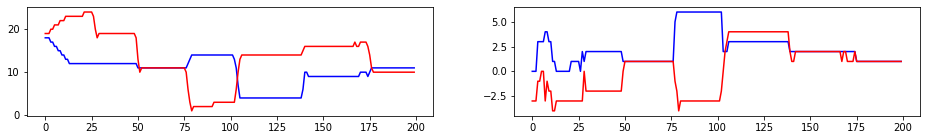

In [46]:
DU.subplot_setup(1,2)
plt.subplot(1,2,1)
plt.plot(binnedex[range(200)],'b')
plt.plot(binnedey[range(200)],'r')
plt.subplot(1,2,2)
plt.plot(stim_fixes[range(200),0],'b')
plt.plot(stim_fixes[range(200),1],'r')
plt.show()

### ALTERNATIVE -- interpolation (this is one we use)

In [10]:
matdat = sio.loadmat(dirname+'Marmo20191231_eyecor2.mat')
corrgrid = matdat['corr_grid'].astype(int)
corrlist = matdat['corr_list']
matdat = sio.loadmat(dirname+'Data1231eyecorr_v2.mat')
LLspace = matdat['LLspace']
centers_old = matdat['centers']
locs = matdat['locs']
#matdat.keys()

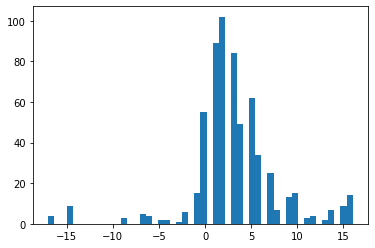

In [31]:
# First: bound corrections 
plt.hist(corrlist[:,2],50)
#plt.xlim([-10,8.5])
plt.show()

In [37]:
corrgrid2 = deepcopy(corrgrid)
a = np.where(corrgrid2 > 8.0)
corrgrid2[a] = 8.0
b = np.where(corrgrid2 < -8)
corrgrid2[b] = -8

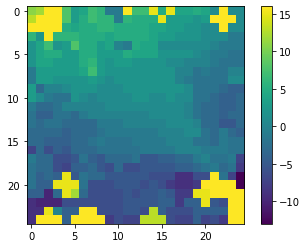

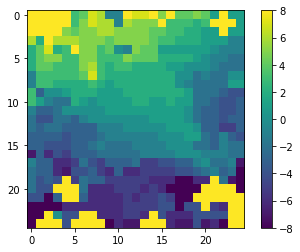

In [38]:
plt.imshow(corrgrid[:,:,1])
plt.colorbar()
plt.show()
plt.imshow(corrgrid2[:,:,1])
plt.colorbar()
plt.show()

In [ ]:
# Interpolate

In [16]:
scx = np.divide(deepcopy(ex)+240, 20)
scy = np.divide(deepcopy(ey)+240, 20)

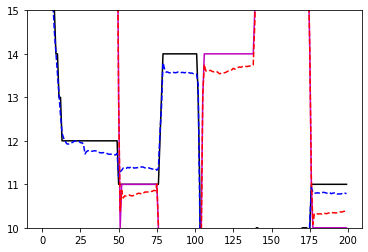

In [19]:
plt.plot(binnedex[range(200)],'k')
plt.plot(binnedey[range(200)],'m')
plt.plot(scx[range(200)],'b--')
plt.plot(scy[range(200)],'r--')
plt.ylim([10,15])
plt.show()

In [50]:
xlow = np.minimum(np.maximum(np.floor(scx), 0), len(locs)-1).astype(int)
ylow = np.minimum(np.maximum(np.floor(scy), 0), len(locs)-1).astype(int)
xhigh = np.minimum(np.maximum(np.ceil(scx), 0), len(locs)-1).astype(int)
yhigh = np.minimum(np.maximum(np.ceil(scy), 0), len(locs)-1).astype(int)
dx = np.add(scx, -xlow)
dy = np.add(scy, -ylow)

In [52]:
x1s = np.add(
    np.multiply(corrgrid2[xlow, ylow, 0], dx),
    np.multiply(corrgrid2[xhigh, ylow, 0], 1-dx))

In [60]:
dx[tt]*corrgrid2[xlow[tt], ylow[tt], 0] + (1-dx[tt])*corrgrid2[xhigh[tt], ylow[tt], 0]

3.2659866711688856

In [72]:
#stim_fixes = np.zeros([NTfull, 2], dtype='int32')
stim_fixesC = np.zeros([NTfull, 2])
for tt in range(NTfull):
    #stim_fixes[tt,:] = corrgrid[binnedex[tt], binnedey[tt], :]
    x1 = (1-dx[tt])*corrgrid2[xlow[tt], ylow[tt], 0] + dx[tt]*corrgrid2[xhigh[tt], ylow[tt], 0]
    x2 = dx[tt]*corrgrid2[xlow[tt], yhigh[tt], 0] + dx[tt]*corrgrid2[xhigh[tt], yhigh[tt], 0]
    stim_fixesC[tt,0] = (1-dy[tt])*x1 + dy[tt]*x2

    y1 = (1-dy[tt])*corrgrid2[xlow[tt], ylow[tt], 1] + dy[tt]*corrgrid2[xlow[tt], yhigh[tt], 1]
    y2 = (1-dy[tt])*corrgrid2[xhigh[tt], ylow[tt], 1] + dy[tt]*corrgrid2[xhigh[tt], yhigh[tt], 1]
    stim_fixesC[tt,1] = (1-dx[tt])*y1 + dx[tt]*y2
stim_fixes = np.round(stim_fixesC).astype(int)

In [56]:
stim_fixes0 = np.zeros([NTfull, 2], dtype='int32')
for tt in range(NTfull):
    stim_fixes0[tt,:] = corrgrid[binnedex[tt], binnedey[tt], :]

In [63]:
tt = 1
print(scx[tt], scy[tt])
print(dx[tt], dy[tt])
print(corrgrid2[xlow[tt], ylow[tt], 0], corrgrid2[xhigh[tt], ylow[tt], 0])
print(corrgrid2[xlow[tt], yhigh[tt], 0], corrgrid2[xhigh[tt], yhigh[tt], 0])
print('y')
print(corrgrid2[xlow[tt], ylow[tt], 1], corrgrid2[xhigh[tt], ylow[tt], 1])
print(corrgrid2[xlow[tt], yhigh[tt], 1], corrgrid2[xhigh[tt], yhigh[tt], 1])

18.346802665766223 19.03649131846131
0.3468026657662229 0.03649131846130871
0 5
4 4
y
-3 -6
-2 -6


In [73]:
tt = 1
print(stim_fixes0[tt,:], stim_fixes1[tt,:], stim_fixes_c[tt,:], stim_fixes[tt,:])

[ 0 -3] [ 1 -4] [ 1.77197919 -4.01657197] [ 2 -4]


### Perform corrections

In [74]:
stim2d = np.reshape( stim.copy(), [NTfull,NX,NX])
for tt in range(NT):
    stim2d[tt,:,:] = NDNutils.shift_mat_zpad( stim2d[tt,:,:], -stim_fixes[tt,0], dim=1)
    stim2d[tt,:,:] = NDNutils.shift_mat_zpad( stim2d[tt,:,:], -stim_fixes[tt,1], dim=0)
Cstim = np.reshape(stim2d,[NTfull,NX*NX])
Cstim.shape

(174338, 1600)

In [76]:
num_lags=10
XstimC = NDNutils.create_time_embedding(Cstim, [num_lags, NX, NX], tent_spacing=1)

-1 -2 -3.423649


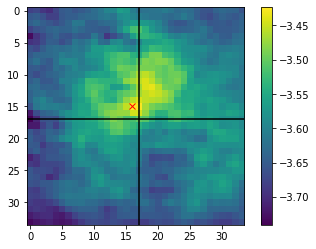

In [72]:
# Check likelihood map for models fit to all data (this should hopefully be centered at 0) -- ORIGINAL (XstimL)
x0 = 100.0
y0 = 20.0
Erad = 20.0# in pixels
rs = np.sqrt(np.add(np.square(ex-x0), np.square(ey-y0)))
valE = np.where(rs < Erad)[0]
valtot = np.intersect1d(valdata, valE)
#print(len(valE), len(valtot))

mod2 = base_mod.copy_model()
mod2.set_poisson_norm(Robs[valtot,:])

crop_edge=3
Rcc = conv_expand( Robs[valtot,:], num_space )
preds = cell_shift_mod.generate_prediction(input_data=[Xstim[valtot,:], Xsac1[valtot,:], Xsac2[valtot,:]])
Nspks = np.maximum(np.sum(Rcc,axis=0), 1)
LLs = np.divide( np.sum(np.add(np.multiply(Rcc, np.log(np.maximum(preds,1e-12))), -preds), axis=0), Nspks)
LLsp = np.mean( np.reshape(LLs,[NX,NX,NC]), axis=2)
tmp = LLsp[crop_edge:-crop_edge,:]
LLcrop = tmp[:,crop_edge:-crop_edge]

plt.imshow(LLcrop)
plt.colorbar()

min1 = np.argmax(np.max(LLcrop,axis=0))
min2 = np.argmax(np.max(LLcrop,axis=1))
print(min1-NX//2+crop_edge,min2-NX//2+crop_edge, np.max(LLcrop))
plt.imshow(LLcrop)
plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
plt.plot(min1,min2,'rx')

plt.show()

0 0 -3.3339992


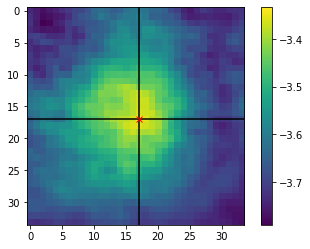

In [79]:
# Check likelihood map for models fit to all data (this should hopefully be centered at 0) -- ORIGINAL (XstimL)
x0 = -200.0
y0 = 120.0
Erad = 30.0# in pixels
rs = np.sqrt(np.add(np.square(ex-x0), np.square(ey-y0)))
valE = np.where(rs < Erad)[0]
valtot = np.intersect1d(valdata, valE)
#print(len(valE), len(valtot))

mod2 = base_mod.copy_model()
mod2.set_poisson_norm(Robs[valtot,:])

crop_edge=3
Rcc = conv_expand( Robs[valtot,:], num_space )
preds = cell_shift_mod.generate_prediction(input_data=[XstimC[valtot,:], Xsac1[valtot,:], Xsac2[valtot,:]])
Nspks = np.maximum(np.sum(Rcc,axis=0), 1)
LLs = np.divide( np.sum(np.add(np.multiply(Rcc, np.log(np.maximum(preds,1e-12))), -preds), axis=0), Nspks)
LLsp = np.mean( np.reshape(LLs,[NX,NX,NC]), axis=2)
tmp = LLsp[crop_edge:-crop_edge,:]
LLcrop = tmp[:,crop_edge:-crop_edge]

plt.imshow(LLcrop)
plt.colorbar()

min1 = np.argmax(np.max(LLcrop,axis=0))
min2 = np.argmax(np.max(LLcrop,axis=1))
print(min1-NX//2+crop_edge,min2-NX//2+crop_edge, np.max(LLcrop))
plt.imshow(LLcrop)
plt.plot([(NX//2)-crop_edge,(NX//2)-crop_edge],[-0.5,(NX-0.5)-2*crop_edge],'k')
plt.plot([-0.5,(NX-0.5)-2*crop_edge],[NX//2-crop_edge,(NX//2)-crop_edge],'k')
plt.plot(min1,min2,'rx')

plt.show()

In [80]:
# Output stimulus for modeling
sio.savemat(dirname+'Cstim3.mat', {'Cstim':Cstim})

## Check STA

In [81]:
# ORIGINAL STA
stas = np.reshape(np.matmul(np.transpose(Xstim[valdata,:]),Robs[valdata,:]), [NP,num_lags, NC])/len(valdata)
# CORRECTED STA
Cstas = np.reshape(np.matmul(np.transpose(XstimC[valdata,:]),Robs[valdata,:]), [NP,num_lags, NC])/len(valdata)

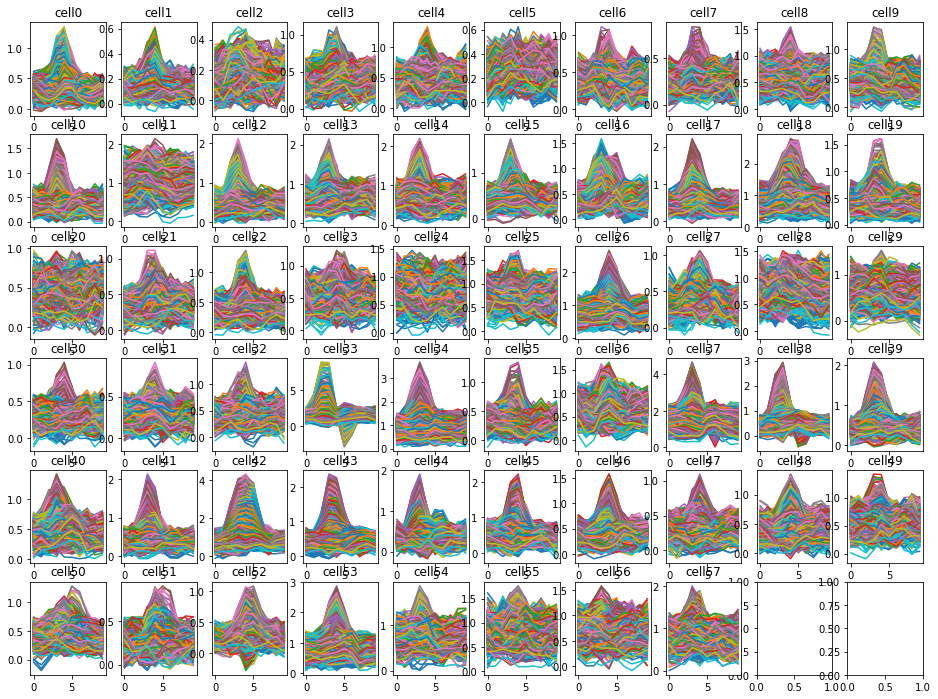

In [71]:
DU.subplot_setup(6,10)
for cc in range(NC):
    plt.subplot(6,10,cc+1)
    plt.plot(np.transpose(stas[:,:,cc]))
    plt.title('cell'+str(cc))
plt.show()

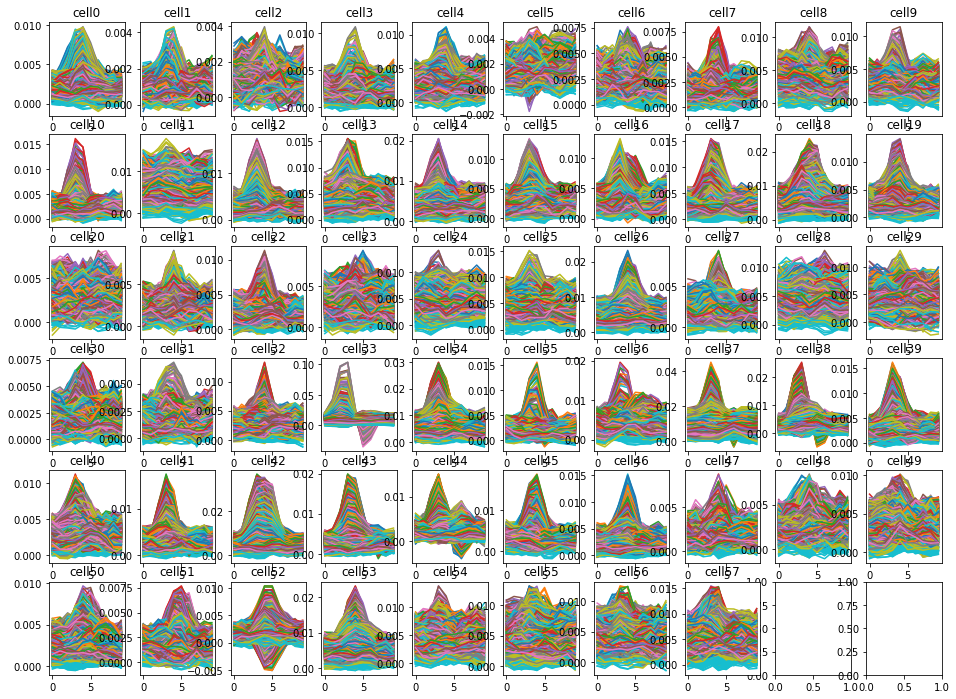

In [82]:
## NEWEST
DU.subplot_setup(6,10)
for cc in range(NC):
    plt.subplot(6,10,cc+1)
    plt.plot(np.transpose(Cstas[:,:,cc]))
    plt.title('cell'+str(cc))
plt.show()

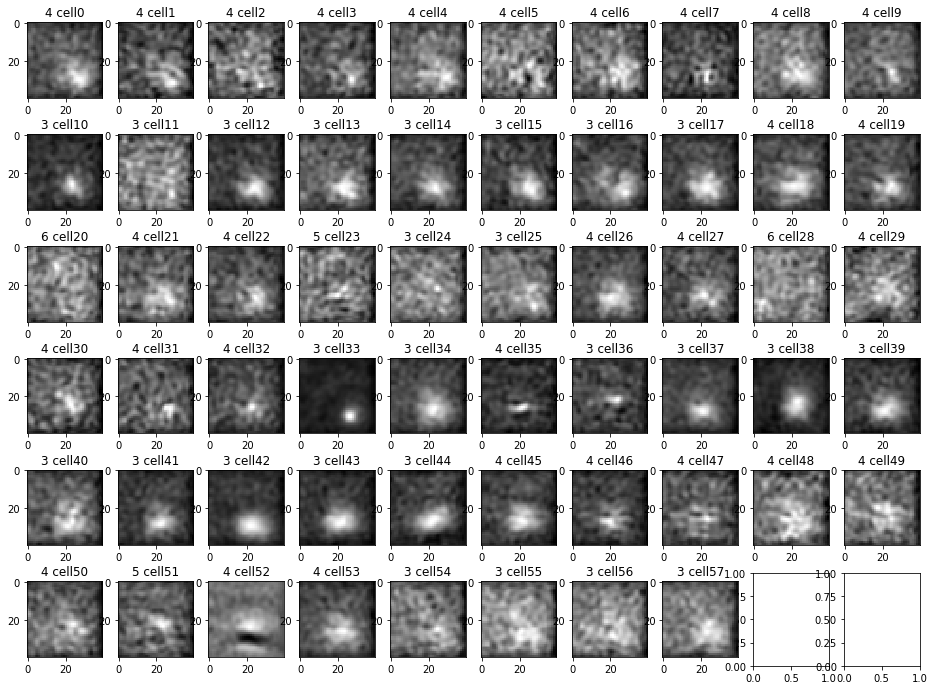

In [83]:
DU.subplot_setup(6,10)
for cc in range(NC):
    plt.subplot(6,10,cc+1)
    #plt.plot(np.transpose(stas[:,:,cc]))
    bestlag = np.argmax(np.max(abs(Cstas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(Cstas[:,bestlag,cc], [NX, NY]), cmap='gray')  #RdBu_r 
               #vmin=-np.max(abs(stas[:,:,cc])), vmax=np.max(abs(stas[:,:,cc])))
    plt.title(str(bestlag)+' cell'+str(cc),)
plt.show()

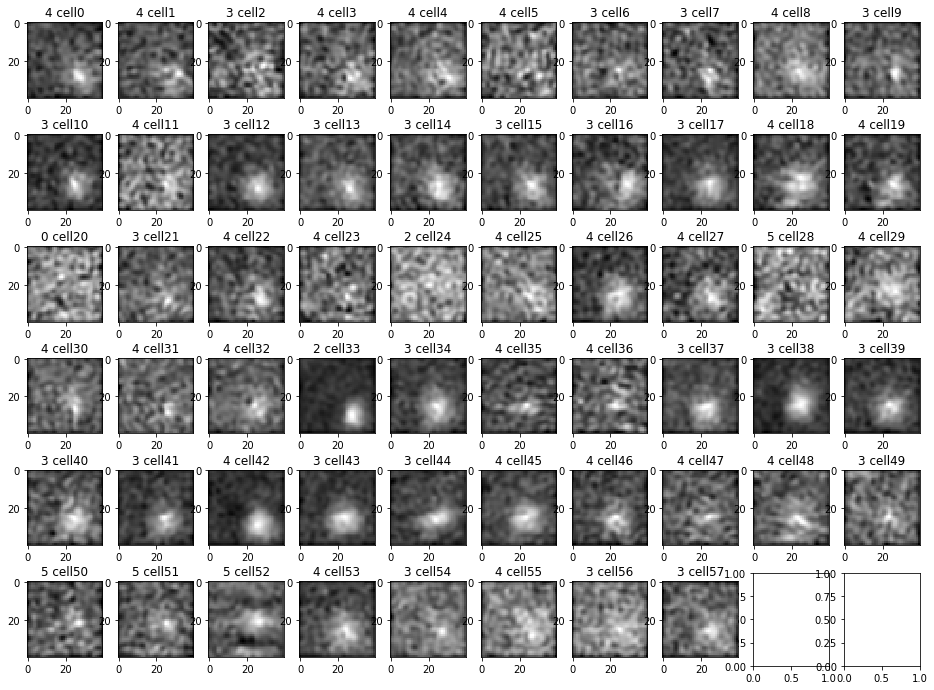

In [73]:
DU.subplot_setup(6,10)
for cc in range(NC):
    plt.subplot(6,10,cc+1)
    #plt.plot(np.transpose(stas[:,:,cc]))
    bestlag = np.argmax(np.max(abs(stas[:,:,cc]),axis=0))
    plt.imshow(np.reshape(stas[:,bestlag,cc], [NX, NY]), cmap='gray')  #RdBu_r 
               #vmin=-np.max(abs(stas[:,:,cc])), vmax=np.max(abs(stas[:,:,cc])))
    plt.title(str(bestlag)+' cell'+str(cc),)
plt.show()